In [1]:
import os, sys
print(sys.executable) # works this time
print(sys.version)
print(sys.version_info)
import scanpy as sc
from sklearn.cross_decomposition import CCA
from sklearn.manifold import TSNE
from scipy.sparse import csr_matrix
from scipy.sparse import csr_matrix
import numpy as np
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd
import random

I:\mutiomics\pythonProject\.venv\Scripts\python.exe
3.10.11 (tags/v3.10.11:7d4cc5a, Apr  5 2023, 00:38:17) [MSC v.1929 64 bit (AMD64)]
sys.version_info(major=3, minor=10, micro=11, releaselevel='final', serial=0)


In [2]:
adata1 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\E2.h5ad")
adata2 = sc.read_h5ad("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\E1.h5ad")

In [5]:
adata1.obsm['spatial']

array([[11627, 27242],
       [33997, 34796],
       [ 5233, 22196],
       ...,
       [ 7826,  4507],
       [ 7549, 16129],
       [29054, 29243]], dtype=int64)

In [8]:
import anndata
import pandas as pd

# 读取 h5ad 文件

# 提取表达矩阵和位置信息
expression_matrix = adata2.X
positions = pd.DataFrame({
    '0': adata2.obs["spatialX"],
    '1': adata2.obs["spatialY"]
})  # 假设位置信息在 obs 中，列名为 'x' 和 'y'
cluster = adata2.obs["clusters"]
# 将数据保存为 CSV 文件，方便在 R 中读取
#pd.DataFrame(expression_matrix.toarray()).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_expression.csv", index=False)
#pd.DataFrame(positions).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_position.csv", index=False)
#pd.DataFrame(cluster).to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\B2_cluster.csv", index=False)


In [5]:
adata2.obs

,in_tissue,array_row,array_col,mt_frac,total_counts,n_counts,n_genes,clusters,leiden,spatialX,spatialY
GGTTCGGATTATACTA-1,1,39,7,0.0,16673.0,16673.0,4899,3,3,6686,23710
ATACTCTCGCCACTCT-1,1,9,25,0.0,12507.0,12507.0,3974,0,0,10744,7748
ATCGACTCTTTCCGTT-1,1,23,61,0.0,8319.0,8319.0,3276,7,7,22359,15607
CTTTACCGAATAGTAG-1,1,50,84,0.0,10004.0,10004.0,3640,0,0,29054,29243
AGTACGGCCCGTATCG-1,1,35,11,0.0,13473.0,13473.0,4228,2,2,7846,21687
...,...,...,...,...,...,...,...,...,...,...,...
TGGCCAAACTGAAGTA-1,1,28,76,0.0,7256.0,7256.0,3040,5,5,24131,16443
TAAAGCGTTAGGAGAA-1,1,28,88,0.0,12627.0,12627.0,4441,7,7,27284,16446
GTTACGAAATCCACGC-1,1,3,33,0.0,14622.0,14622.0,4782,4,4,14216,5510
GCGAGGGACTGCTAGA-1,1,1,7,0.0,10802.0,10802.0,3806,3,3,6665,4508


In [9]:
adata1.obs["leiden"] = adata1.obs["clusters"]
adata2.obs["leiden"] = adata2.obs["clusters"]

[<Axes: title={'center': 'clusters'}, xlabel='spatial1', ylabel='spatial2'>]

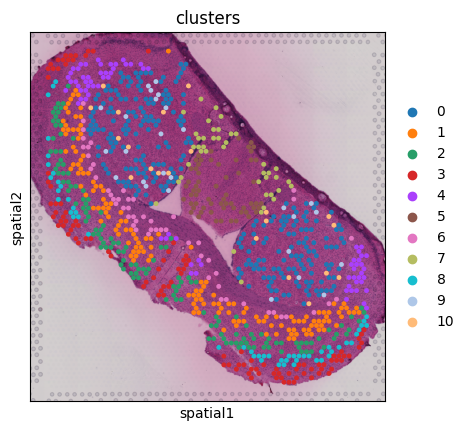

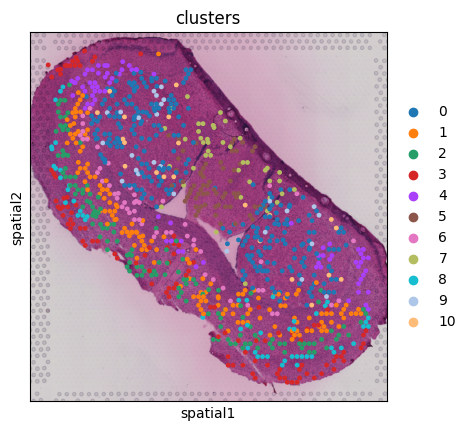

In [10]:
import matplotlib.pyplot as plt
sc.pl.spatial(adata1, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_9AA_VisiumArray_plot.pdf")
sc.pl.spatial(adata2, img_key = "hires", color="clusters", size=1.5, show=False)
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\m3_visium_ctrl.pdf")

In [11]:
data1_pca_results = adata1.obsm['spatial']  # PCA 结果
pca_leiden = adata1.obs["leiden"]
data1_leiden_str = pca_leiden.to_numpy()

data2_pca_results = adata2.obsm['X_umap']  # PCA 结果
pca_leiden = adata2.obs["leiden"]
data2_leiden_str = pca_leiden.to_numpy()

def var_select(df, m1, m2, n):
    # 1. 筛选出列均值在 m1 和 m2 之间的行
    filtered_df = df.loc[:,(df.mean() > m1) & (df.mean() < m2)]

    # 2. 计算每行的方差，并选择前 n 个最大值所对应的索引
    variances = filtered_df.var(axis=0)/filtered_df.mean()
    sorted_indices = variances.sort_values(ascending=False).index
    selected_indices = sorted_indices[:n]

    return selected_indices.tolist()


def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
        
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix

In [12]:
#####spatial alignment of data3(metabolic) and data2(spatial) using CCA
def rotate_point_90_degrees(row):
    new_x = -row[0]
    new_y = row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_minus_x(row):
    new_x = -row[0]
    new_y = -row[1]
    return pd.Series({0: new_x, 1: new_y})

def flip_around_y_plus_x(row):
    new_x = row[1]
    new_y = row[0]
    return pd.Series({0: new_x, 1: new_y})
    
def center_and_scale(data, feature_range=(-100, 100)):
    """
    对数据进行中心缩放和范围缩放
    """
    # 中心缩放
    scaler_center = StandardScaler()
    data_centered = scaler_center.fit_transform(data)
    
    # 范围缩放
    scaler_range = MinMaxScaler(feature_range=feature_range)
    data_scaled = scaler_range.fit_transform(data_centered)
    
    return data_scaled
    
from sklearn.preprocessing import MinMaxScaler
#scaler = MinMaxScaler(feature_range=(-100, 100))
data3_spatial_results = pd.DataFrame(adata1.obsm['spatial'])
#scaled_data = scaler.fit_transform(data3_spatial_results)
scaled_data = center_and_scale(data3_spatial_results)
data3_spatial_results = pd.DataFrame(scaled_data, columns=data3_spatial_results.columns)
print(data3_spatial_results.head)
data2_spatial_results = pd.DataFrame(adata2.obsm['spatial'])
#scaled_data = scaler.fit_transform(data2_spatial_results)
scaled_data = center_and_scale(data2_spatial_results)
data2_spatial_results = pd.DataFrame(scaled_data, columns=data2_spatial_results.columns)

data2_spatial_results=pd.DataFrame(data2_spatial_results)
data3_spatial_results=pd.DataFrame(data3_spatial_results)
#data3_spatial_results = data3_spatial_results.apply(rotate_point_90_degrees, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_minus_x, axis=1)
#data3_spatial_results = data3_spatial_results.apply(flip_around_y_plus_x, axis=1)
data1_spatial_results = data3_spatial_results
data1_spatial_results=pd.DataFrame(data1_spatial_results)
data1_spatial_results = data1_spatial_results +400
data2_spatial_results = data2_spatial_results +400
data3_spatial_results = data3_spatial_results +400

<bound method NDFrame.head of              0          1
0   -88.877452   2.740440
1   -60.651208 -76.268626
2    -3.965760 -39.475878
3    32.305775  31.567156
4   -82.592914  -7.799312
..         ...        ...
995  19.650016 -26.336355
996  38.530718 -26.357195
997 -48.082132 -92.080859
998 -88.991223 -97.301240
999  51.256908  94.732729

[1000 rows x 2 columns]>


C:\Users\28123\AppData\Local\Temp\ipykernel_5872\2480795906.py:37: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)


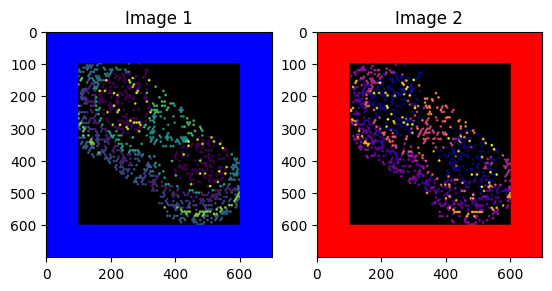

In [ ]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm

def create_image_from_data(data, width=500, height=500, dot_size=5, border_size=50, dot_colors=None, border_color=(0, 0, 0), colormap='viridis'):
    """
    Create an image from 2D data points with specified dot size, border size, and colors.

    Parameters:
    - data: 2D numpy array where data[0] contains x coordinates and data[1] contains y coordinates
    - width: Width of the image
    - height: Height of the image
    - dot_size: Size of the dots
    - border_size: Size of the border around the image
    - dot_colors: List of scalar values for each dot, which will be mapped to colors using a colormap
    - border_color: Color of the border (BGR format)
    - colormap: Colormap to use for mapping scalar values to colors
    
    Returns:
    - bordered_image: Image with data points and border
    """
    # Initialize an empty image with three channels for color
    image = np.zeros((height, width, 3), dtype=np.uint8)

    # Normalize data points to image dimensions
    x_norm = np.interp(data[0], (data[0].min(), data[0].max()), (0, width-1))
    y_norm = np.interp(data[1], (data[1].min(), data[1].max()), (0, height-1))

    # Normalize dot_colors to [0, 1] range
    if dot_colors is not None:
        norm = plt.Normalize(vmin=min(dot_colors), vmax=max(dot_colors))
        cmap = cm.get_cmap(colormap)
        mapped_colors = cmap(norm(dot_colors))

    # Draw circles at normalized positions
    for i, (x, y) in enumerate(zip(x_norm, y_norm)):
        if dot_colors is not None:
            color = (mapped_colors[i][:3] * 255).astype(int)  # Convert to BGR format
            color = tuple(map(int, color[::-1]))  # Convert from RGB to BGR
        else:
            color = (255, 255, 255)  # Default white color
        cv2.circle(image, (int(x), int(y)), dot_size, color, -1)  # -1 means filled circle

    # Add border
    bordered_image = cv2.copyMakeBorder(image, border_size, border_size, border_size, border_size, 
                                        cv2.BORDER_CONSTANT, value=border_color)

    return bordered_image

# Simulated scalar values
dot_colors_1 = data1_leiden_str.astype(int)
dot_colors_2 = data2_leiden_str.astype(int)

# Create images
img1 = create_image_from_data(data3_spatial_results, width=500, height=500, dot_size=4, border_size=100, dot_colors=dot_colors_1, border_color=(255, 0, 0), colormap='viridis')
img2 = create_image_from_data(data2_spatial_results, width=500, height=500, dot_size=4, border_size=100, dot_colors=dot_colors_2, border_color=(0, 0, 255), colormap='plasma')

# Display images using matplotlib
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title('Image 2')

plt.show()


import cv2
import numpy as np
import matplotlib.pyplot as plt

# Lists to store points
points_image1 = []
points_image2 = []

def click_event_image1(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image1.append((x, y))
        cv2.circle(img1_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 1', img1_display)

def click_event_image2(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        points_image2.append((x, y))
        cv2.circle(img2_display, (x, y), 5, (0, 255, 0), -1)
        cv2.imshow('Image 2', img2_display)

def compute_affine_transform(points_image1, points_image2):
    pts1 = np.float32(points_image1)
    pts2 = np.float32(points_image2)
    M = cv2.getAffineTransform(pts2[:3], pts1[:3])  # Use the first 3 points for affine transform
    return M

def warp_image(image, M, output_shape):
    warped_image = cv2.warpAffine(image, M, output_shape)
    return warped_image

# Load images
img1_display = img1.copy()
img2_display = img2.copy()

# Display images and set mouse callbacks
cv2.imshow('Image 1', img1_display)
cv2.imshow('Image 2', img2_display)
cv2.setMouseCallback('Image 1', click_event_image1)
cv2.setMouseCallback('Image 2', click_event_image2)

# Wait until 6 points are selected (3 from each image)
while len(points_image1) < 3 or len(points_image2) < 3:
    cv2.waitKey(1)

cv2.destroyAllWindows()

# Compute the transformation matrix
M = compute_affine_transform(points_image1, points_image2)
print("Transformation Matrix:\n", M)

# Apply the transformation to the second image
rows, cols = img1.shape[:2]
aligned_image = warp_image(img2, M, (cols, rows))

# Display the original and aligned images
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image 1')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(aligned_image, cv2.COLOR_BGR2RGB))
plt.title('Aligned Image 2')
plt.show()

M_homogeneous = np.vstack([M, [0, 0, 1]])

# Convert DataFrame to homogeneous coordinates
coordinates_data3 = data3_spatial_results  # Add a column of 1s
coordinates_data2 = data2_spatial_results  # Add a column of 1s

def apply_affine_transform_2d(coordinates, transformation_matrix):
    """
    对二维坐标应用仿射变换
    """
    # 添加齐次坐标
    homogeneous_coordinates = np.hstack([coordinates, np.ones((coordinates.shape[0], 1))])
    
    # 应用仿射变换
    transformed_coordinates = np.dot(homogeneous_coordinates, transformation_matrix.T)
    
    return transformed_coordinates[:, :2]

transformed_coordinates_data2 = apply_affine_transform_2d(coordinates_data2, M_homogeneous)
transformed_coordinates_data2 = pd.DataFrame(transformed_coordinates_data2)
# Apply the transformation matrix
#transformed_coordinates_data3 = coordinates_data3.dot(M_homogeneous.T)
#transformed_coordinates_data2 = coordinates_data2.dot(M)
# Update the DataFrame with the transformed coordinates
#print(transformed_coordinates_data2)
#print(data3_spatial_results)
#plt.title('Original Points')
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], color='red', label='data3 Points')
plt.scatter(transformed_coordinates_data2[0], transformed_coordinates_data2[1], color='blue', label='Original Points')


plt.legend()

print(transformed_coordinates_data2)
data2_spatial_results = transformed_coordinates_data2.iloc[:,0:2]
print(data2_spatial_results)

In [180]:
color_mapping = {
    0: 'blue',
    1: 'red',
    2: 'green',
    3: 'yellow',
    4: 'orange',
    5: 'purple',
    6: 'brown',
    7: 'pink',
    8: 'gray',
    9: 'cyan',
    10: 'magenta',
    11: 'cyan',
    12: 'blue',
    13: 'red',
    14: 'green',
    15: 'yellow'
}

In [181]:
X_c=pd.DataFrame(data1_spatial_results)
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)

In [182]:
import numpy as np
import pandas as pd
from scipy.spatial.distance import cdist
from scipy.optimize import minimize
import matplotlib.pyplot as plt

def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})
    new_df = pd.merge(new_df, df[['spatial_ID', "spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')
    return new_df

def perform_transformations(DF2, DF3, Y_c, Z_c, data2_leiden_str, data1_leiden_str):
    transform_matrix = np.array([[1., 0., 0.], [0., 1., 0.], [0., 0., 1.]])
    max_runs = 100
    run_count = 0
    while run_count < max_runs:
        run_count += 1
        distances = cdist(DF3, DF2, metric='euclidean')
        dist_df = pd.DataFrame(distances)
        
        row_indices, col_indices = np.where(distances < dist_min)
        unique_row_indices = np.unique(row_indices)
        unique_col_indices = np.unique(col_indices)
        
        Y_C_ = Y_c.iloc[col_indices, :]
        Y_C_['spatial_ID'] = Y_C_.index
        Y_C_ = Y_C_.reset_index()
        Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
        Y_C_["spatial.CCA.Z"] = -1
        Y_C_ = Y_C_.drop(columns=['index'])
        Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1: "spatial.CCA.Y"})
        
        Z_C_ = Z_c.iloc[row_indices, :]
        Z_C_['matabolic_ID'] = Z_C_.index
        Z_C_ = Z_C_.reset_index()
        Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
        Z_C_ = Z_C_.drop(columns=['index'])
        Z_C_["matabolic.CCA.Z"] = 1
        Z_C_ = Z_C_.rename(columns={0: "metabolic.CCA.X", 1: "metabolic.CCA.Y"})
        
        pairs = pd.concat([Y_C_, Z_C_], axis=1)
        pairs["distance"] = dist_df.iloc[row_indices, col_indices].values.diagonal()
        
        data = pairs
        df = pd.DataFrame(data)
        result_df = main(df)
        filtered_spatial_ids = result_df[result_df["Simpson_Index"] < 1.1]["spatial_ID"]
        
        if filtered_spatial_ids.empty:
            break

        dist_df = pd.DataFrame(distances)
        dist_df = dist_df.iloc[:,DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy()]
        min_row_indices = dist_df.idxmin()
        print(f"min_row_indices",min_row_indices.shape)
        df2 = DF2.iloc[DF2.drop(filtered_spatial_ids.tolist()).index.to_numpy(),:].rename(columns = {
            0:"x",
            1:"y",
        })
        df3 =DF3.iloc[min_row_indices,:].rename(columns = {
            0:"x",
            1:"y",
        })


        def loss_function(params, df2, df3):
            tx, ty, theta = params
            translation_matrix = np.array([[1, 0, tx], [0, 1, ty], [0, 0, 1]])
            rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0], [np.sin(theta), np.cos(theta), 0], [0, 0, 1]])
            transform_matrix = translation_matrix.dot(rotation_matrix)
            ones = np.ones((df2.shape[0], 1))
            df2_homogeneous = np.hstack([df2, ones])
            df2_transformed = df2_homogeneous.dot(transform_matrix.T)
            total_distance = 0
            for point, point1 in zip(df2_transformed[:, :2], df2):
                distances = np.linalg.norm(df3 - point, axis=1)
                distances2 = np.linalg.norm(point - point1)
                total_distance += np.sum(distances) + distances2*0
            return total_distance

        initial_params = [0, 0, 0]
        result = minimize(loss_function, initial_params, args=(df2.values, df3.values), method='L-BFGS-B')

        optimal_params = result.x
        tx_opt, ty_opt, theta_opt = optimal_params
        translation_matrix_opt = np.array([[1, 0, tx_opt], [0, 1, ty_opt], [0, 0, 1]])
        rotation_matrix_opt = np.array([[np.cos(theta_opt), -np.sin(theta_opt), 0], [np.sin(theta_opt), np.cos(theta_opt), 0], [0, 0, 1]])
        transform_matrix_opt = translation_matrix_opt.dot(rotation_matrix_opt)

        print("Optimal Translation and Rotation Parameters:")
        print("Translation: (", tx_opt, ",", ty_opt, ")")
        print("Rotation (radians):", theta_opt)
        print("Transform Matrix:\n", transform_matrix_opt)

        ones = np.ones((df2.shape[0], 1))
        df2_homogeneous = np.hstack([df2.values, ones])
        df2_transformed = df2_homogeneous.dot(transform_matrix_opt.T)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.scatter(df2['x'], df2['y'], label='df2 (original)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Original Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.subplot(1, 2, 2)
        plt.scatter(df2_transformed[:, 0], df2_transformed[:, 1], label='df2 (transformed)', alpha=0.6)
        plt.scatter(df3['x'], df3['y'], label='df3', alpha=0.6)
        plt.title('Transformed Data')
        plt.xlabel('x')
        plt.ylabel('y')
        plt.legend()

        plt.tight_layout()
        plt.show()

        ones = np.ones((DF2.shape[0], 1))
        df2_homogeneous = np.hstack([DF2.values, ones])
        DF2 = df2_homogeneous.dot(transform_matrix_opt.T)
        DF2 = pd.DataFrame(DF2)
        DF2 = DF2.iloc[:, 0:2]

        if np.allclose(transform_matrix_opt, np.eye(3), atol=1e-3):
            break

    return DF2

# 调用函数并获取结果



C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (930,)
Optimal Translation and Rotation Parameters:
Translation: ( -8.922831286585964 , 12.846204270759216 )
Rotation (radians): -0.021685916628396876
Transform Matrix:
 [[ 0.99976487  0.02168422 -8.92283129]
 [-0.02168422  0.99976487 12.84620427]
 [ 0.          0.          1.        ]]


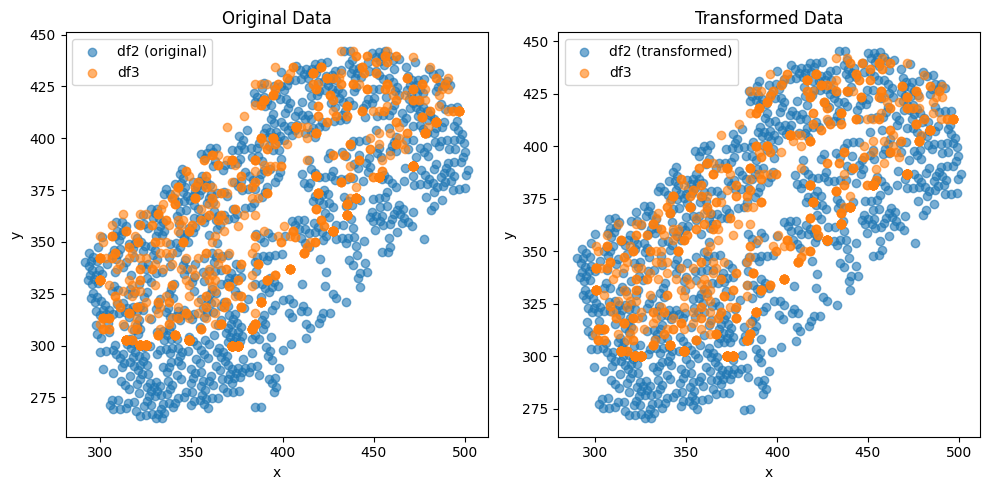

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (923,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.8162875914647054e-06 , 1.3603661964930172e-05 )
Rotation (radians): 0.005829428877913169
Transform Matrix:
 [[ 9.99983009e-01 -5.82939586e-03 -1.81628759e-06]
 [ 5.82939586e-03  9.99983009e-01  1.36036620e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


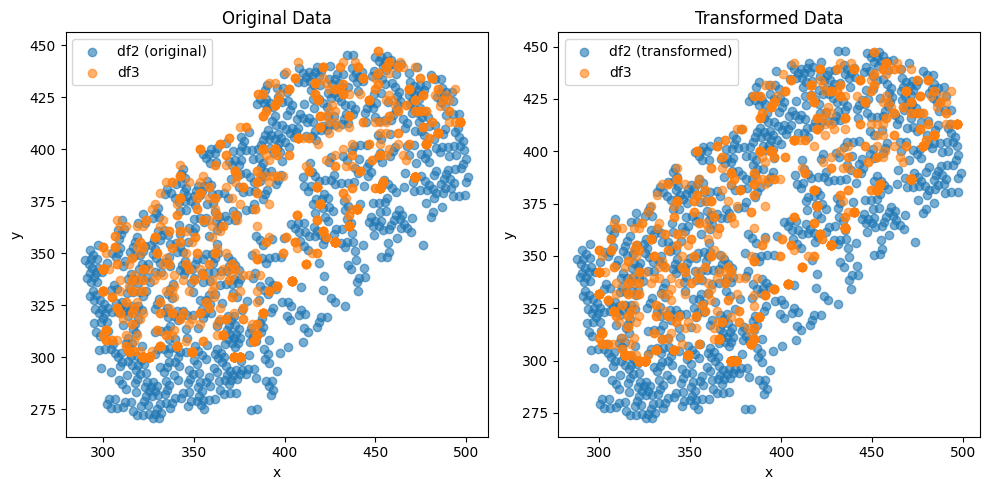

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (913,)
Optimal Translation and Rotation Parameters:
Translation: ( -7.043625693380602e-07 , 1.2023868911272244e-05 )
Rotation (radians): 0.004766947490178325
Transform Matrix:
 [[ 9.99988638e-01 -4.76692944e-03 -7.04362569e-07]
 [ 4.76692944e-03  9.99988638e-01  1.20238689e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


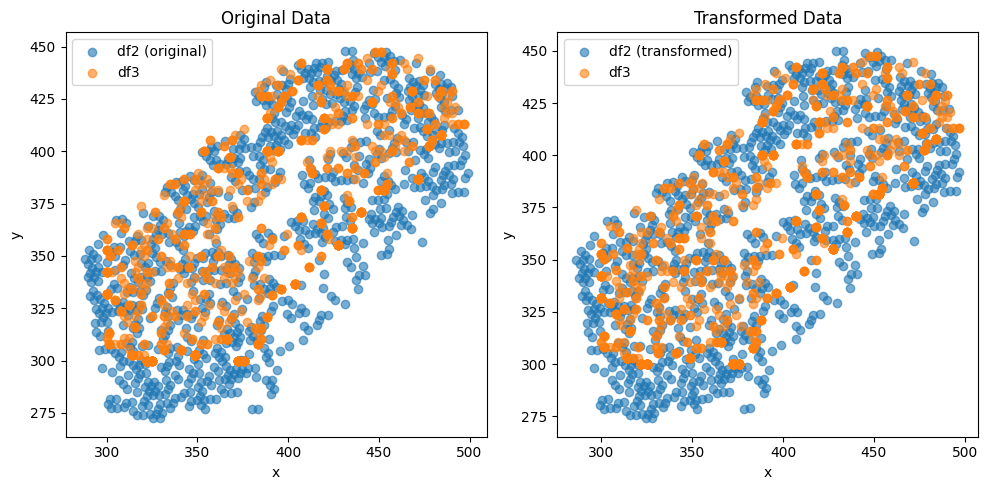

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (908,)
Optimal Translation and Rotation Parameters:
Translation: ( 4.3287407404796143e-07 , 1.0559131444389178e-05 )
Rotation (radians): 0.0038115379060635712
Transform Matrix:
 [[ 9.99992736e-01 -3.81152868e-03  4.32874074e-07]
 [ 3.81152868e-03  9.99992736e-01  1.05591314e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


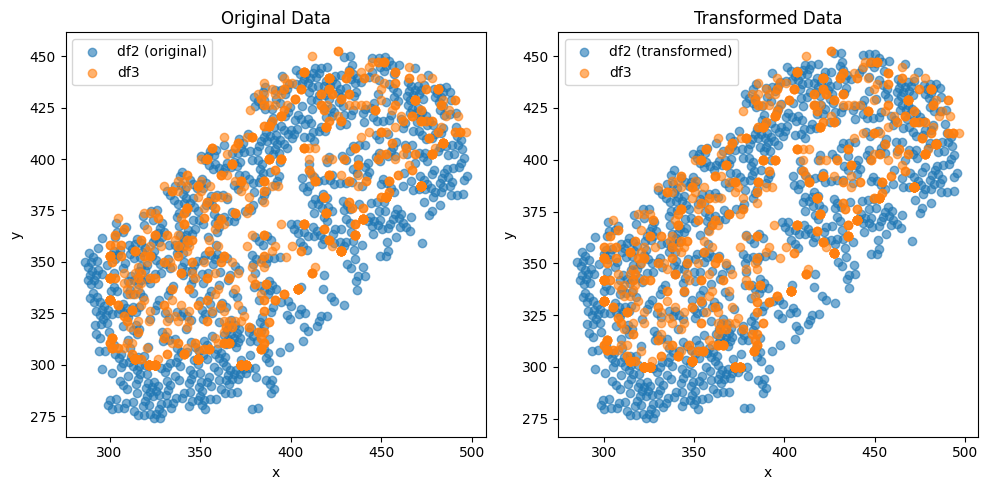

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (926,)
Optimal Translation and Rotation Parameters:
Translation: ( 8.649759445099178e-07 , 9.163530844637928e-06 )
Rotation (radians): 0.0030962121015663925
Transform Matrix:
 [[ 9.99995207e-01 -3.09620715e-03  8.64975945e-07]
 [ 3.09620715e-03  9.99995207e-01  9.16353084e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


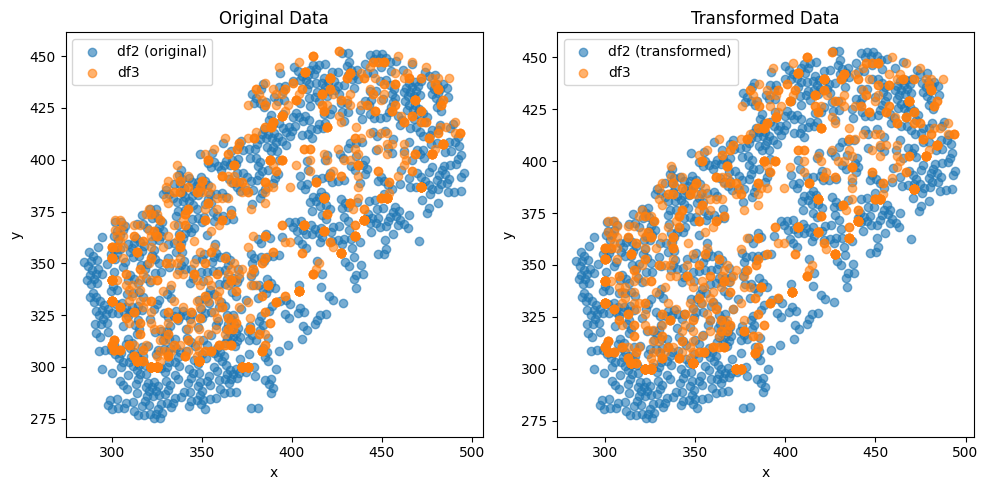

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (916,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.3691054172618757e-06 , 8.05394516608104e-06 )
Rotation (radians): 0.0024765635414699676
Transform Matrix:
 [[ 9.99996933e-01 -2.47656101e-03  1.36910542e-06]
 [ 2.47656101e-03  9.99996933e-01  8.05394517e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


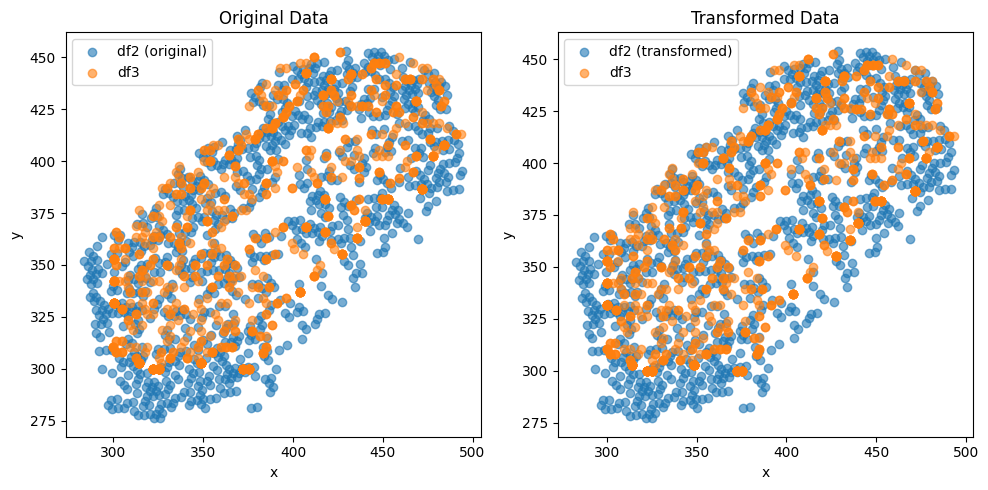

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (924,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.516321295822807e-05 , 2.1296131216536918e-05 )
Rotation (radians): 0.0021842810760907324
Transform Matrix:
 [[ 9.99997614e-01 -2.18427934e-03  1.51632130e-05]
 [ 2.18427934e-03  9.99997614e-01  2.12961312e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


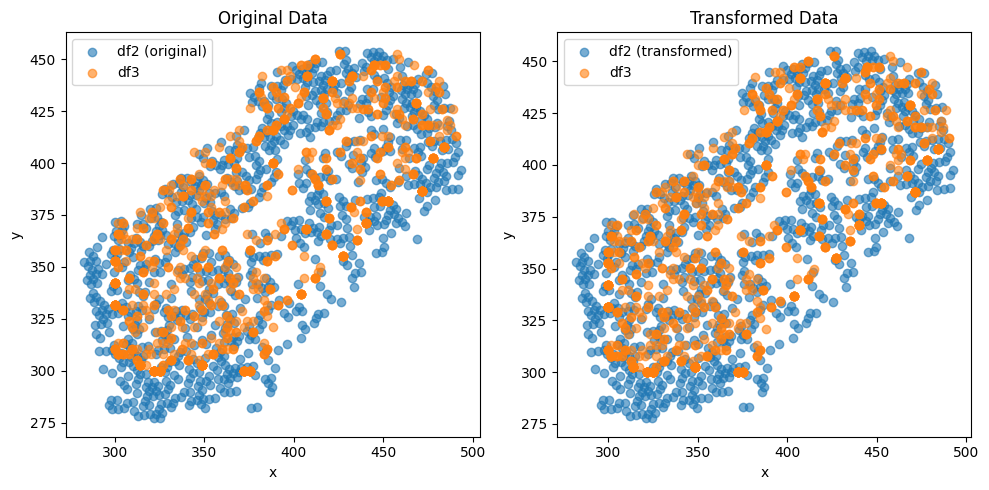

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (919,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.5390155379568526e-05 , 2.0719731263081788e-05 )
Rotation (radians): 0.0019005312048086572
Transform Matrix:
 [[ 9.99998194e-01 -1.90053006e-03  1.53901554e-05]
 [ 1.90053006e-03  9.99998194e-01  2.07197313e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


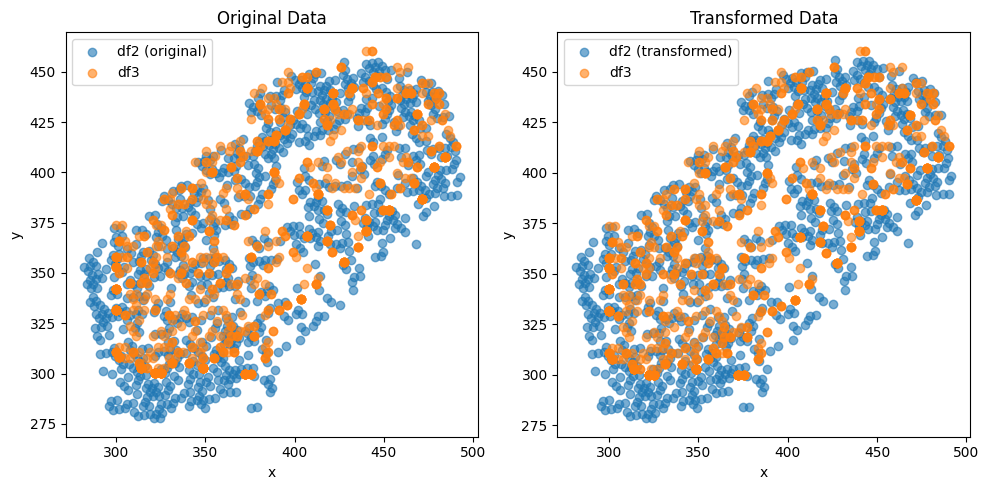

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (906,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.4780566647403817e-06 , 6.514293862976401e-06 )
Rotation (radians): 0.001498805261375743
Transform Matrix:
 [[ 9.99998877e-01 -1.49880470e-03  2.47805666e-06]
 [ 1.49880470e-03  9.99998877e-01  6.51429386e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


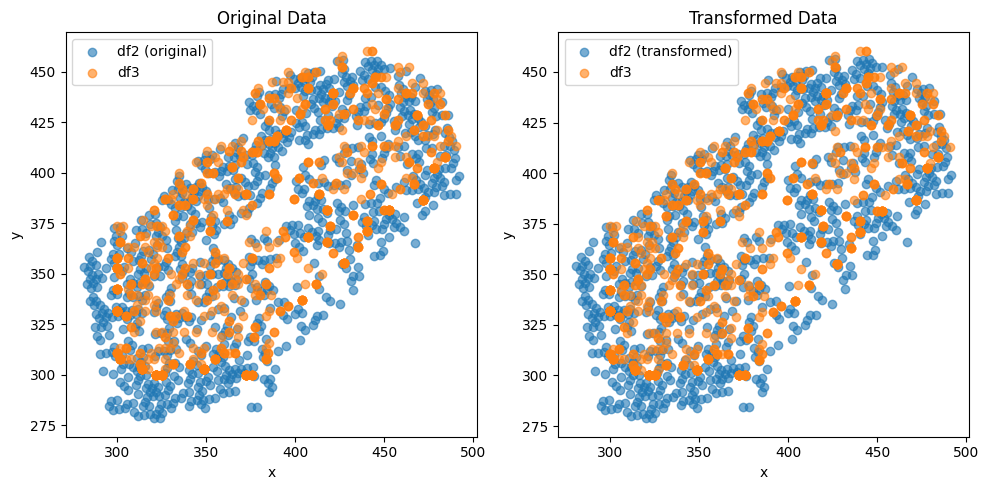

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (914,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.3368230068139335e-06 , 6.4605694194958545e-06 )
Rotation (radians): 0.001538822329679659
Transform Matrix:
 [[ 9.99998816e-01 -1.53882172e-03  2.33682301e-06]
 [ 1.53882172e-03  9.99998816e-01  6.46056942e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


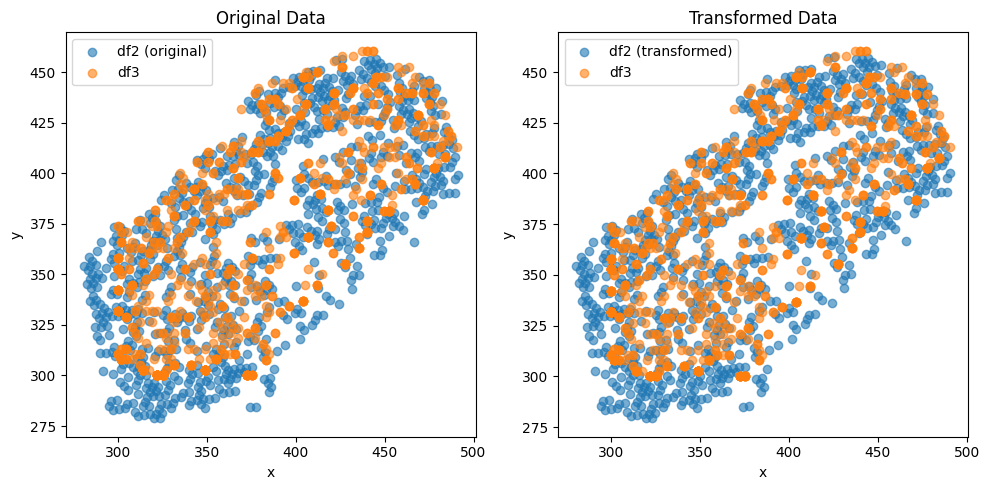

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (921,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.3675167424874974e-05 , 1.7563195239073902e-05 )
Rotation (radians): 0.0014045599017016865
Transform Matrix:
 [[ 9.99999014e-01 -1.40455944e-03  1.36751674e-05]
 [ 1.40455944e-03  9.99999014e-01  1.75631952e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


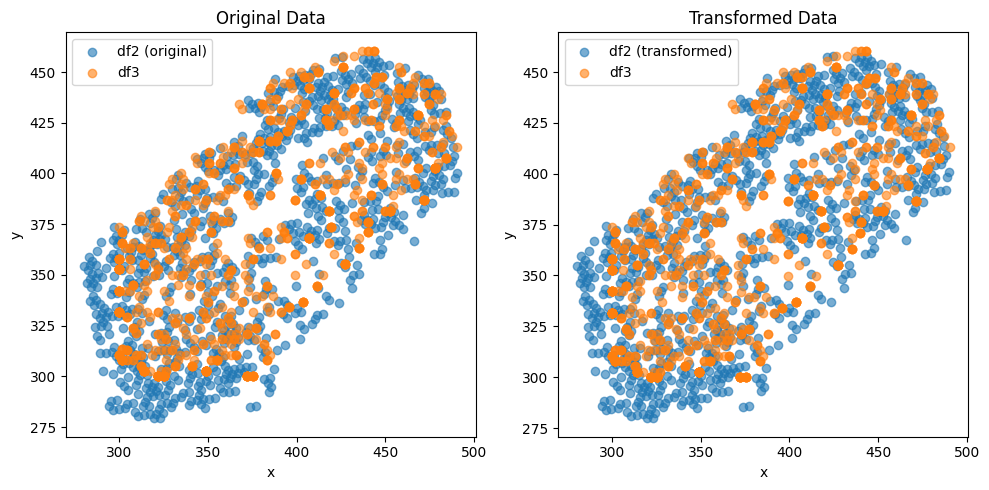

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (898,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.433405432698026e-06 , 5.475847473731742e-06 )
Rotation (radians): 0.0011232778938088264
Transform Matrix:
 [[ 9.99999369e-01 -1.12327766e-03  2.43340543e-06]
 [ 1.12327766e-03  9.99999369e-01  5.47584747e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


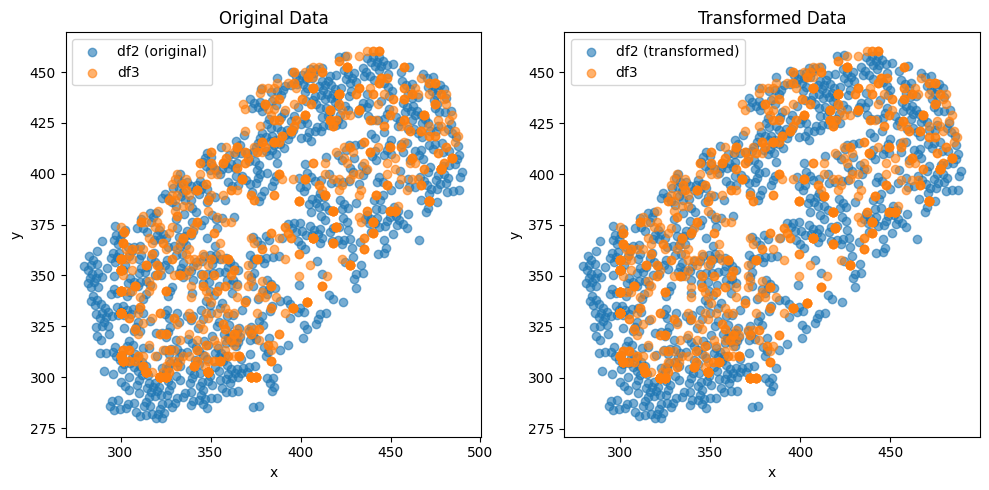

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (890,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.662303669263091e-06 , 5.499908054510812e-06 )
Rotation (radians): 0.0010812302654782653
Transform Matrix:
 [[ 9.99999415e-01 -1.08123005e-03  2.66230367e-06]
 [ 1.08123005e-03  9.99999415e-01  5.49990805e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


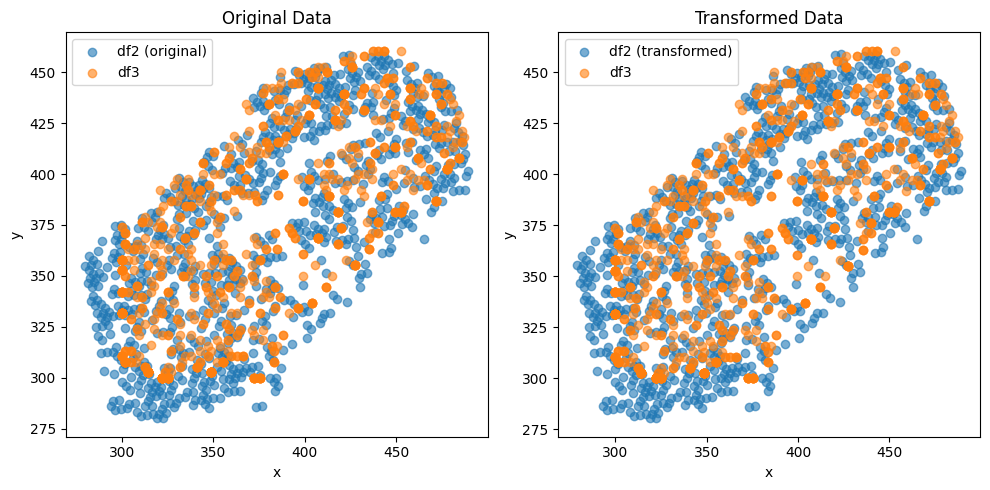

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (900,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.7144868775179002e-06 , 4.964928492521013e-06 )
Rotation (radians): 0.0008796110913680382
Transform Matrix:
 [[ 9.99999613e-01 -8.79610978e-04  2.71448688e-06]
 [ 8.79610978e-04  9.99999613e-01  4.96492849e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


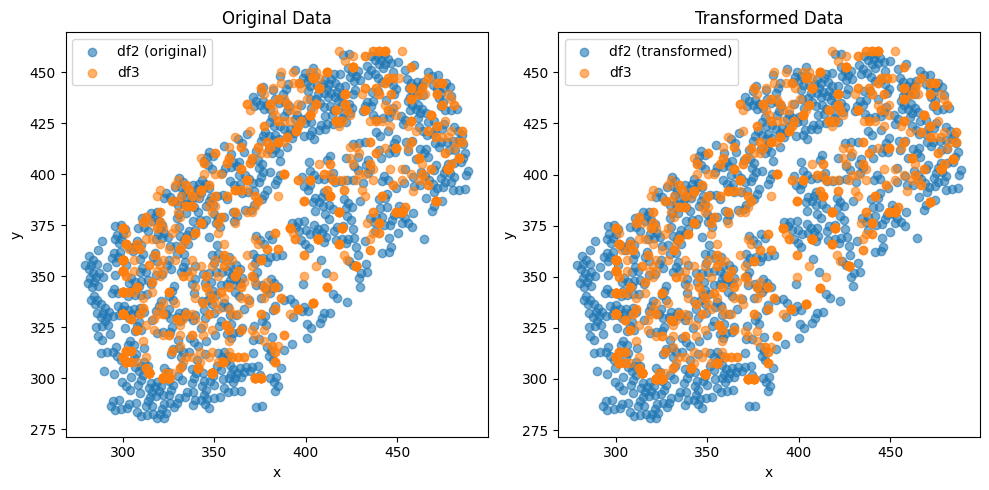

              0           1
0    314.972690  381.524885
1    438.423672  427.697537
2    282.237829  356.036808
3    295.415777  350.852322
4    340.205090  393.021301
..          ...         ...
995  423.126631  434.873158
996  332.661542  313.048812
997  313.102554  282.351222
998  301.138186  331.657485
999  414.614558  400.962175

[1000 rows x 2 columns]


In [183]:
dist_min = 1  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (666,)


C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( 7.900626139087063e-06 , 1.2116133919232748e-05 )
Rotation (radians): 0.0015818764686569514
Transform Matrix:
 [[ 9.99998749e-01 -1.58187581e-03  7.90062614e-06]
 [ 1.58187581e-03  9.99998749e-01  1.21161339e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


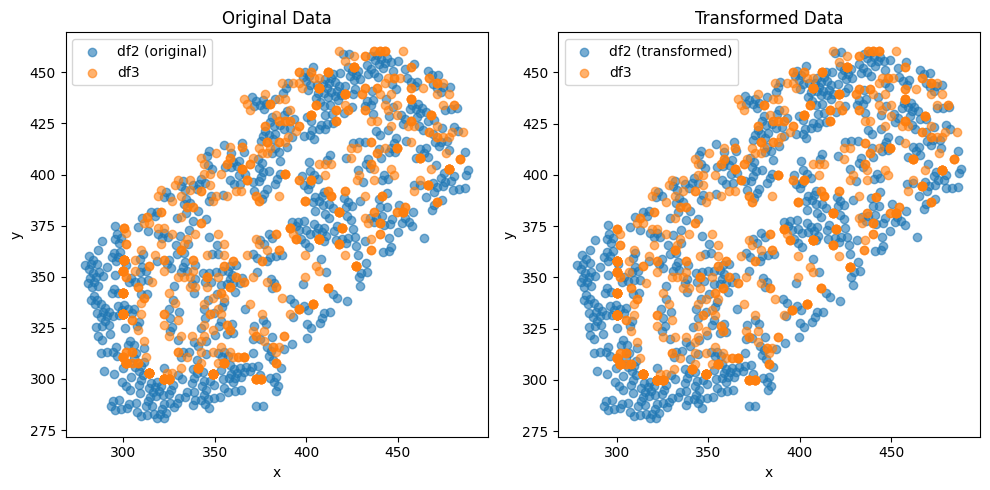

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (692,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.193422205204232 , 1.194266556651427 )
Rotation (radians): 0.0008989484185572496
Transform Matrix:
 [[ 9.99999596e-01 -8.98948297e-04  1.19342221e+00]
 [ 8.98948297e-04  9.99999596e-01  1.19426656e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


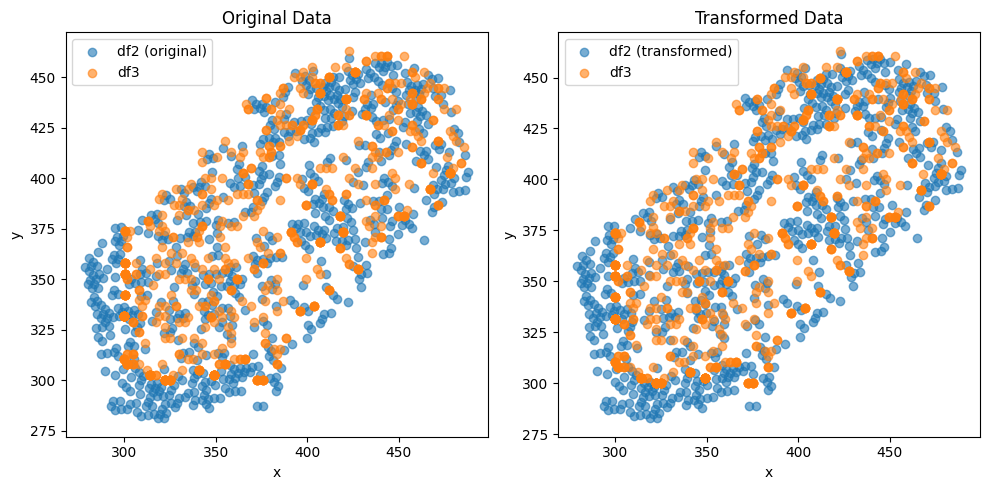

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (692,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.9787050359653854 , 0.9762199871216846 )
Rotation (radians): 0.0006589928540863542
Transform Matrix:
 [[ 9.99999783e-01 -6.58992806e-04  9.78705036e-01]
 [ 6.58992806e-04  9.99999783e-01  9.76219987e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


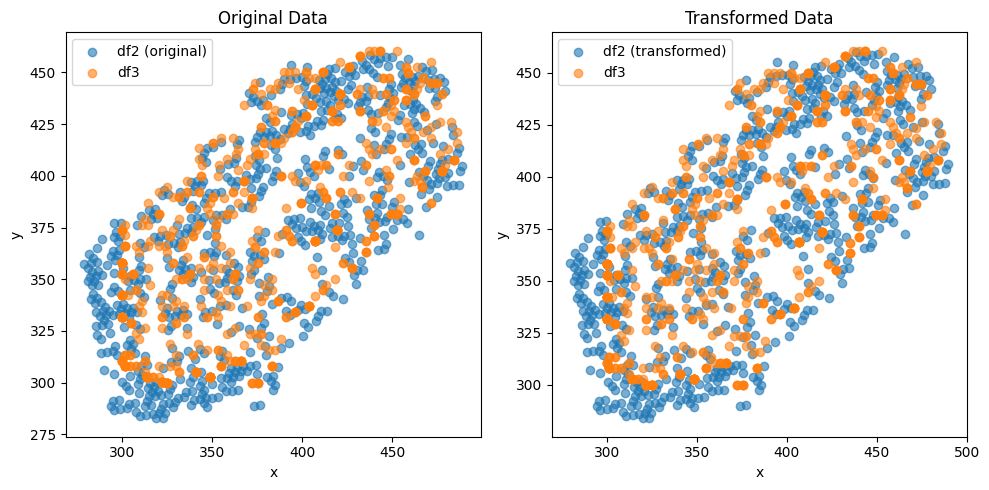

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (676,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.0035462615139406 , 1.0046684901494913 )
Rotation (radians): 0.0004406692393647385
Transform Matrix:
 [[ 9.99999903e-01 -4.40669225e-04  1.00354626e+00]
 [ 4.40669225e-04  9.99999903e-01  1.00466849e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


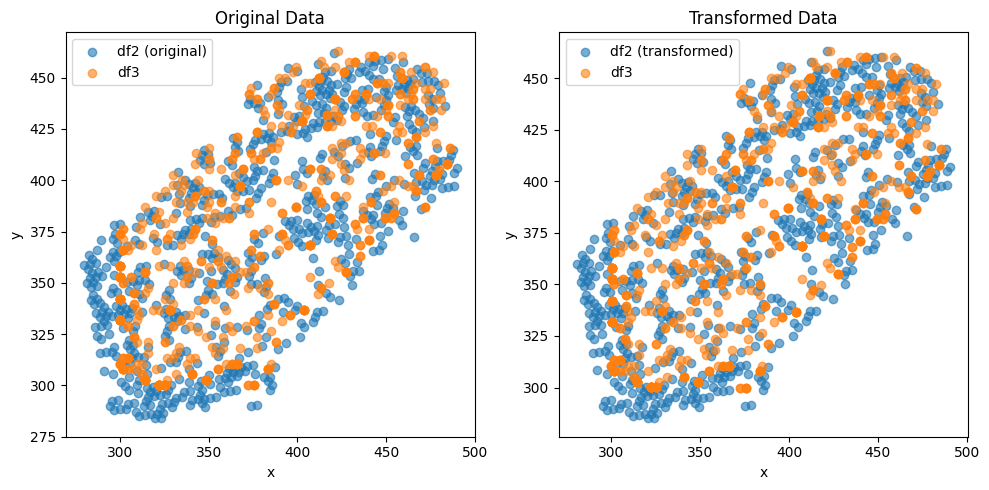

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (651,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.930368058962583 , 0.9282413810941498 )
Rotation (radians): 0.00047496007319788717
Transform Matrix:
 [[ 9.99999887e-01 -4.74960055e-04  9.30368059e-01]
 [ 4.74960055e-04  9.99999887e-01  9.28241381e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


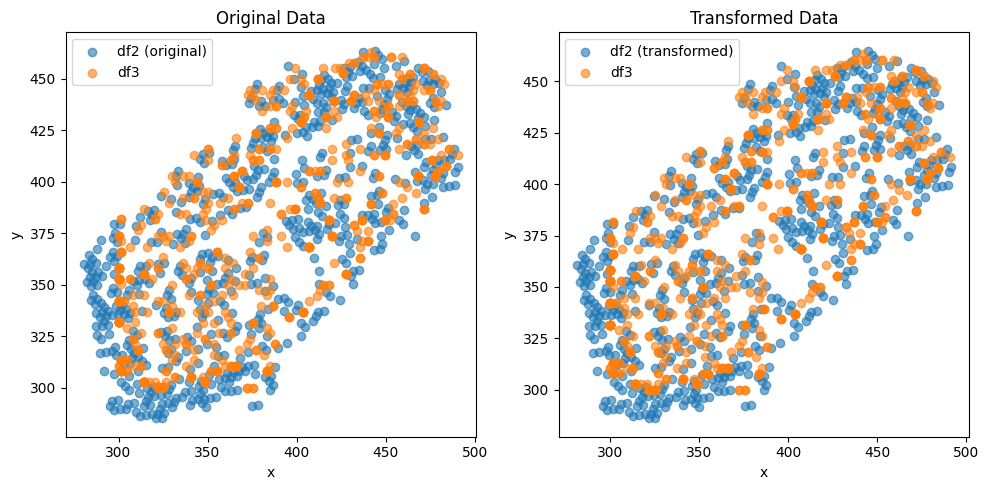

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (665,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.8656979312838738 , 0.8566373284658574 )
Rotation (radians): 0.00039168958480714176
Transform Matrix:
 [[ 9.99999923e-01 -3.91689575e-04  8.65697931e-01]
 [ 3.91689575e-04  9.99999923e-01  8.56637328e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


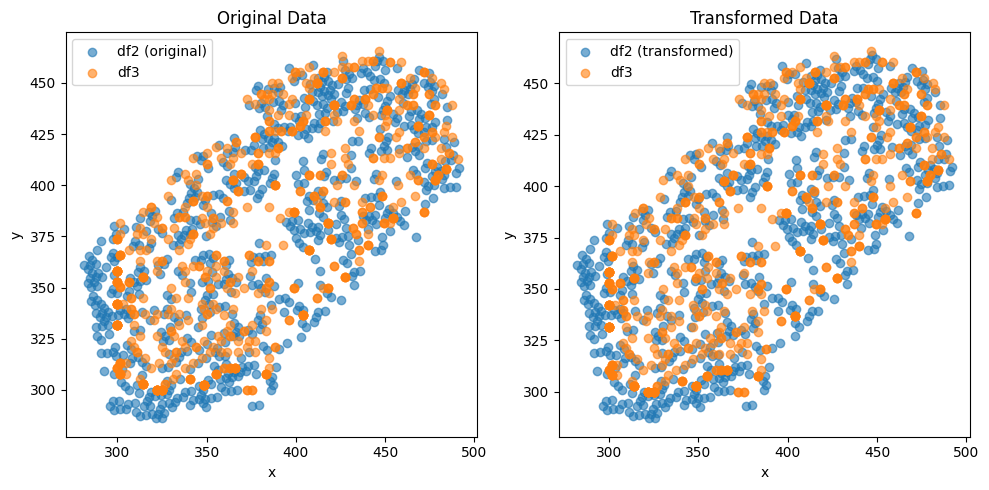

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (642,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.7948319162004885 , 0.788121618132205 )
Rotation (radians): 9.974038894489017e-05
Transform Matrix:
 [[ 9.99999995e-01 -9.97403888e-05  7.94831916e-01]
 [ 9.97403888e-05  9.99999995e-01  7.88121618e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


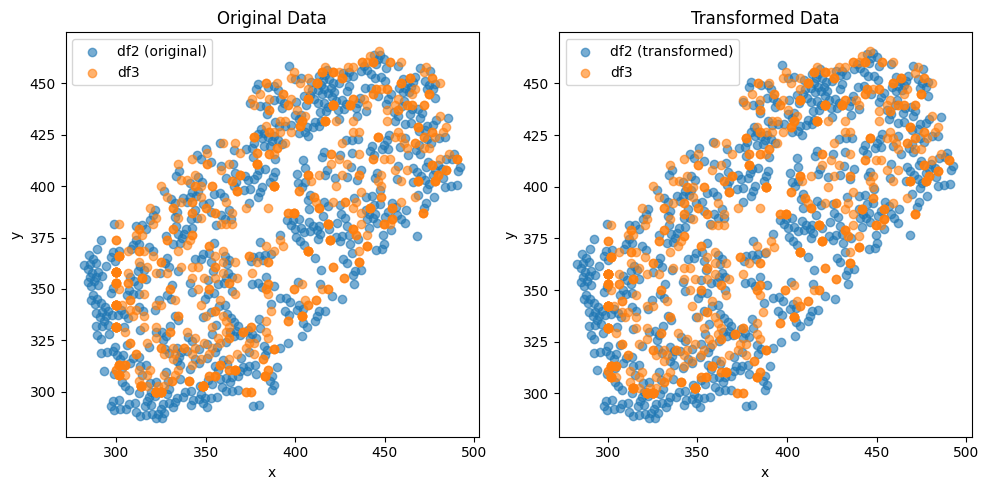

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (640,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.5737589432490454 , 0.5682937128706742 )
Rotation (radians): 0.00017611531046373373
Transform Matrix:
 [[ 9.99999984e-01 -1.76115310e-04  5.73758943e-01]
 [ 1.76115310e-04  9.99999984e-01  5.68293713e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


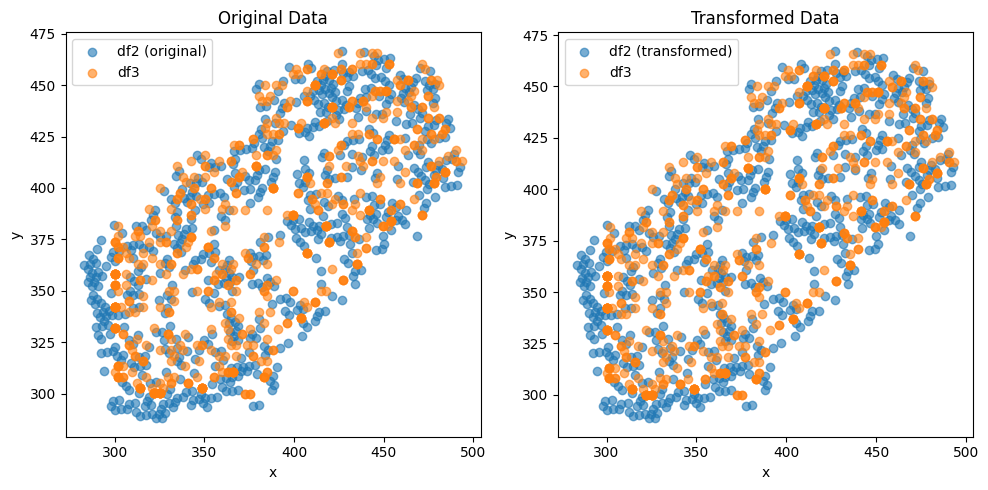

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (629,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.5910087974769563 , 0.5789337076789112 )
Rotation (radians): 0.00030476695218150876
Transform Matrix:
 [[ 9.99999954e-01 -3.04766947e-04  5.91008797e-01]
 [ 3.04766947e-04  9.99999954e-01  5.78933708e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


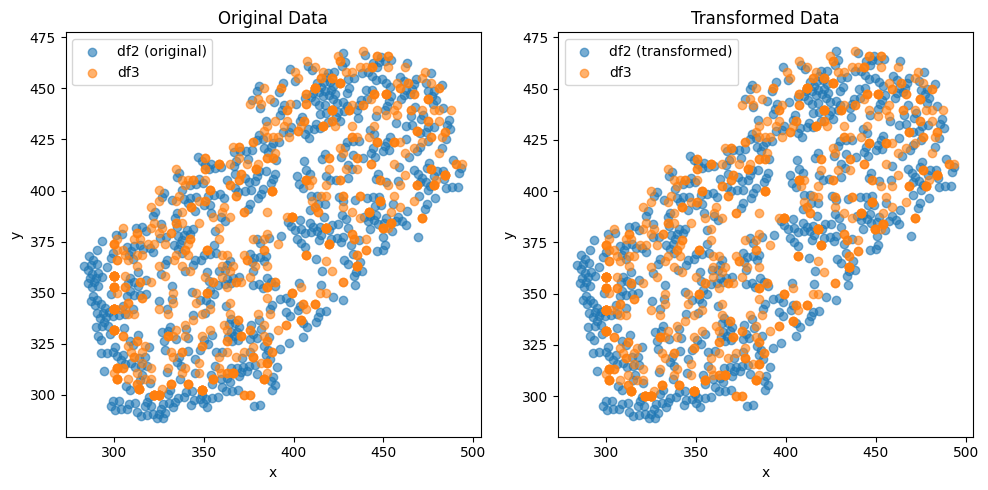

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (618,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.524201402911169 , 0.5033143444667547 )
Rotation (radians): 3.145914230202457e-05
Transform Matrix:
 [[ 1.00000000e+00 -3.14591423e-05  5.24201403e-01]
 [ 3.14591423e-05  1.00000000e+00  5.03314344e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


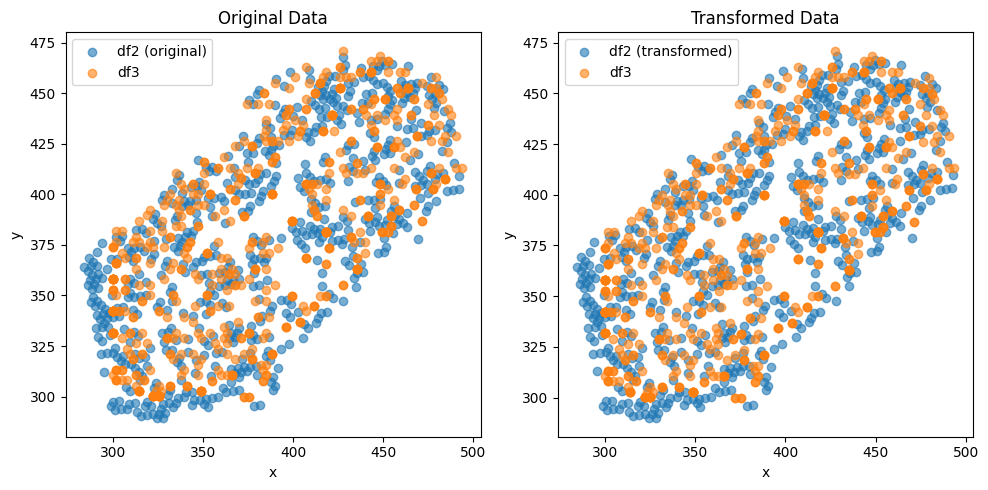

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (617,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.44475656504706024 , 0.4338166960582255 )
Rotation (radians): 2.4679249060168735e-05
Transform Matrix:
 [[ 1.00000000e+00 -2.46792491e-05  4.44756565e-01]
 [ 2.46792491e-05  1.00000000e+00  4.33816696e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


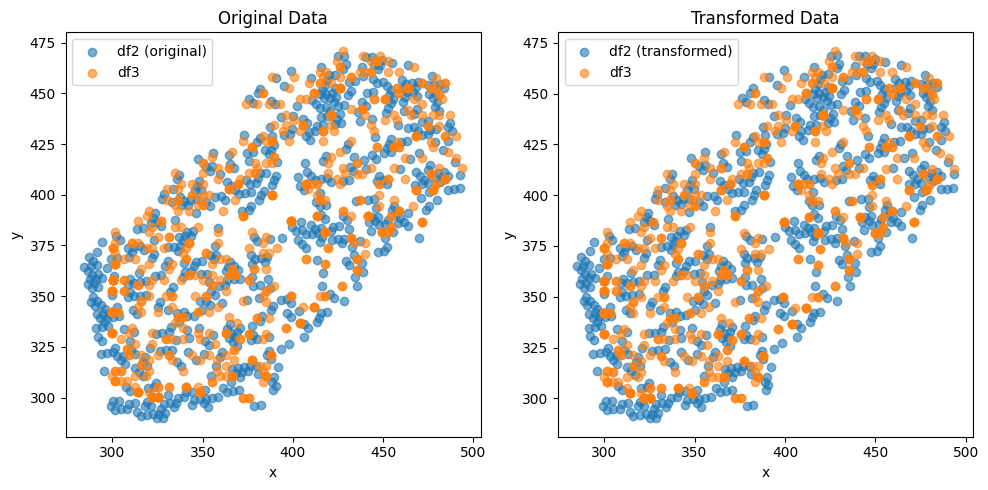

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (614,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.565474031314572 , 0.5618848198950215 )
Rotation (radians): 0.00015737373450966775
Transform Matrix:
 [[ 9.99999988e-01 -1.57373734e-04  5.65474031e-01]
 [ 1.57373734e-04  9.99999988e-01  5.61884820e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


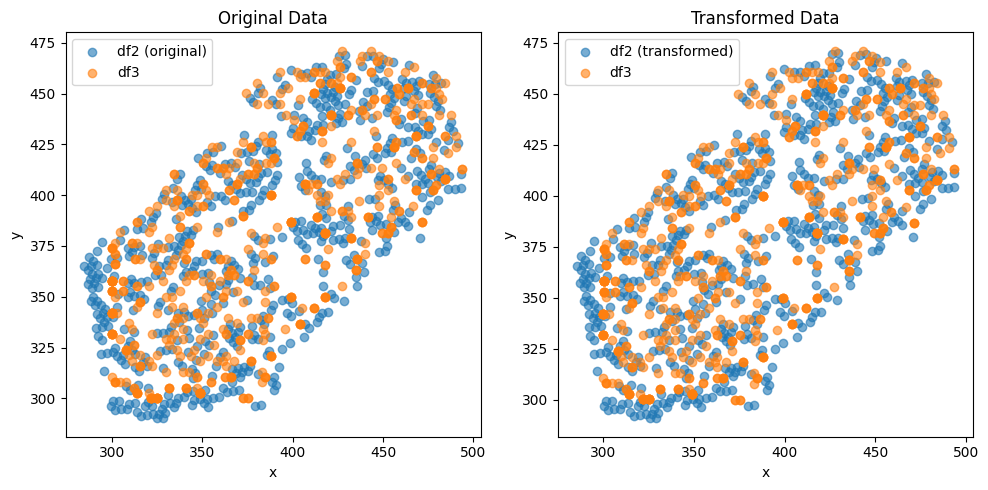

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (625,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.4749000046084039 , 0.4724053212453106 )
Rotation (radians): 0.000237699600277728
Transform Matrix:
 [[ 9.99999972e-01 -2.37699598e-04  4.74900005e-01]
 [ 2.37699598e-04  9.99999972e-01  4.72405321e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


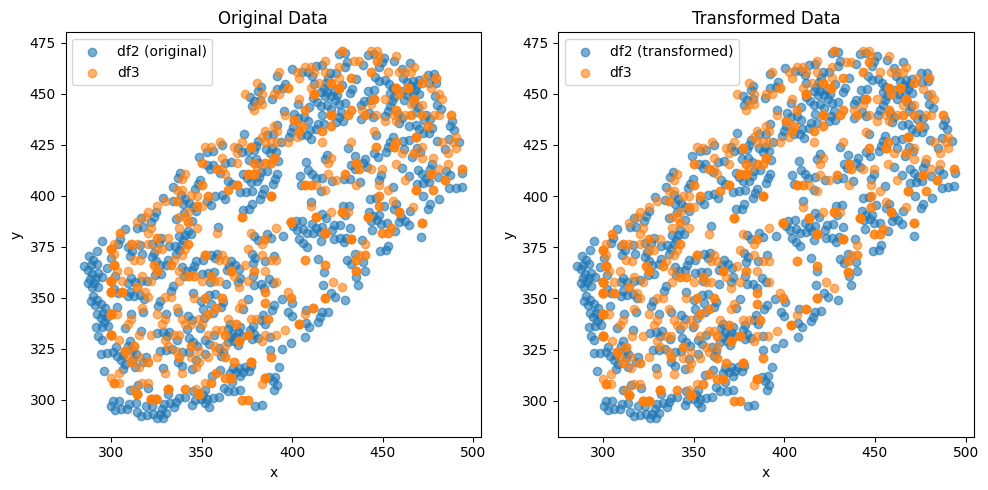

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (611,)
Optimal Translation and Rotation Parameters:
Translation: ( 2.1376154748411415e-05 , 2.2527637422836945e-05 )
Rotation (radians): 0.00040007669875699516
Transform Matrix:
 [[ 9.99999920e-01 -4.00076688e-04  2.13761547e-05]
 [ 4.00076688e-04  9.99999920e-01  2.25276374e-05]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


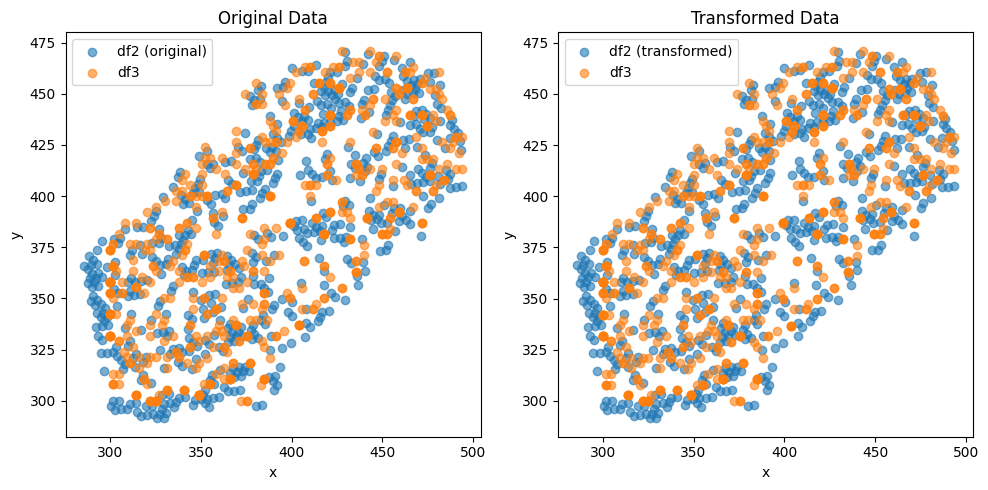

              0           1
0    321.649474  392.252381
1    444.826873  439.150005
2    289.065023  366.572295
3    302.273223  361.465372
4    346.813850  403.896939
..          ...         ...
995  429.487911  446.235570
996  339.740592  323.881484
997  320.362413  293.069437
998  308.108380  342.304509
999  421.175348  412.275131

[1000 rows x 2 columns]


In [184]:
dist_min = 2  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (369,)


C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( 0.7986052094109871 , 0.795331690009215 )
Rotation (radians): 0.0003854595779277039
Transform Matrix:
 [[ 9.99999926e-01 -3.85459568e-04  7.98605209e-01]
 [ 3.85459568e-04  9.99999926e-01  7.95331690e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


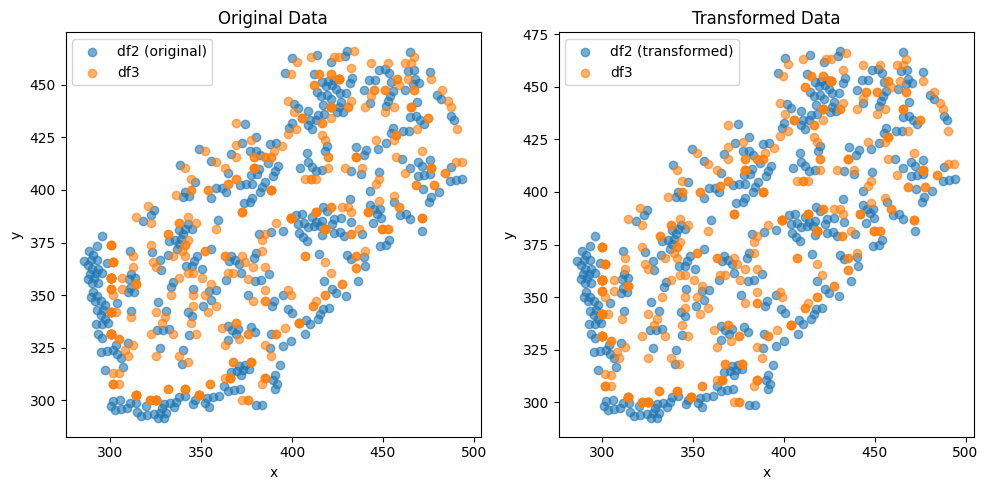

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (343,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.8069857569745537 , 0.8250201553825338 )
Rotation (radians): 0.0006370824961597349
Transform Matrix:
 [[ 9.99999797e-01 -6.37082453e-04  8.06985757e-01]
 [ 6.37082453e-04  9.99999797e-01  8.25020155e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


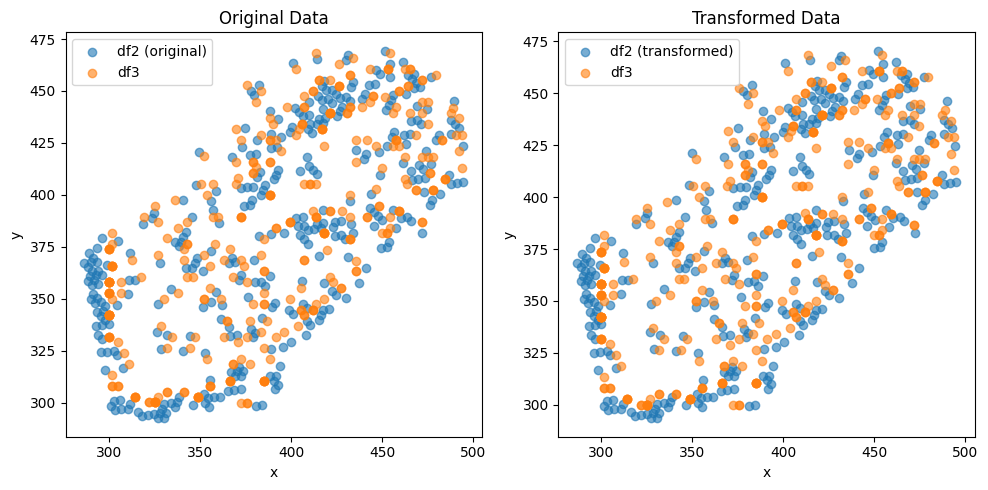

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (337,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9624867276186814e-06 , 4.502249537931446e-06 )
Rotation (radians): 0.0009597298359184683
Transform Matrix:
 [[ 9.99999539e-01 -9.59729689e-04  1.96248673e-06]
 [ 9.59729689e-04  9.99999539e-01  4.50224954e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


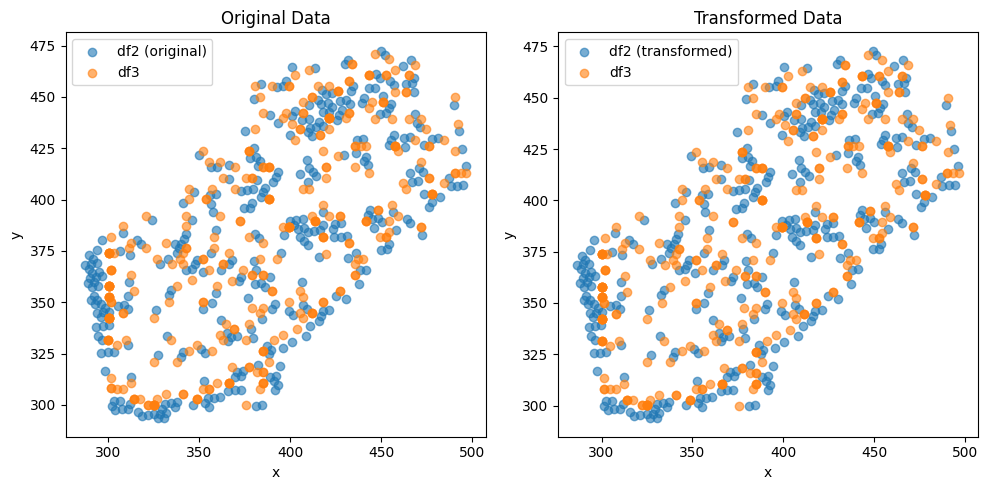

              0           1
0    322.474822  394.511611
1    445.559014  441.653314
2    289.941340  368.766985
3    303.159637  363.686254
4    347.616066  406.206029
..          ...         ...
995  430.206037  448.708459
996  340.701433  326.176710
997  321.384371  295.326310
998  309.032764  344.536996
999  421.960809  414.731609

[1000 rows x 2 columns]


In [185]:
dist_min = 3  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

min_row_indices (111,)


C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


Optimal Translation and Rotation Parameters:
Translation: ( 3.113081671177314 , 3.075412416732924 )
Rotation (radians): -0.0011815858690796329
Transform Matrix:
 [[ 9.99999302e-01  1.18158559e-03  3.11308167e+00]
 [-1.18158559e-03  9.99999302e-01  3.07541242e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


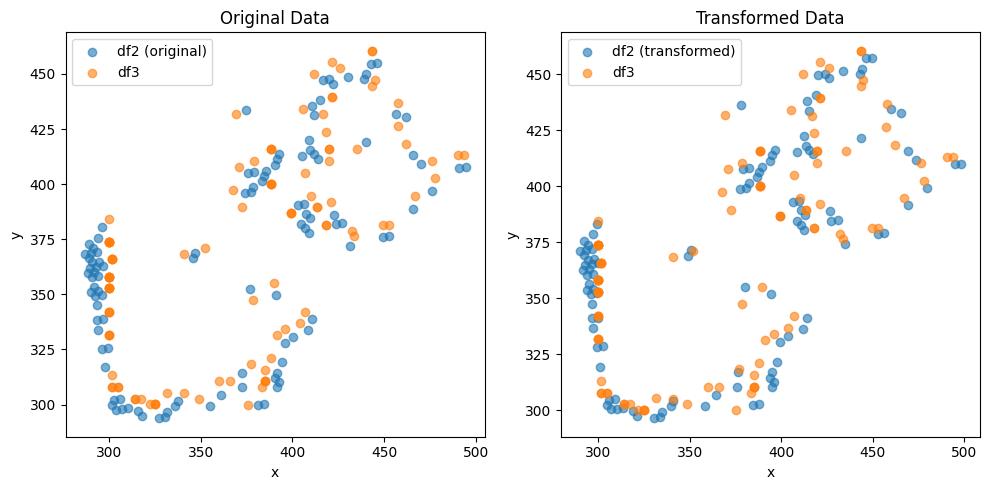

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (89,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.7886817314090677 , 0.8920730184511846 )
Rotation (radians): 1.7579017944866417e-05
Transform Matrix:
 [[ 1.00000000e+00 -1.75790179e-05  7.88681731e-01]
 [ 1.75790179e-05  1.00000000e+00  8.92073018e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


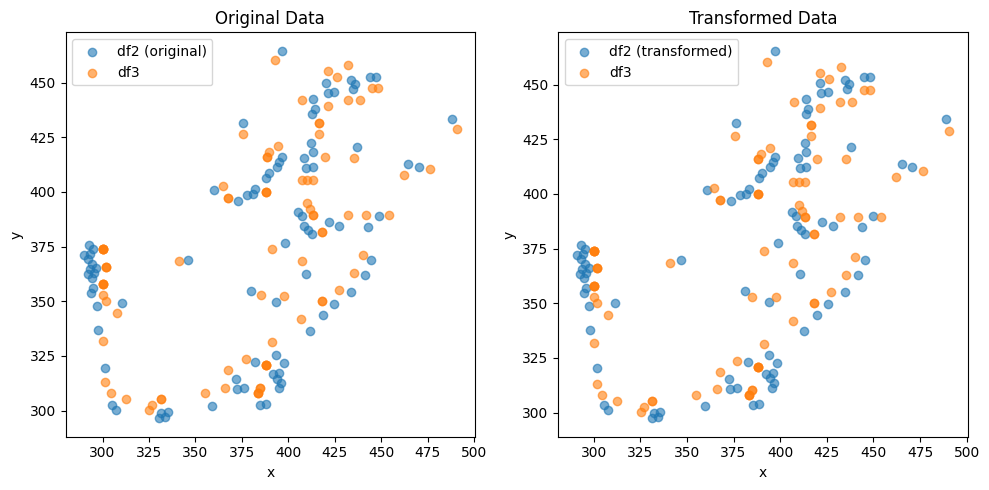

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (85,)
Optimal Translation and Rotation Parameters:
Translation: ( -0.00530387857822149 , 0.4092317241085293 )
Rotation (radians): -0.0006420756415463891
Transform Matrix:
 [[ 9.99999794e-01  6.42075597e-04 -5.30387858e-03]
 [-6.42075597e-04  9.99999794e-01  4.09231724e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


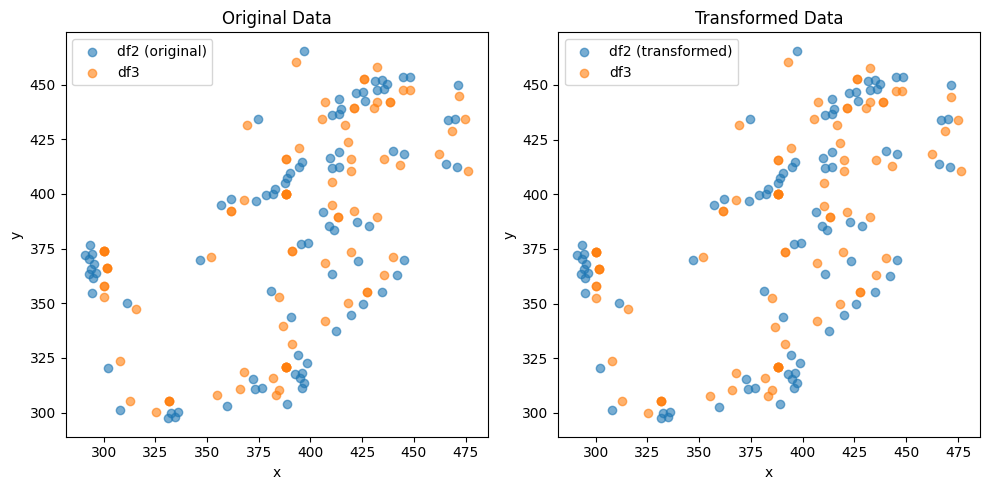

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (91,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.09626239267564869 , 0.28680244388509163 )
Rotation (radians): 0.00038614611110863794
Transform Matrix:
 [[ 9.99999925e-01 -3.86146102e-04  9.62623927e-02]
 [ 3.86146102e-04  9.99999925e-01  2.86802444e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


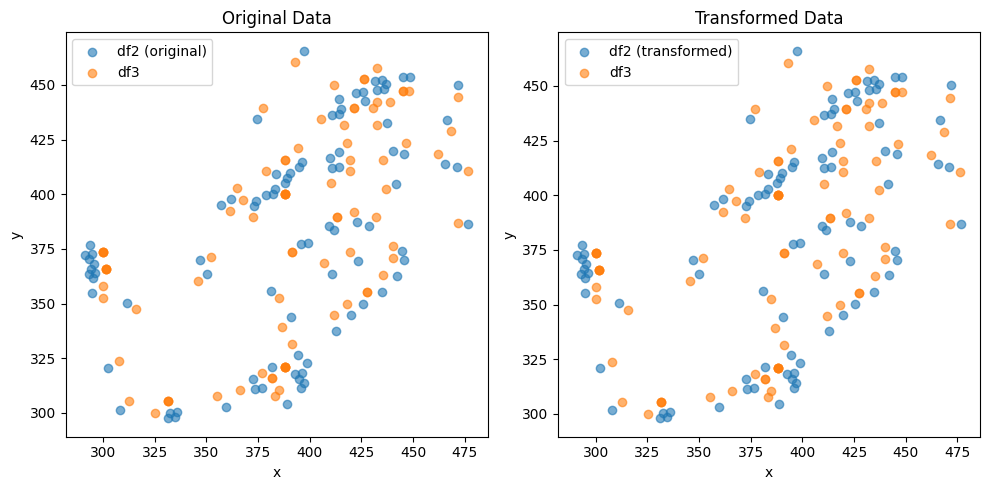

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (89,)
Optimal Translation and Rotation Parameters:
Translation: ( 7.138930983132653e-07 , 6.095555944798108e-06 )
Rotation (radians): 0.0018530288773441303
Transform Matrix:
 [[ 9.99998283e-01 -1.85302782e-03  7.13893098e-07]
 [ 1.85302782e-03  9.99998283e-01  6.09555594e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


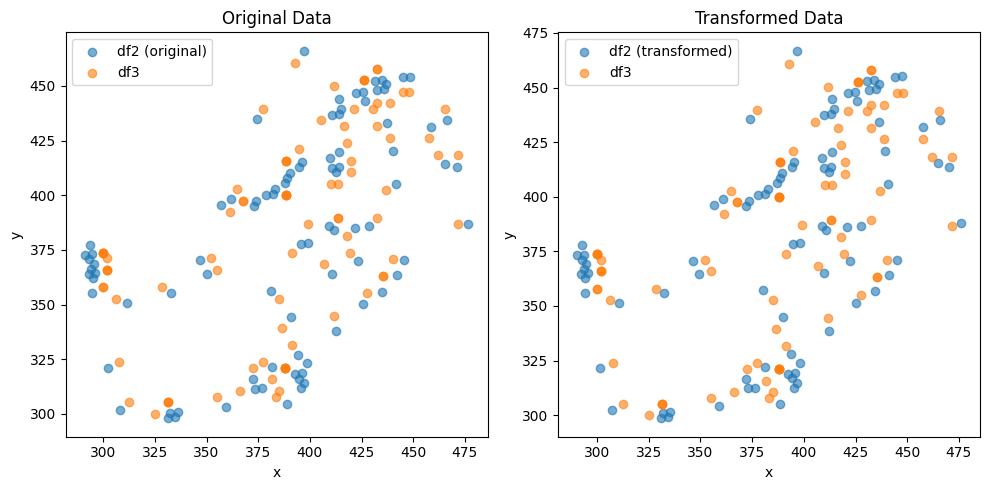

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (76,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.0899373067063667 , 1.1075315708634845 )
Rotation (radians): -0.0008585915778341051
Transform Matrix:
 [[ 9.99999631e-01  8.58591472e-04  1.08993731e+00]
 [-8.58591472e-04  9.99999631e-01  1.10753157e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


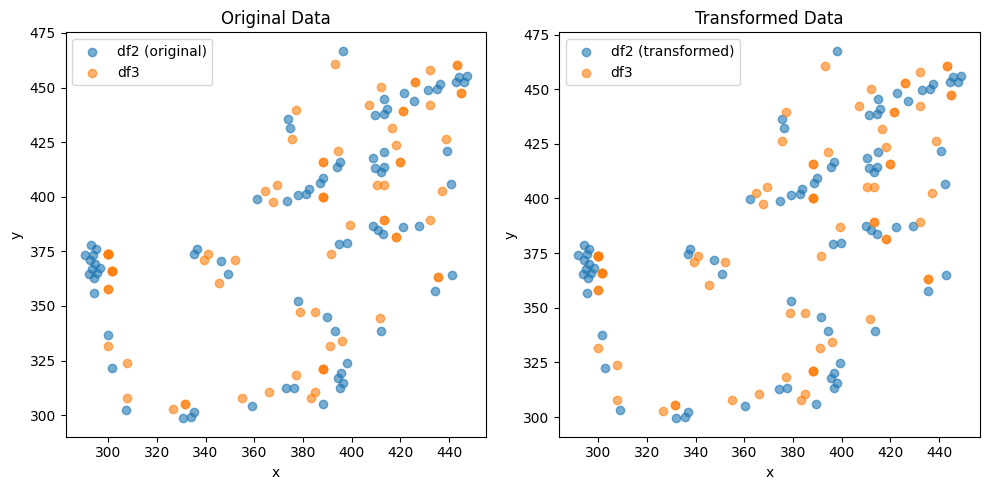

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (78,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.6209022634242977e-06 , 3.720660333753497e-06 )
Rotation (radians): 0.001649128718482273
Transform Matrix:
 [[ 9.99998640e-01 -1.64912797e-03 -1.62090226e-06]
 [ 1.64912797e-03  9.99998640e-01  3.72066033e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


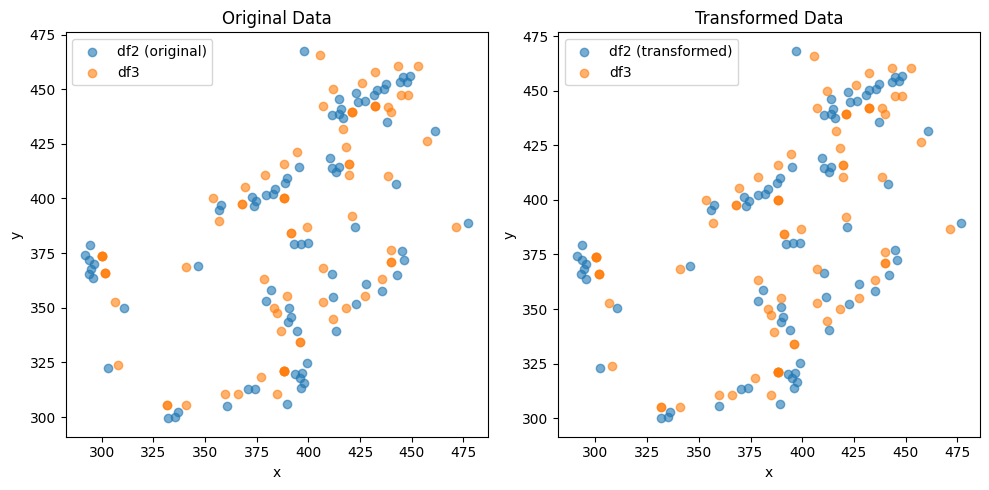

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (71,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.225319487371692e-06 , 4.157704085601432e-06 )
Rotation (radians): -0.0010339593152917752
Transform Matrix:
 [[ 9.99999465e-01  1.03395913e-03  6.22531949e-06]
 [-1.03395913e-03  9.99999465e-01  4.15770409e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


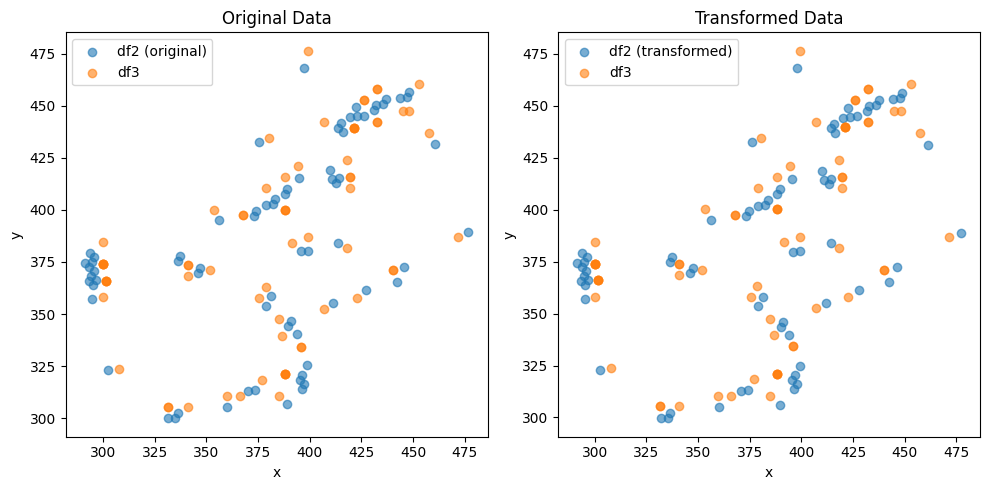

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (77,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.48556614001287274 , 0.6043478433268272 )
Rotation (radians): 0.0012040530176194559
Transform Matrix:
 [[ 0.99999928 -0.00120405  0.48556614]
 [ 0.00120405  0.99999928  0.60434784]
 [ 0.          0.          1.        ]]


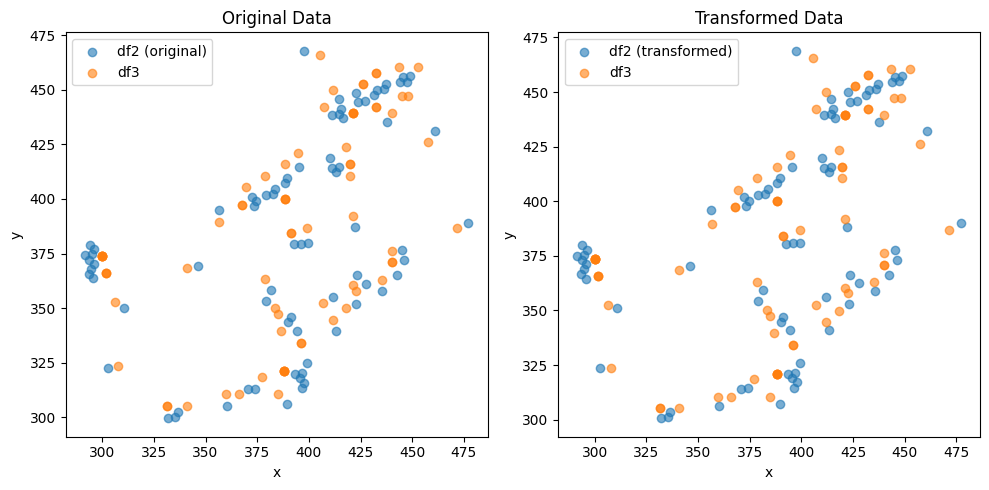

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -1.729781081903288e-07 , 4.266449315682311e-06 )
Rotation (radians): 0.0014540614740596177
Transform Matrix:
 [[ 9.99998943e-01 -1.45406096e-03 -1.72978108e-07]
 [ 1.45406096e-03  9.99998943e-01  4.26644932e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


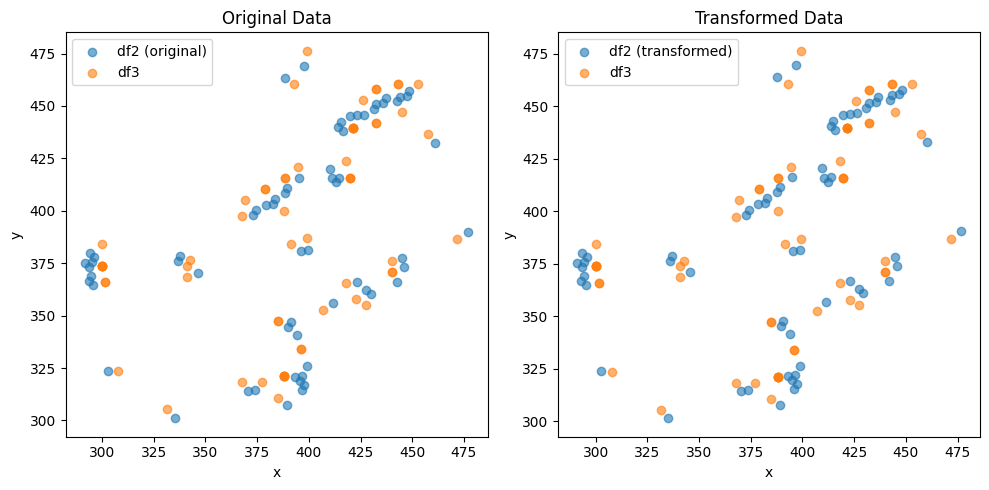

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 0.7554194404700235 , 0.7472206231511759 )
Rotation (radians): 0.0007068115593814071
Transform Matrix:
 [[ 9.99999750e-01 -7.06811501e-04  7.55419440e-01]
 [ 7.06811501e-04  9.99999750e-01  7.47220623e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


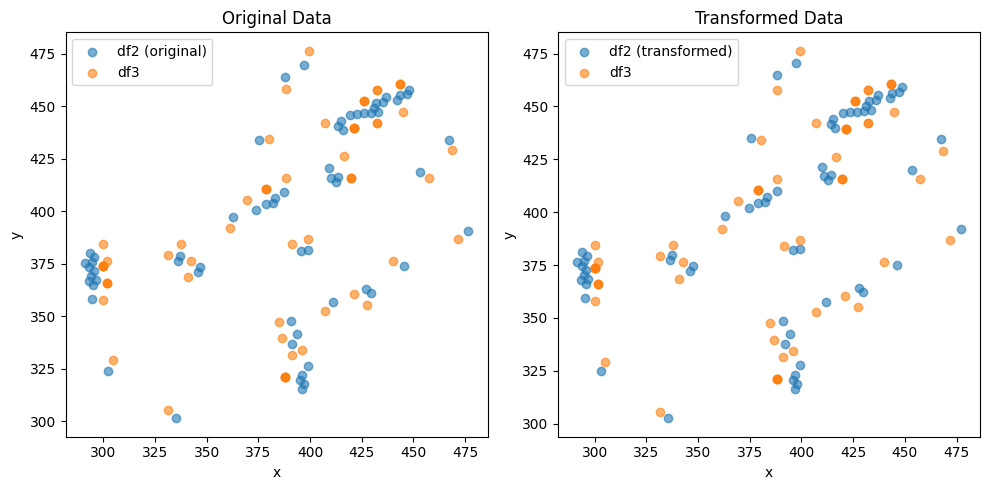

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (65,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.281197002349649e-06 , 2.1113955320967643e-06 )
Rotation (radians): 0.0017892695400721754
Transform Matrix:
 [[ 9.99998399e-01 -1.78926859e-03 -2.28119700e-06]
 [ 1.78926859e-03  9.99998399e-01  2.11139553e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


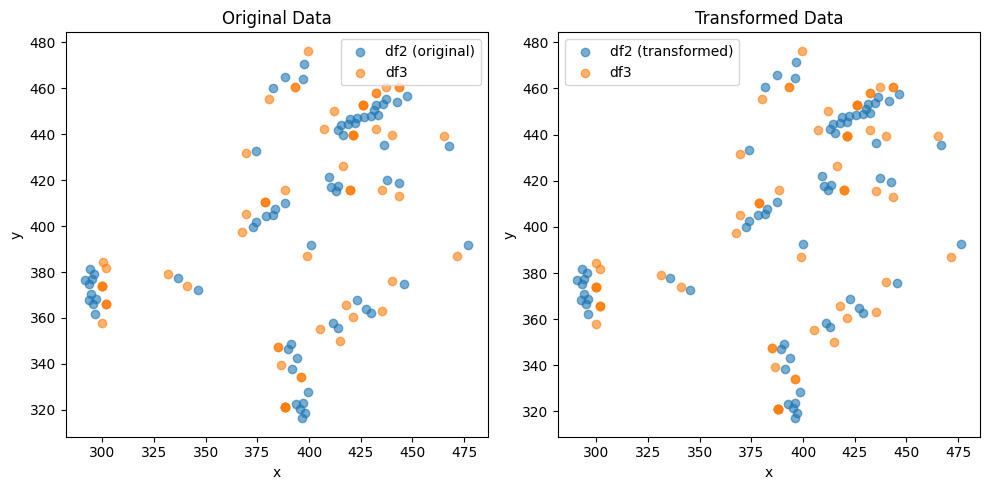

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (60,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.483943164703483e-06 , 1.6383484016933502e-06 )
Rotation (radians): -0.002141992159990665
Transform Matrix:
 [[ 9.99997706e-01  2.14199052e-03  6.48394316e-06]
 [-2.14199052e-03  9.99997706e-01  1.63834840e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


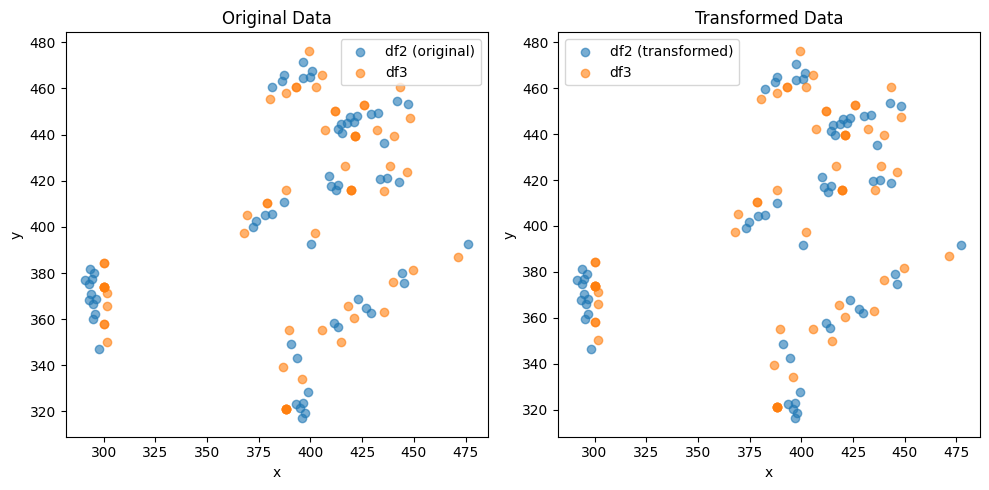

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9271876557301656e-06 , 9.229960904561019e-07 )
Rotation (radians): 0.0014120971734644422
Transform Matrix:
 [[ 9.99999003e-01 -1.41209670e-03 -2.92718766e-06]
 [ 1.41209670e-03  9.99999003e-01  9.22996090e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


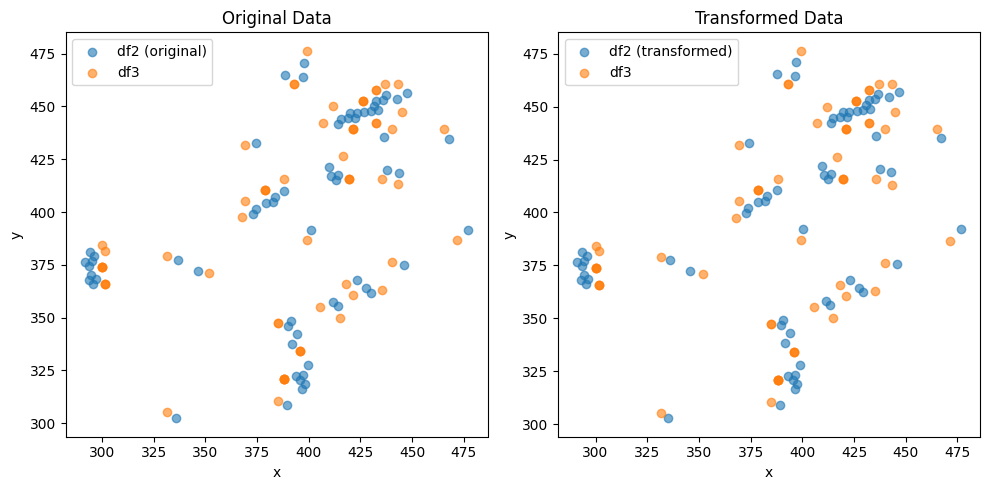

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.911665051408614e-06 , -4.80191066958741e-07 )
Rotation (radians): -0.0010746951929115056
Transform Matrix:
 [[ 9.99999423e-01  1.07469499e-03  1.91166505e-06]
 [-1.07469499e-03  9.99999423e-01 -4.80191067e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


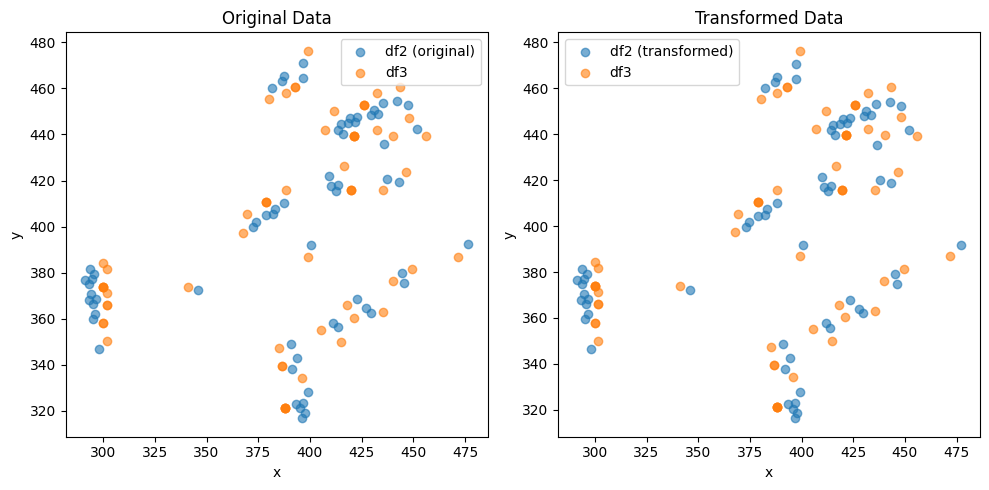

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4095181801272606e-06 , 2.243543847803869e-06 )
Rotation (radians): 0.0018815322456374654
Transform Matrix:
 [[ 9.99998230e-01 -1.88153114e-03 -2.40951818e-06]
 [ 1.88153114e-03  9.99998230e-01  2.24354385e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


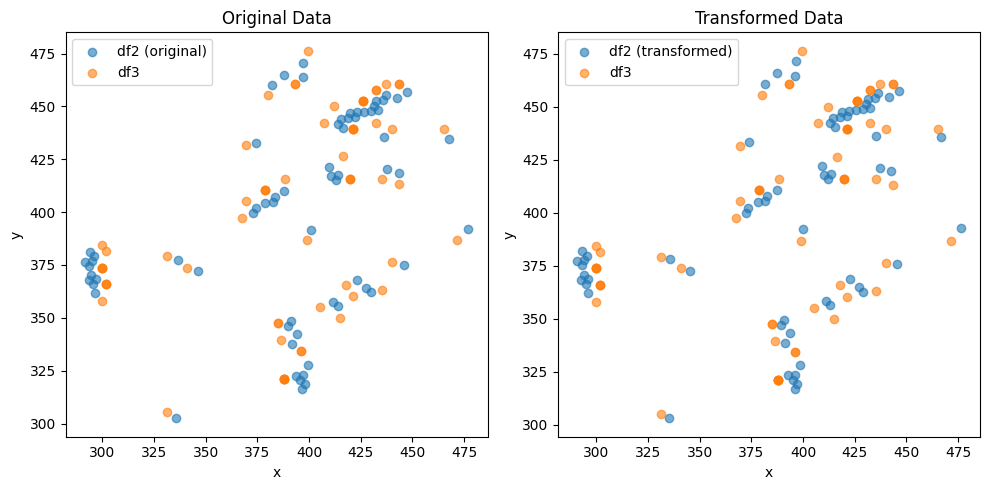

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999895301165625e-06 , 9.124436513746732e-07 )
Rotation (radians): -0.0022455731160236584
Transform Matrix:
 [[ 9.99997479e-01  2.24557123e-03  5.99989530e-06]
 [-2.24557123e-03  9.99997479e-01  9.12443651e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


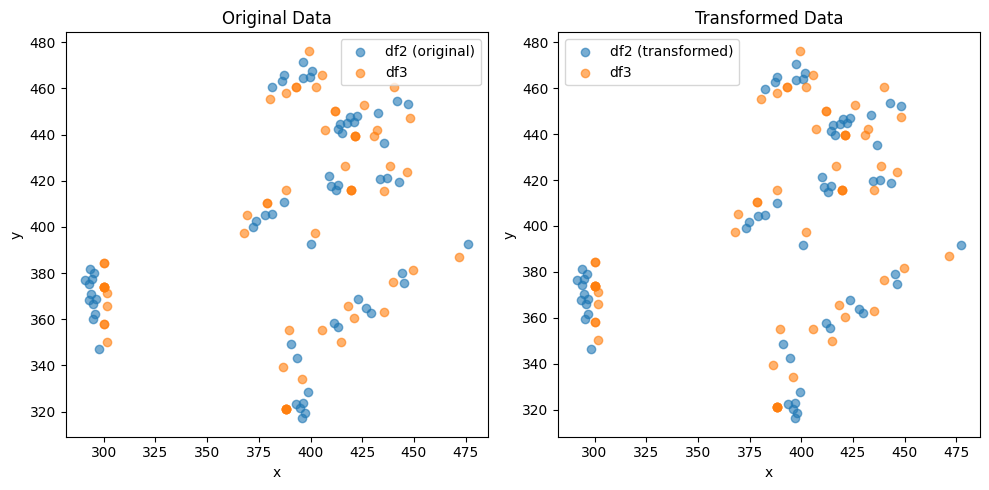

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.961290343091141e-06 , 9.529738803568143e-07 )
Rotation (radians): 0.001438735572780321
Transform Matrix:
 [[ 9.99998965e-01 -1.43873508e-03 -2.96129034e-06]
 [ 1.43873508e-03  9.99998965e-01  9.52973880e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


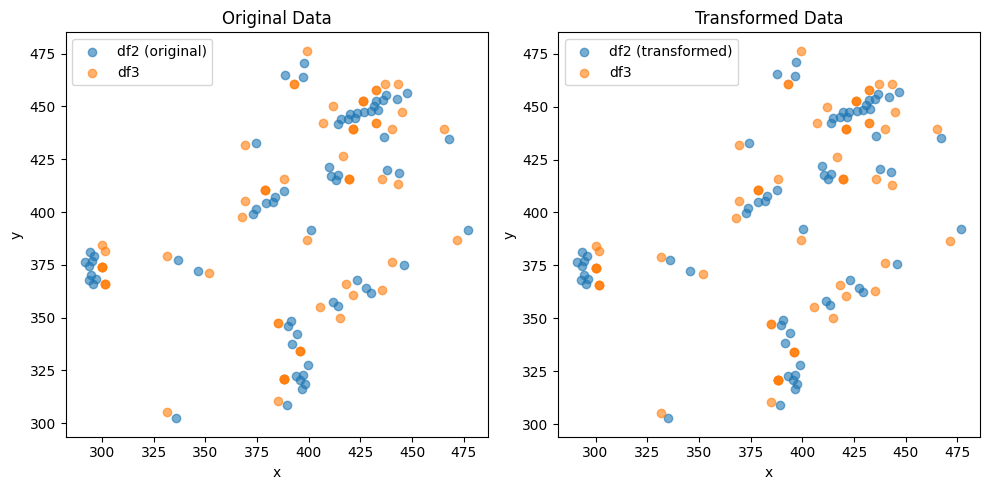

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.912012262840827e-06 , -4.791580222028415e-07 )
Rotation (radians): -0.0010746966325088435
Transform Matrix:
 [[ 9.99999423e-01  1.07469643e-03  1.91201226e-06]
 [-1.07469643e-03  9.99999423e-01 -4.79158022e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


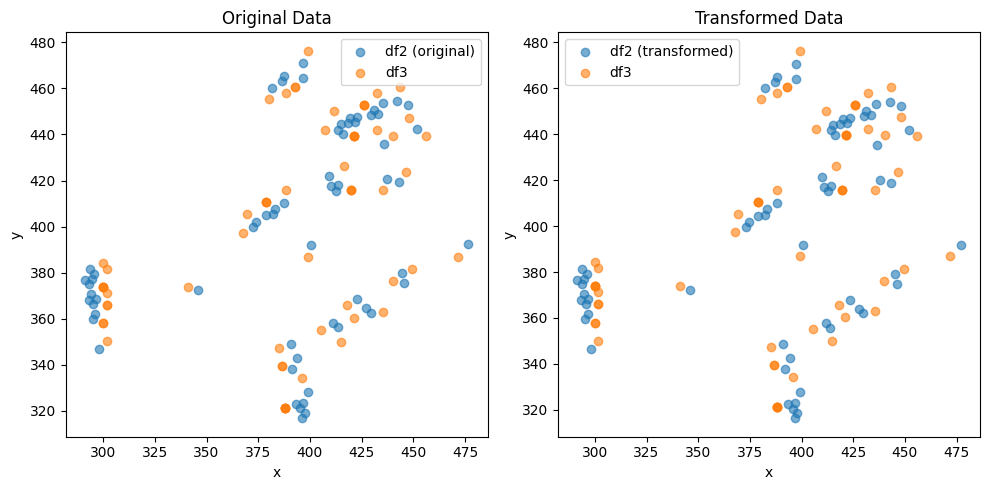

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.410700262730752e-06 , 2.2444284416413045e-06 )
Rotation (radians): 0.0018815329804008345
Transform Matrix:
 [[ 9.99998230e-01 -1.88153187e-03 -2.41070026e-06]
 [ 1.88153187e-03  9.99998230e-01  2.24442844e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


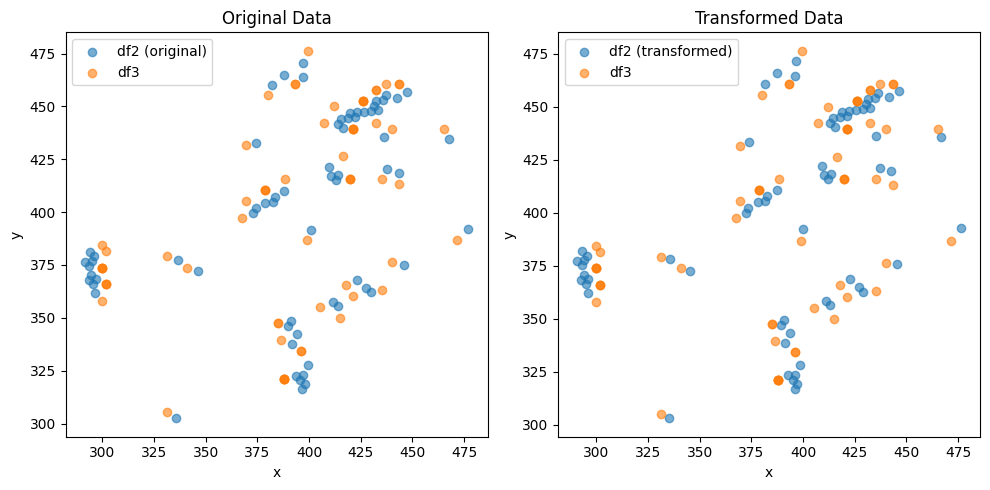

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.998254815518042e-06 , 9.140877751372069e-07 )
Rotation (radians): -0.0022455729159941216
Transform Matrix:
 [[ 9.99997479e-01  2.24557103e-03  5.99825482e-06]
 [-2.24557103e-03  9.99997479e-01  9.14087775e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


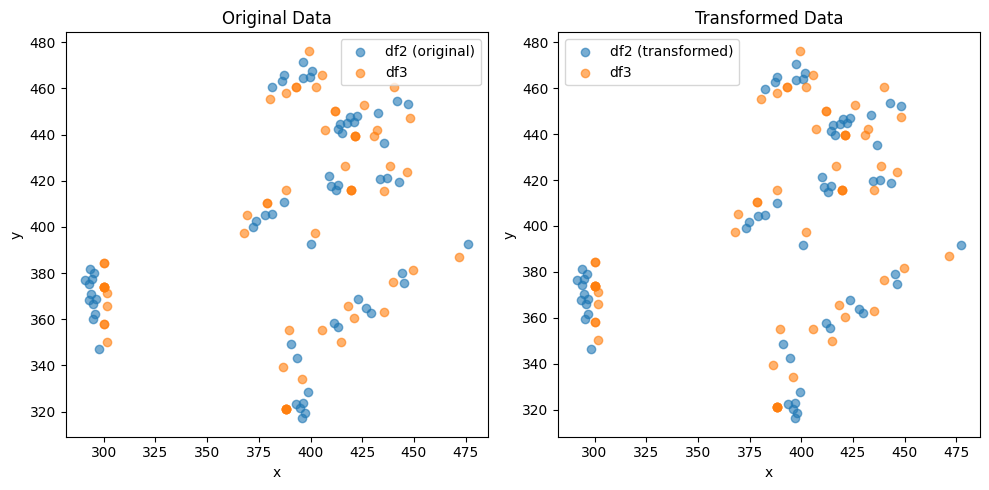

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9616172444921334e-06 , 9.536203958592618e-07 )
Rotation (radians): 0.0014387354915631051
Transform Matrix:
 [[ 9.99998965e-01 -1.43873500e-03 -2.96161724e-06]
 [ 1.43873500e-03  9.99998965e-01  9.53620396e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


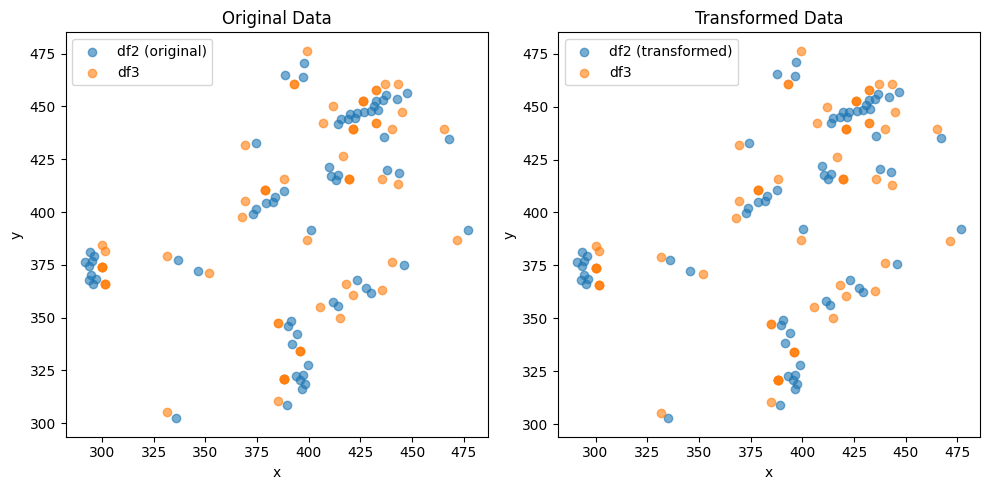

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.91097774551727e-06 , -4.791572809601758e-07 )
Rotation (radians): -0.0010746975772261312
Transform Matrix:
 [[ 9.99999423e-01  1.07469737e-03  1.91097775e-06]
 [-1.07469737e-03  9.99999423e-01 -4.79157281e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


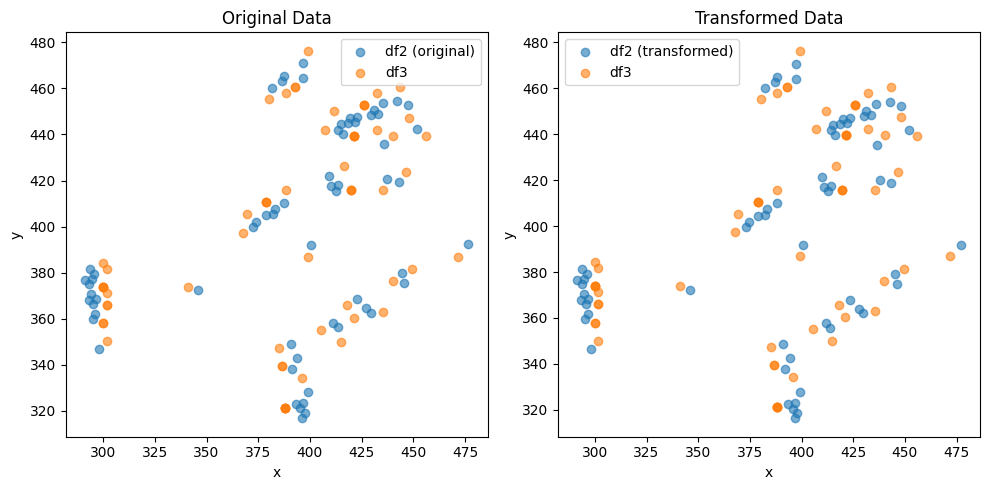

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4083358075594643e-06 , 2.2444262684771905e-06 )
Rotation (radians): 0.0018815333434953777
Transform Matrix:
 [[ 9.99998230e-01 -1.88153223e-03 -2.40833581e-06]
 [ 1.88153223e-03  9.99998230e-01  2.24442627e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


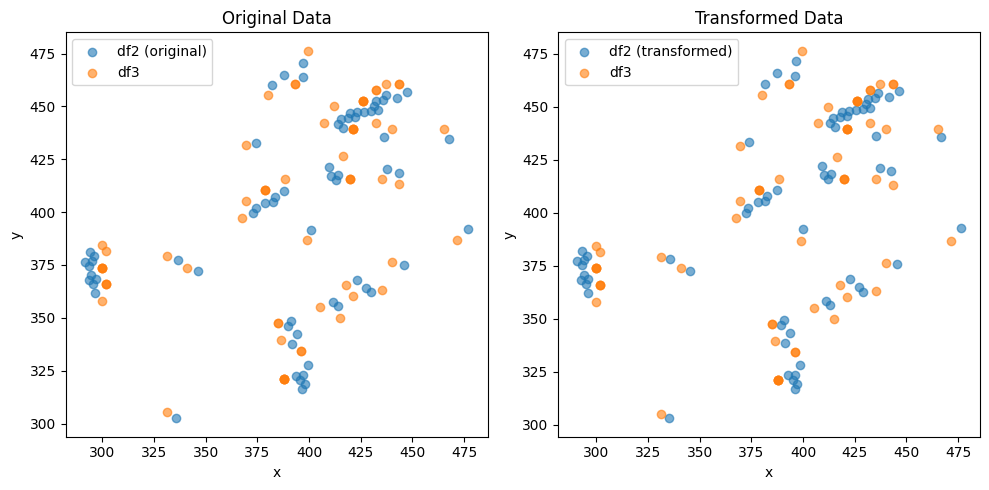

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.000714057143659e-06 , 9.132649704002468e-07 )
Rotation (radians): -0.0022455716095617986
Transform Matrix:
 [[ 9.99997479e-01  2.24556972e-03  6.00071406e-06]
 [-2.24556972e-03  9.99997479e-01  9.13264970e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


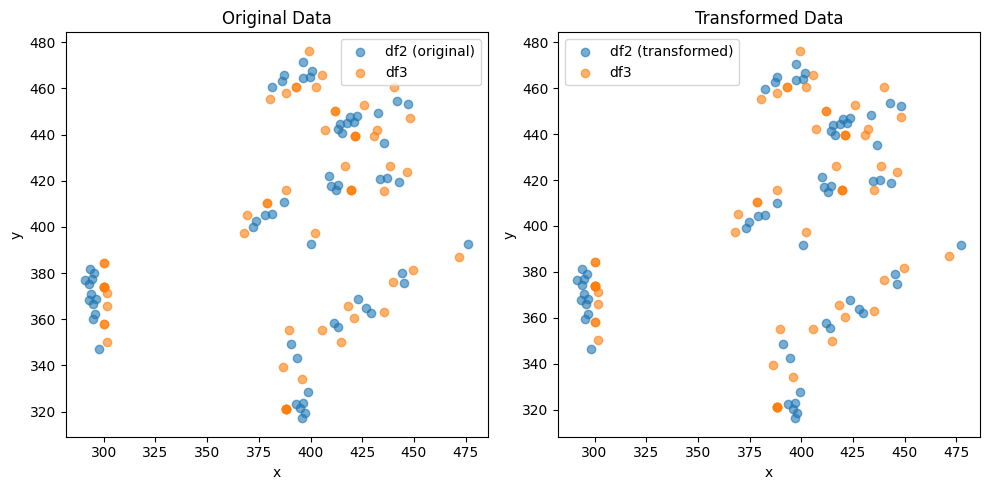

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9622686361486388e-06 , 9.526444598263169e-07 )
Rotation (radians): 0.0014387326179498587
Transform Matrix:
 [[ 9.99998965e-01 -1.43873212e-03 -2.96226864e-06]
 [ 1.43873212e-03  9.99998965e-01  9.52644460e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


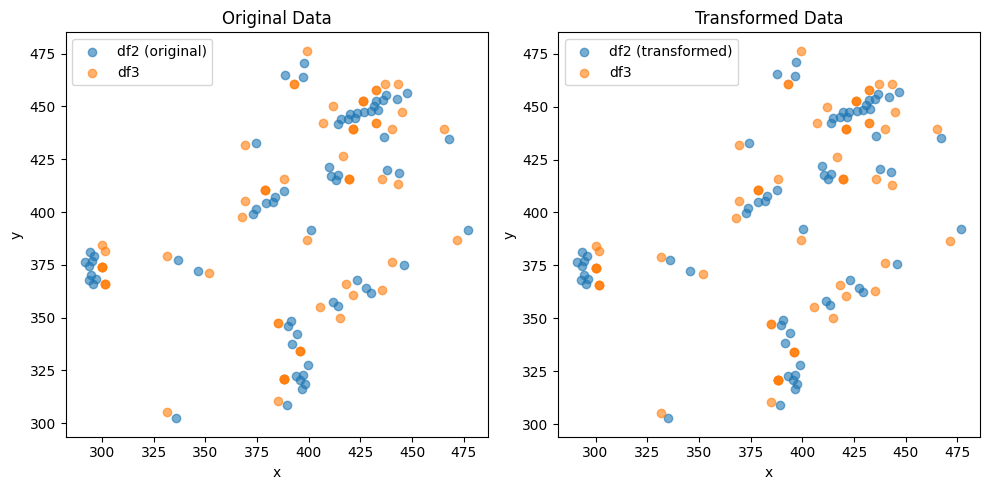

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9116646380550145e-06 , -4.808795675504392e-07 )
Rotation (radians): -0.001074694812694397
Transform Matrix:
 [[ 9.99999423e-01  1.07469461e-03  1.91166464e-06]
 [-1.07469461e-03  9.99999423e-01 -4.80879568e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


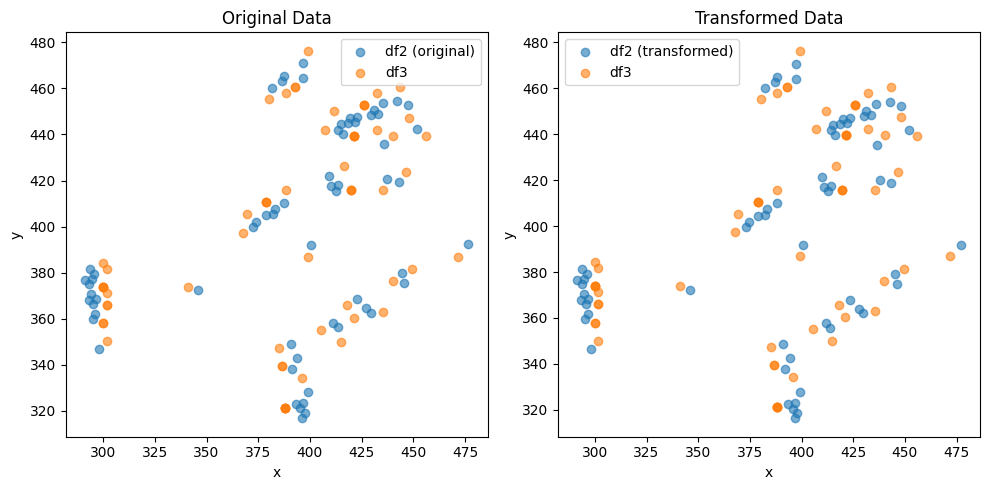

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4101105599020273e-06 , 2.244138482610067e-06 )
Rotation (radians): 0.0018815330578753247
Transform Matrix:
 [[ 9.99998230e-01 -1.88153195e-03 -2.41011056e-06]
 [ 1.88153195e-03  9.99998230e-01  2.24413848e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


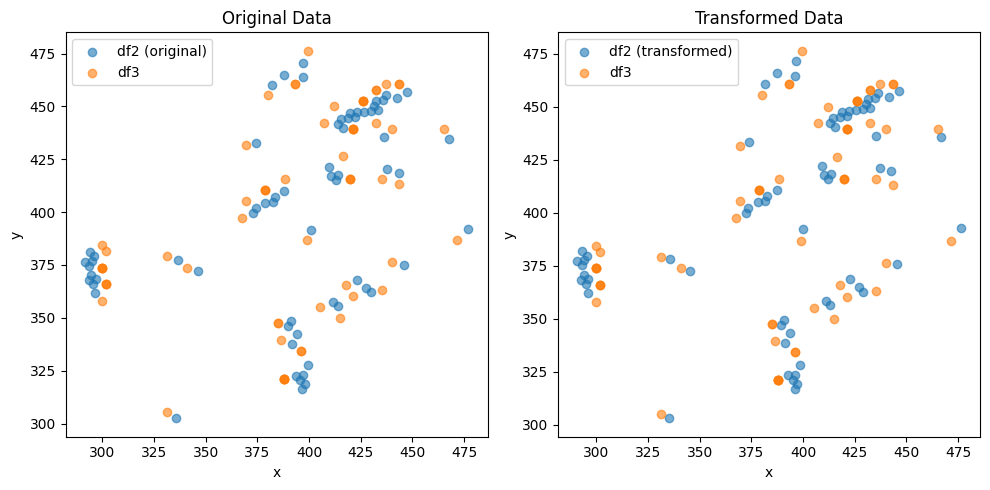

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.0003011610833525e-06 , 9.136737578942015e-07 )
Rotation (radians): -0.0022455727849797517
Transform Matrix:
 [[ 9.99997479e-01  2.24557090e-03  6.00030116e-06]
 [-2.24557090e-03  9.99997479e-01  9.13673758e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


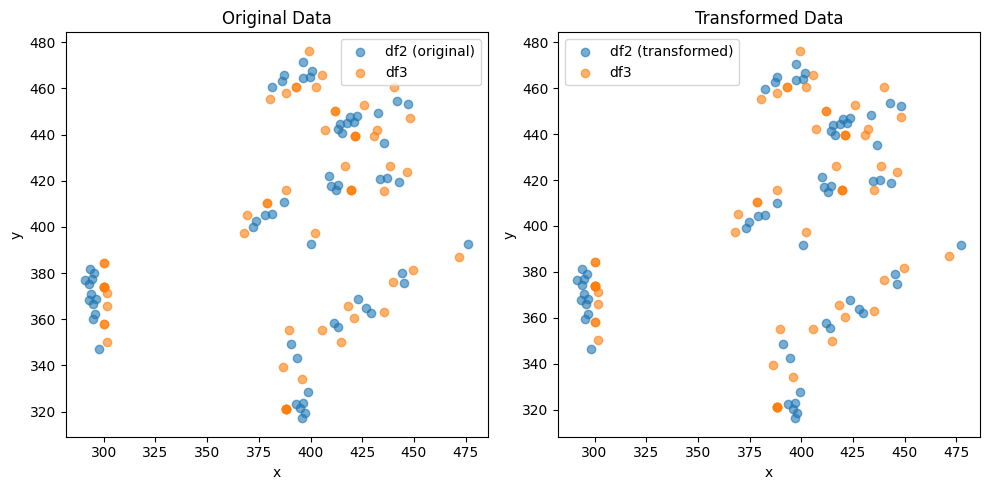

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9619441260929154e-06 , 9.52645771351756e-07 )
Rotation (radians): 0.0014387338556282757
Transform Matrix:
 [[ 9.99998965e-01 -1.43873336e-03 -2.96194413e-06]
 [ 1.43873336e-03  9.99998965e-01  9.52645771e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


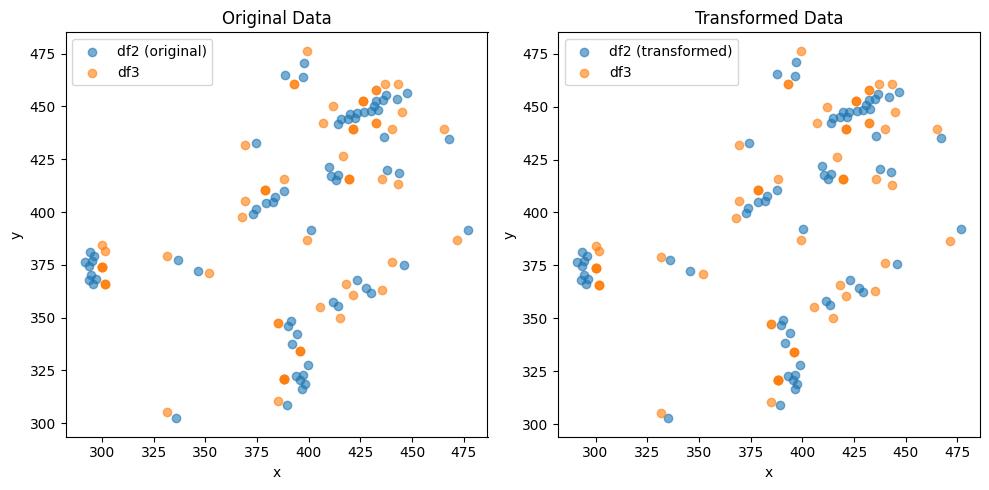

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9113224327934148e-06 , -4.798475255449896e-07 )
Rotation (radians): -0.001074695642827097
Transform Matrix:
 [[ 9.99999423e-01  1.07469544e-03  1.91132243e-06]
 [-1.07469544e-03  9.99999423e-01 -4.79847526e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


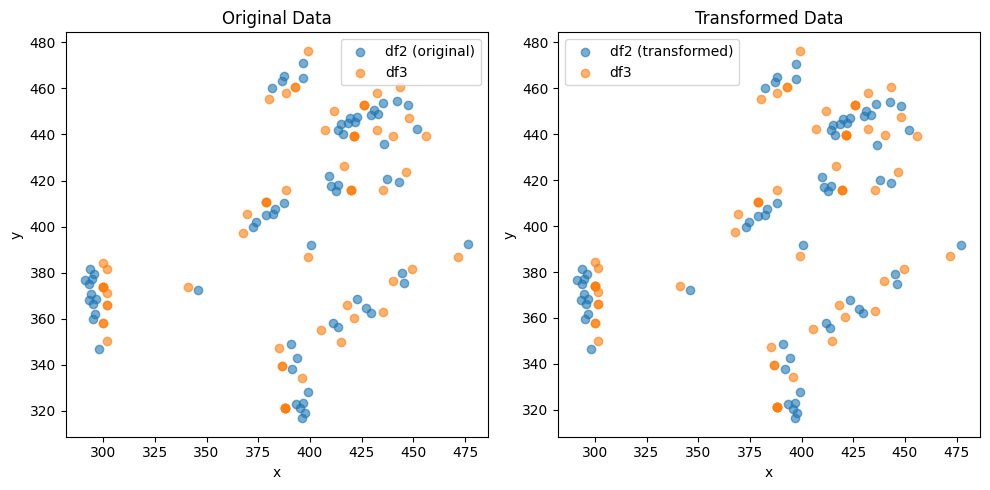

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.409817922341931e-06 , 2.244125501314362e-06 )
Rotation (radians): 0.0018815313123616477
Transform Matrix:
 [[ 9.99998230e-01 -1.88153020e-03 -2.40981792e-06]
 [ 1.88153020e-03  9.99998230e-01  2.24412550e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


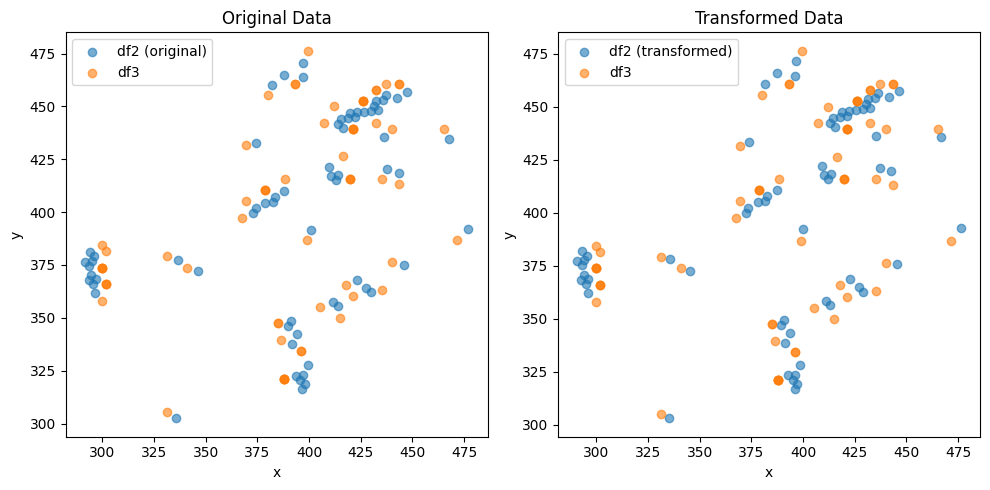

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999892947798875e-06 , 9.128557420136579e-07 )
Rotation (radians): -0.0022455706097517605
Transform Matrix:
 [[ 9.99997479e-01  2.24556872e-03  5.99989295e-06]
 [-2.24556872e-03  9.99997479e-01  9.12855742e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


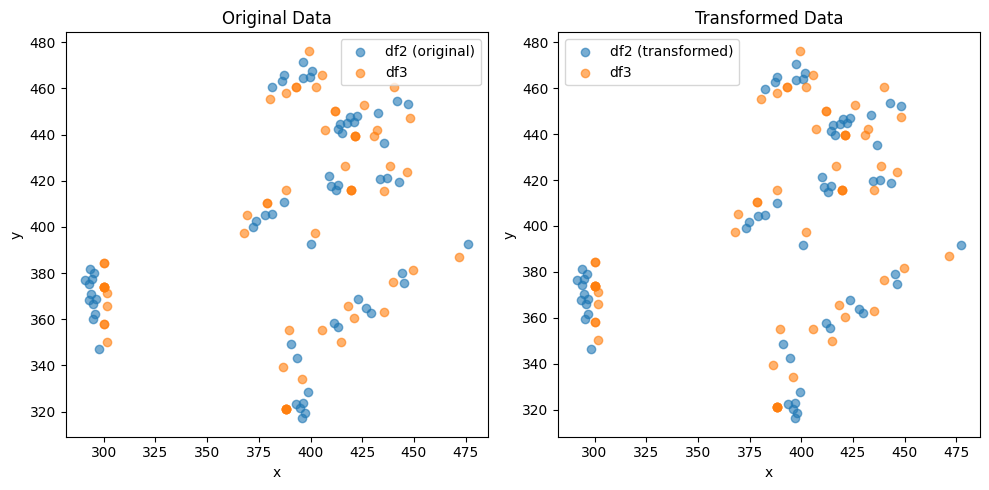

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9606400544377453e-06 , 9.542711721831585e-07 )
Rotation (radians): 0.001438733811170717
Transform Matrix:
 [[ 9.99998965e-01 -1.43873331e-03 -2.96064005e-06]
 [ 1.43873331e-03  9.99998965e-01  9.54271172e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


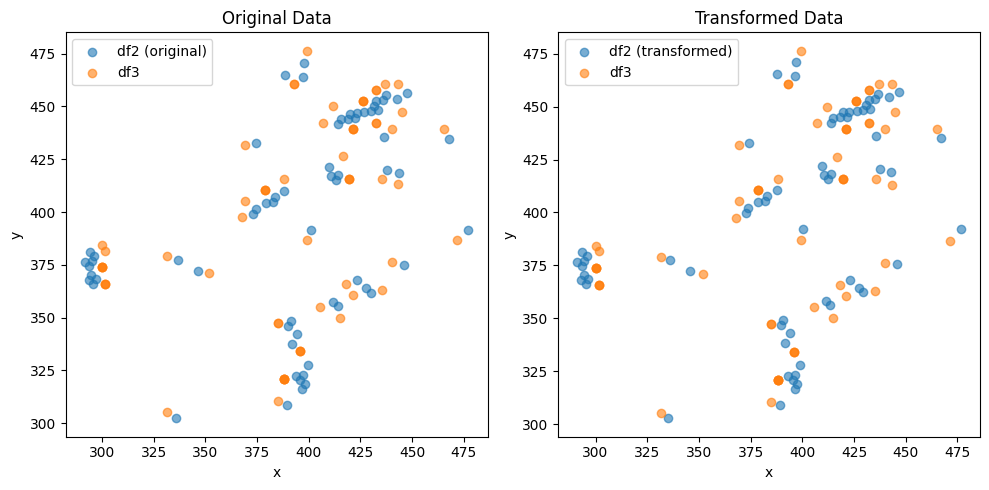

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9120116571476513e-06 , -4.795027994585022e-07 )
Rotation (radians): -0.0010746963921044932
Transform Matrix:
 [[ 9.99999423e-01  1.07469619e-03  1.91201166e-06]
 [-1.07469619e-03  9.99999423e-01 -4.79502799e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


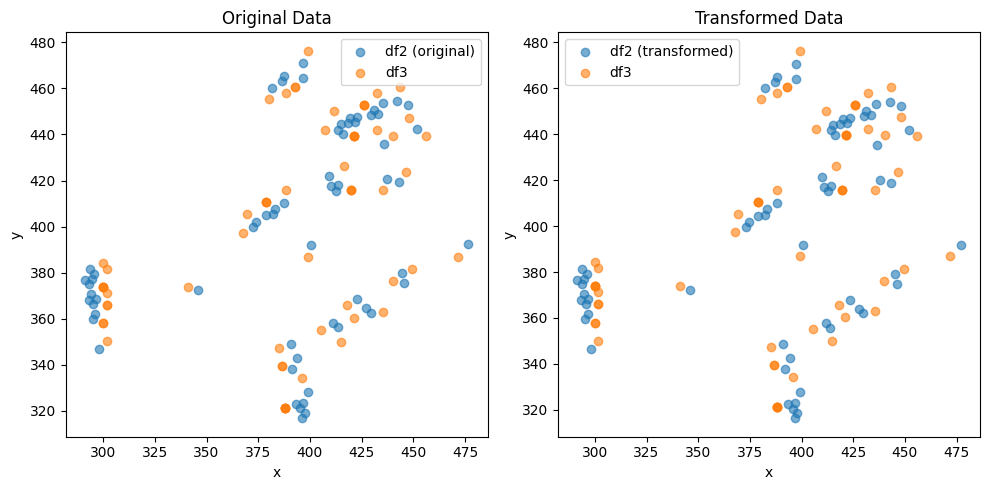

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.410701199204182e-06 , 2.2432504544566615e-06 )
Rotation (radians): 0.0018815334159880198
Transform Matrix:
 [[ 9.99998230e-01 -1.88153231e-03 -2.41070120e-06]
 [ 1.88153231e-03  9.99998230e-01  2.24325045e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


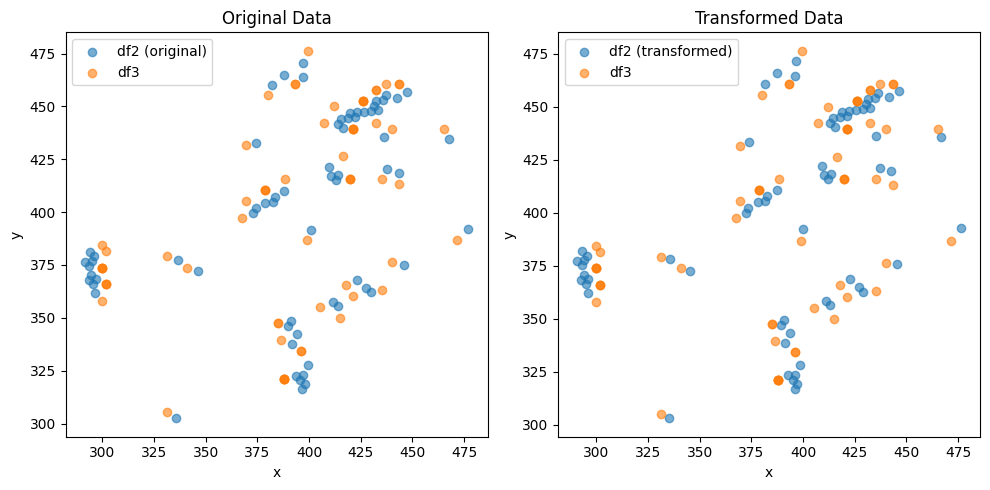

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.000717341458258e-06 , 9.14087037192465e-07 )
Rotation (radians): -0.002245572416802236
Transform Matrix:
 [[ 9.99997479e-01  2.24557053e-03  6.00071734e-06]
 [-2.24557053e-03  9.99997479e-01  9.14087037e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


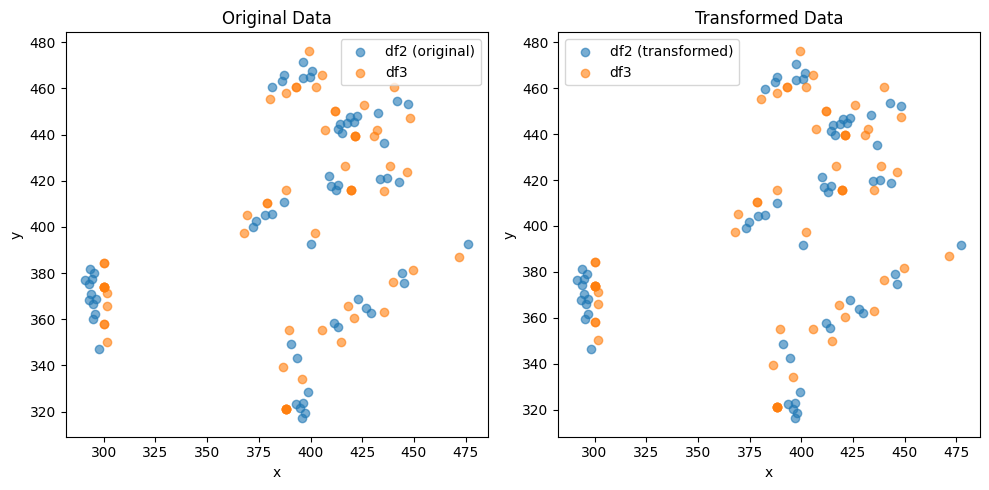

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.960639660345971e-06 , 9.532983317430809e-07 )
Rotation (radians): 0.001438735488929888
Transform Matrix:
 [[ 9.99998965e-01 -1.43873499e-03 -2.96063966e-06]
 [ 1.43873499e-03  9.99998965e-01  9.53298332e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


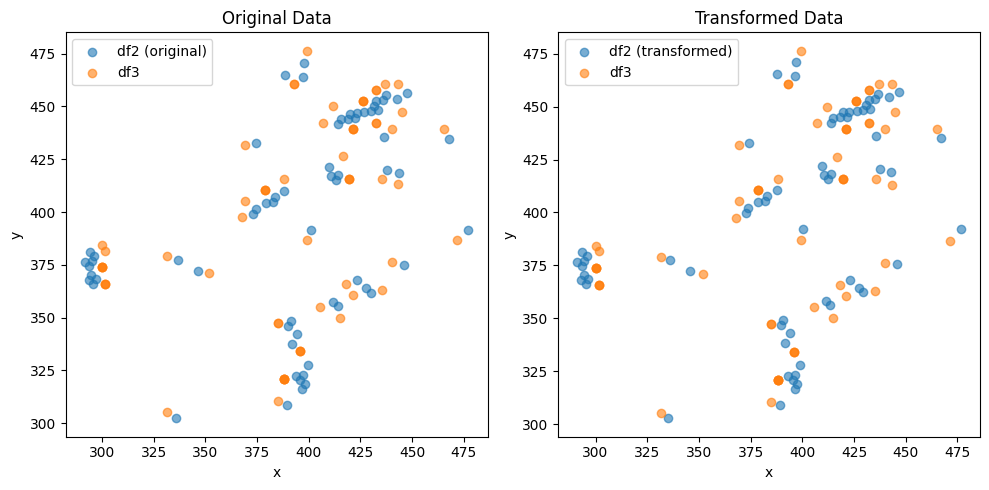

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9120099879814363e-06 , -4.795035032406316e-07 )
Rotation (radians): -0.0010746972332173106
Transform Matrix:
 [[ 9.99999423e-01  1.07469703e-03  1.91200999e-06]
 [-1.07469703e-03  9.99999423e-01 -4.79503503e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


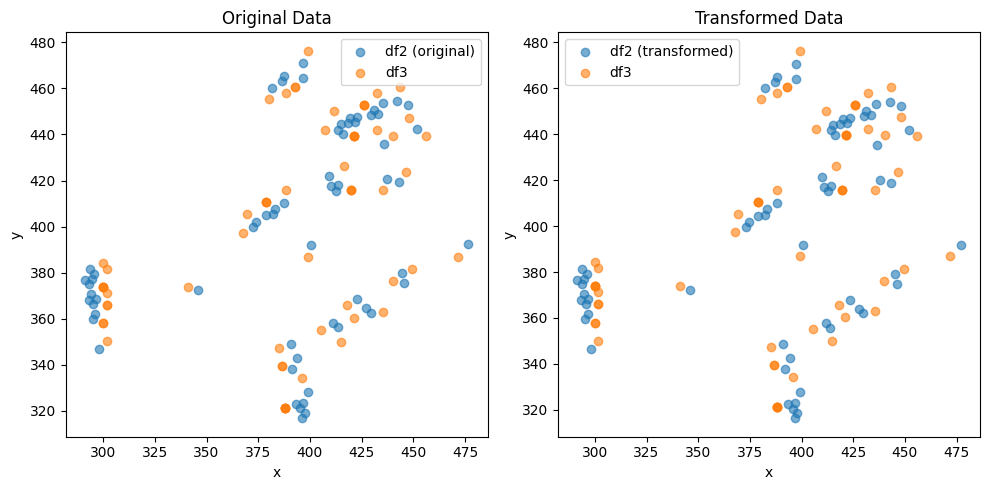

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4083297881214175e-06 , 2.2447201032769777e-06 )
Rotation (radians): 0.00188153306206075
Transform Matrix:
 [[ 9.99998230e-01 -1.88153195e-03 -2.40832979e-06]
 [ 1.88153195e-03  9.99998230e-01  2.24472010e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


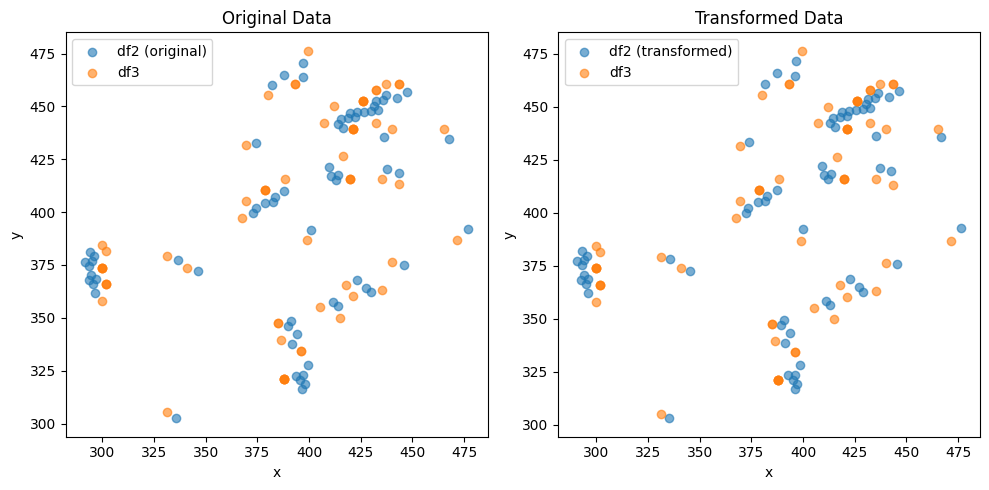

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.000713255786379e-06 , 9.14084229940302e-07 )
Rotation (radians): -0.0022455722218871284
Transform Matrix:
 [[ 9.99997479e-01  2.24557033e-03  6.00071326e-06]
 [-2.24557033e-03  9.99997479e-01  9.14084230e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


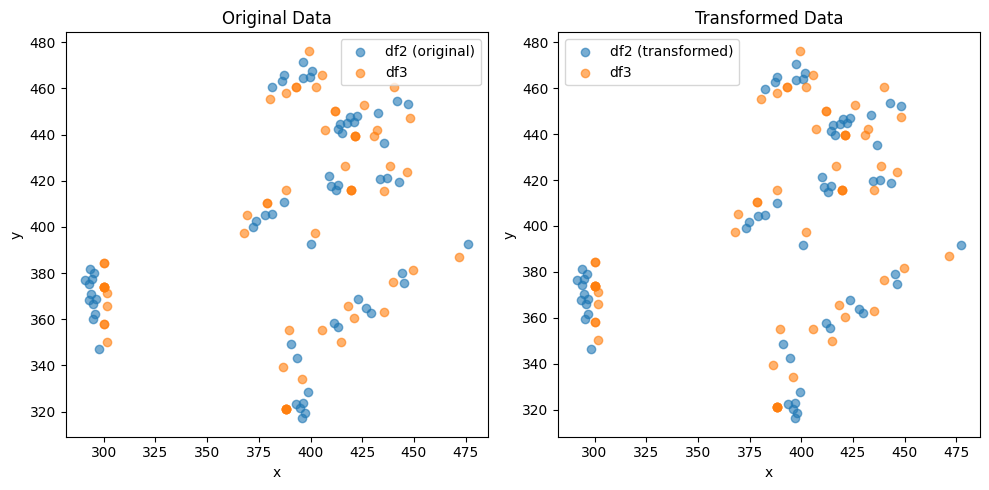

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9612909658810245e-06 , 9.526438169419058e-07 )
Rotation (radians): 0.001438733798003998
Transform Matrix:
 [[ 9.99998965e-01 -1.43873330e-03 -2.96129097e-06]
 [ 1.43873330e-03  9.99998965e-01  9.52643817e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


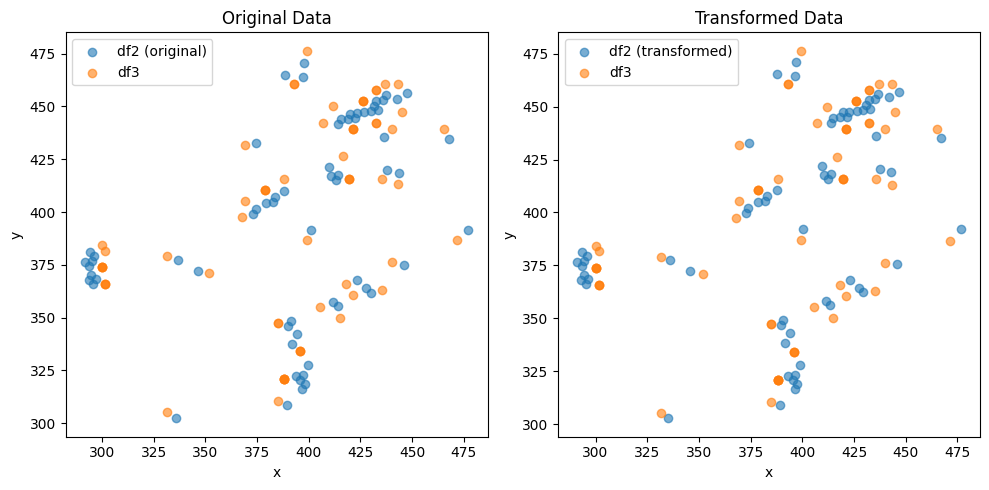

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.912356973151879e-06 , -4.805368760896604e-07 )
Rotation (radians): -0.0010746963308761626
Transform Matrix:
 [[ 9.99999423e-01  1.07469612e-03  1.91235697e-06]
 [-1.07469612e-03  9.99999423e-01 -4.80536876e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


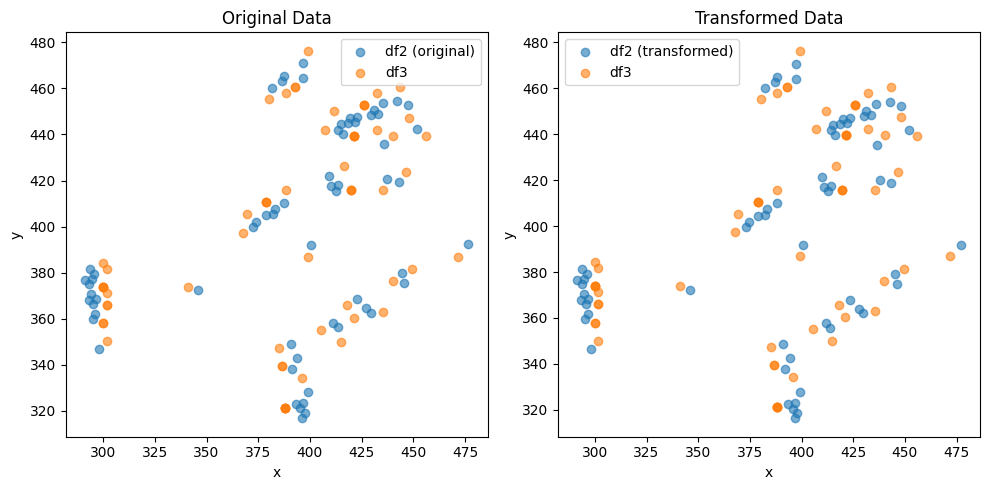

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4098118723741277e-06 , 2.243244762341082e-06 )
Rotation (radians): 0.0018815330601343087
Transform Matrix:
 [[ 9.99998230e-01 -1.88153195e-03 -2.40981187e-06]
 [ 1.88153195e-03  9.99998230e-01  2.24324476e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


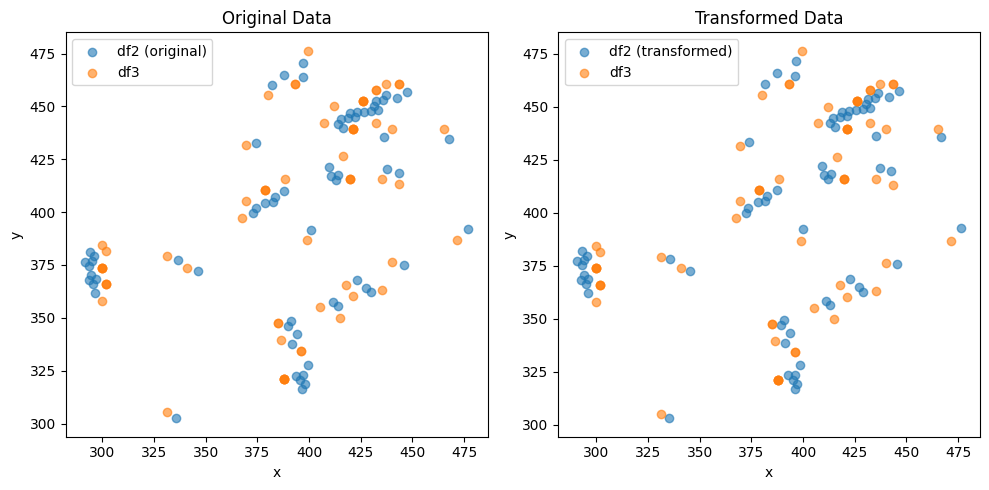

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999482314040992e-06 , 9.140844703709727e-07 )
Rotation (radians): -0.002245570713807702
Transform Matrix:
 [[ 9.99997479e-01  2.24556883e-03  5.99948231e-06]
 [-2.24556883e-03  9.99997479e-01  9.14084470e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


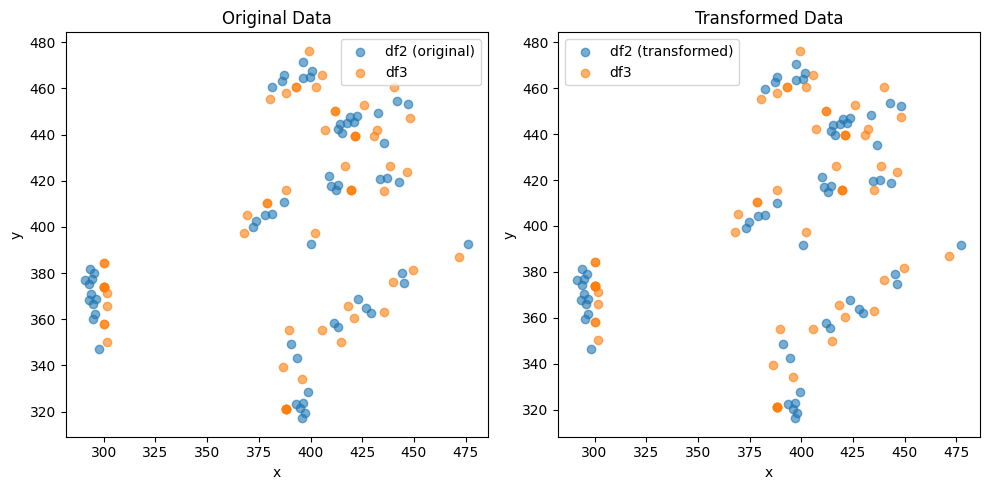

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.960963734826078e-06 , 9.542785211074946e-07 )
Rotation (radians): 0.0014387342857885535
Transform Matrix:
 [[ 9.99998965e-01 -1.43873379e-03 -2.96096373e-06]
 [ 1.43873379e-03  9.99998965e-01  9.54278521e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


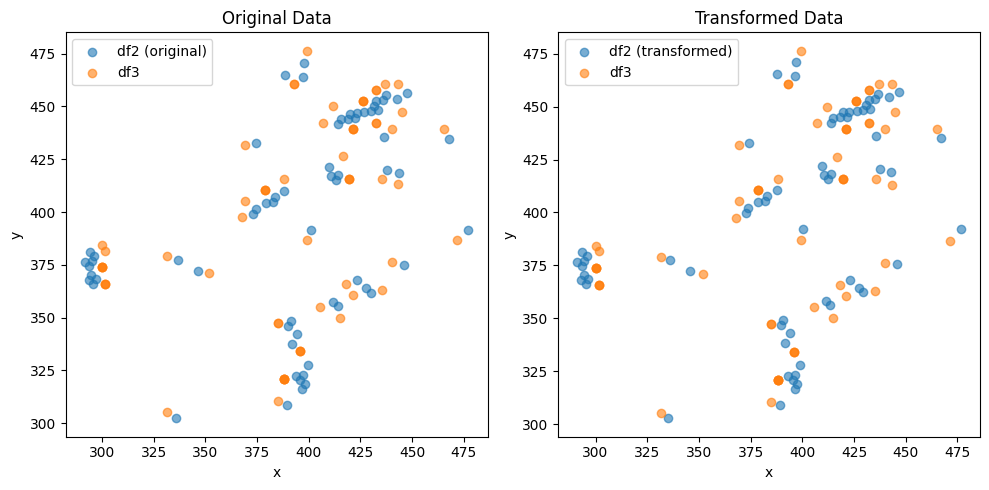

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9123550945508285e-06 , -4.784694818037353e-07 )
Rotation (radians): -0.001074697159075677
Transform Matrix:
 [[ 9.99999423e-01  1.07469695e-03  1.91235509e-06]
 [-1.07469695e-03  9.99999423e-01 -4.78469482e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


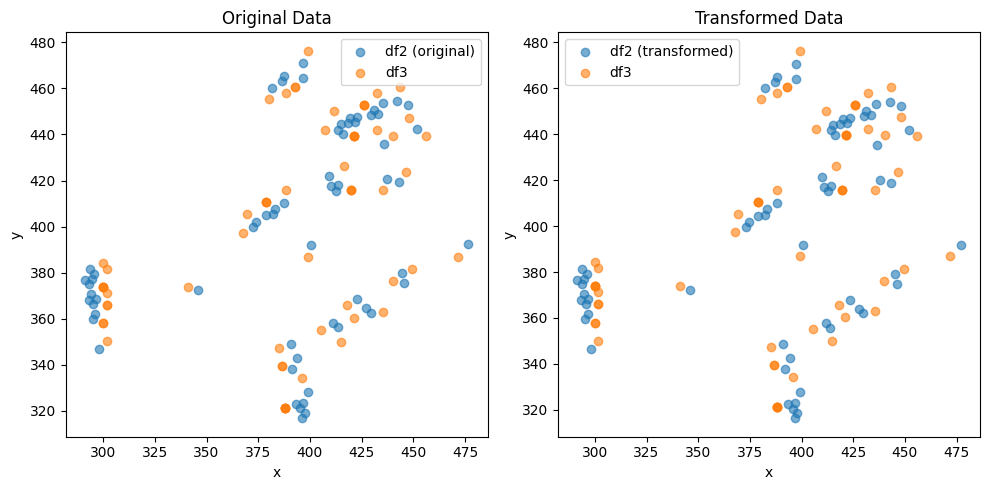

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4095146022866154e-06 , 2.244732829903444e-06 )
Rotation (radians): 0.0018815321070387424
Transform Matrix:
 [[ 9.99998230e-01 -1.88153100e-03 -2.40951460e-06]
 [ 1.88153100e-03  9.99998230e-01  2.24473283e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


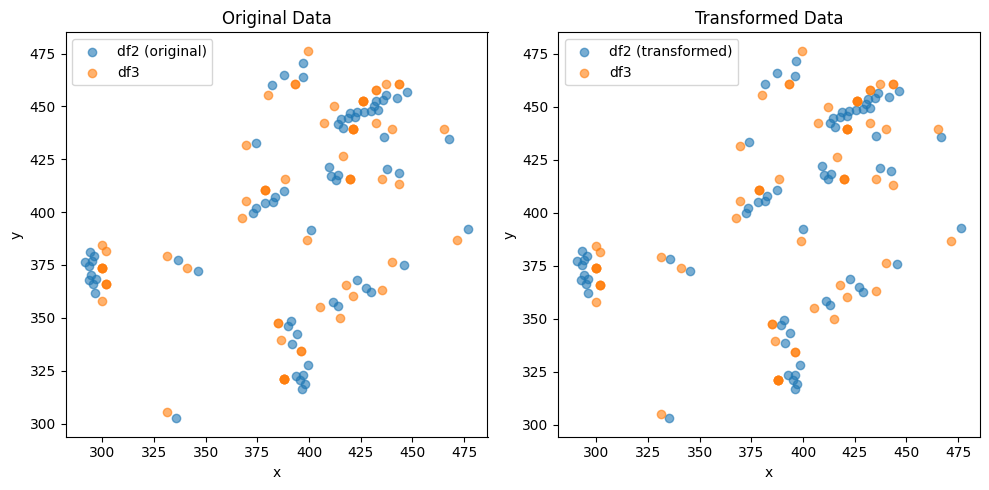

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.00071267149565e-06 , 9.144954425099912e-07 )
Rotation (radians): -0.0022455713959107
Transform Matrix:
 [[ 9.99997479e-01  2.24556951e-03  6.00071267e-06]
 [-2.24556951e-03  9.99997479e-01  9.14495443e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


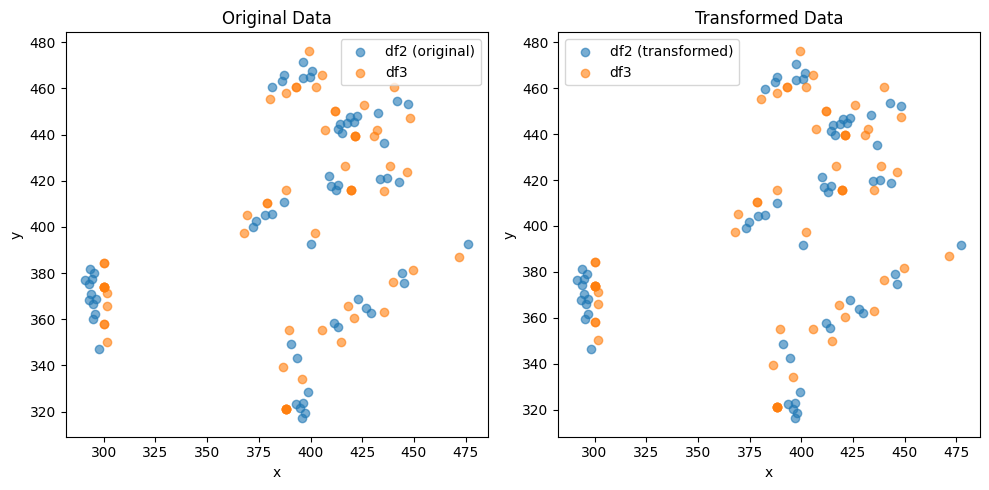

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.960308919620533e-06 , 9.539479904973787e-07 )
Rotation (radians): 0.0014387346492041899
Transform Matrix:
 [[ 9.99998965e-01 -1.43873415e-03 -2.96030892e-06]
 [ 1.43873415e-03  9.99998965e-01  9.53947990e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


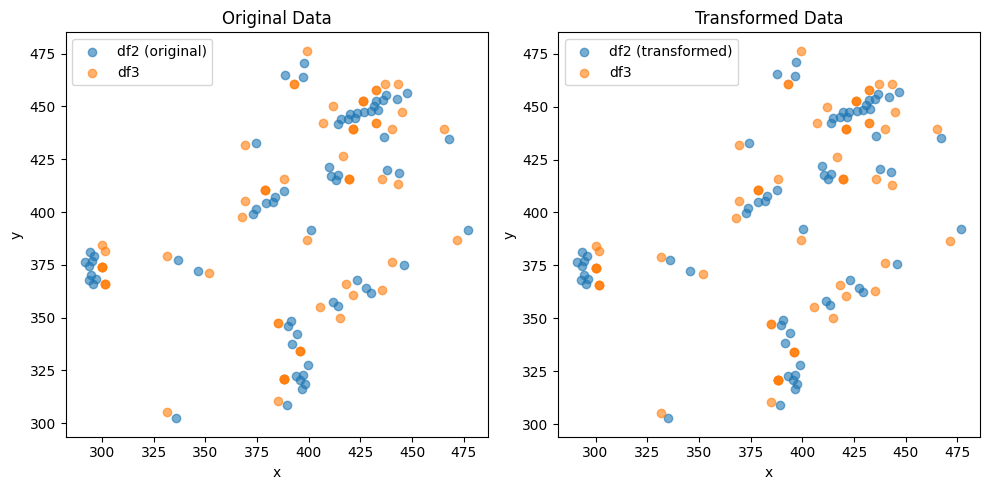

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.912355863638965e-06 , -4.798483261589862e-07 )
Rotation (radians): -0.0010746972909644029
Transform Matrix:
 [[ 9.99999423e-01  1.07469708e-03  1.91235586e-06]
 [-1.07469708e-03  9.99999423e-01 -4.79848326e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


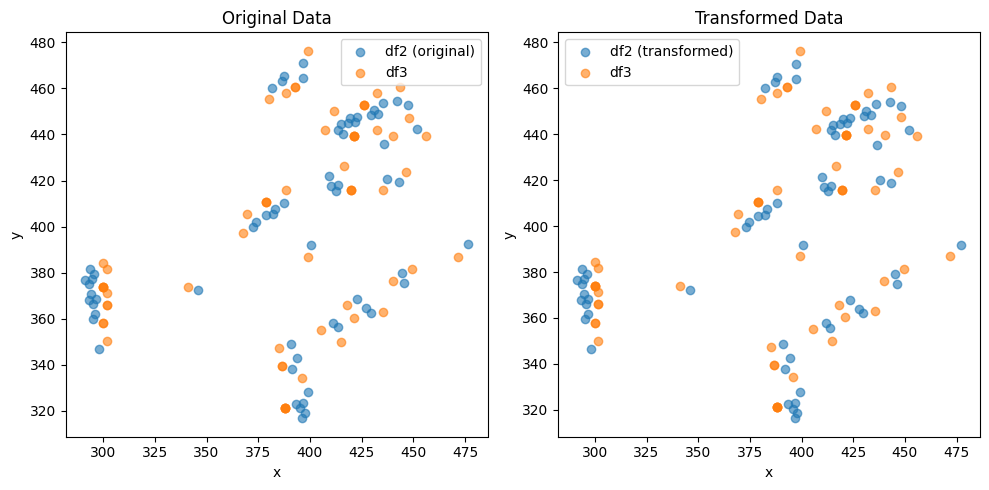

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4106987546567817e-06 , 2.2435432303382466e-06 )
Rotation (radians): 0.0018815332658403596
Transform Matrix:
 [[ 9.99998230e-01 -1.88153216e-03 -2.41069875e-06]
 [ 1.88153216e-03  9.99998230e-01  2.24354323e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


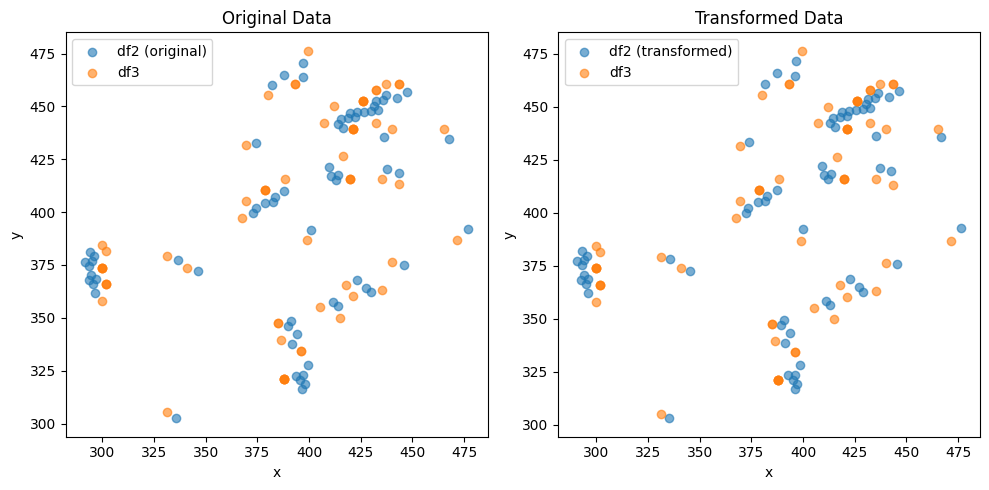

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.000301483514474e-06 , 9.136730460976161e-07 )
Rotation (radians): -0.002245571490374497
Transform Matrix:
 [[ 9.99997479e-01  2.24556960e-03  6.00030148e-06]
 [-2.24556960e-03  9.99997479e-01  9.13673046e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


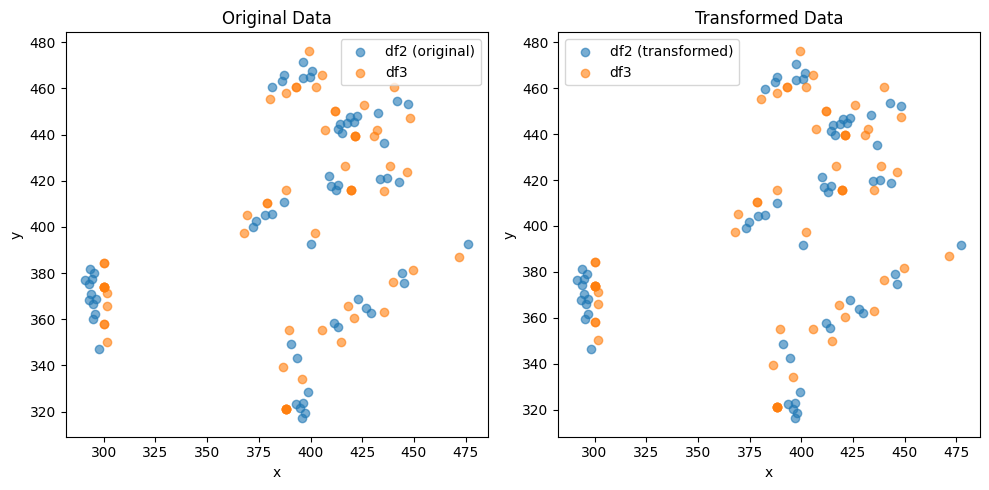

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.959657140732607e-06 , 9.53620487980088e-07 )
Rotation (radians): 0.0014387337120281706
Transform Matrix:
 [[ 9.99998965e-01 -1.43873322e-03 -2.95965714e-06]
 [ 1.43873322e-03  9.99998965e-01  9.53620488e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


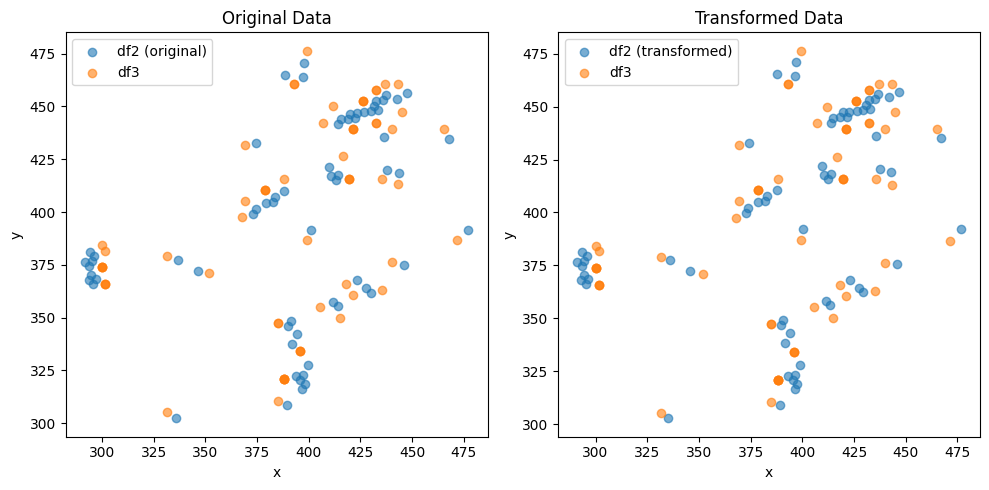

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9127000381067603e-06 , -4.798463347311605e-07 )
Rotation (radians): -0.0010746979453565774
Transform Matrix:
 [[ 9.99999423e-01  1.07469774e-03  1.91270004e-06]
 [-1.07469774e-03  9.99999423e-01 -4.79846335e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


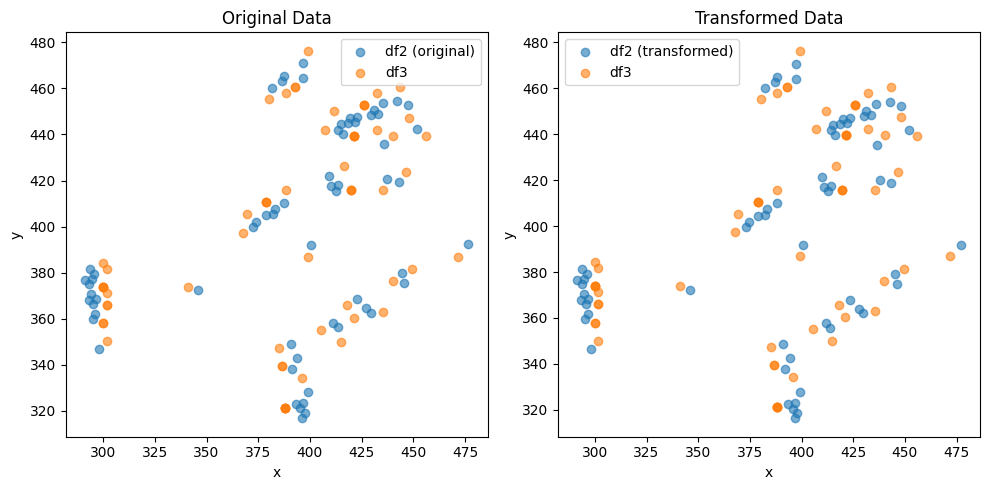

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4104071872507583e-06 , 2.243247324475661e-06 )
Rotation (radians): 0.0018815326505306662
Transform Matrix:
 [[ 9.99998230e-01 -1.88153154e-03 -2.41040719e-06]
 [ 1.88153154e-03  9.99998230e-01  2.24324732e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


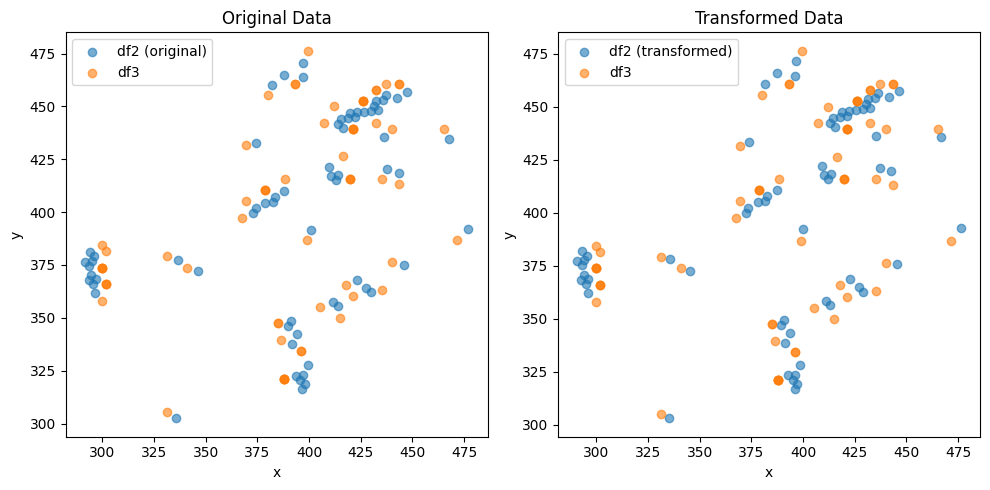

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 6.000299982134446e-06 , 9.136723986195483e-07 )
Rotation (radians): -0.0022455694870201688
Transform Matrix:
 [[ 9.99997479e-01  2.24556760e-03  6.00029998e-06]
 [-2.24556760e-03  9.99997479e-01  9.13672399e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


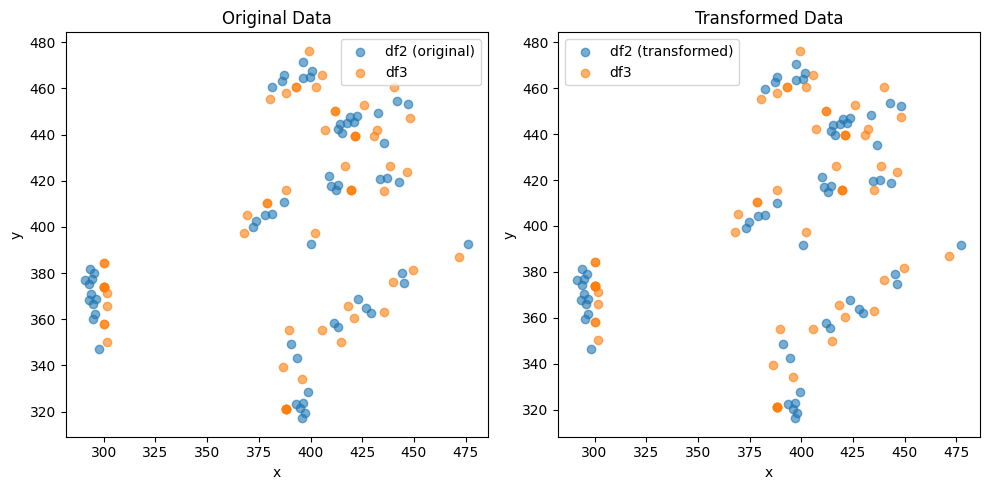

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9599849428367367e-06 , 9.542735652568425e-07 )
Rotation (radians): 0.001438734028741765
Transform Matrix:
 [[ 9.99998965e-01 -1.43873353e-03 -2.95998494e-06]
 [ 1.43873353e-03  9.99998965e-01  9.54273565e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


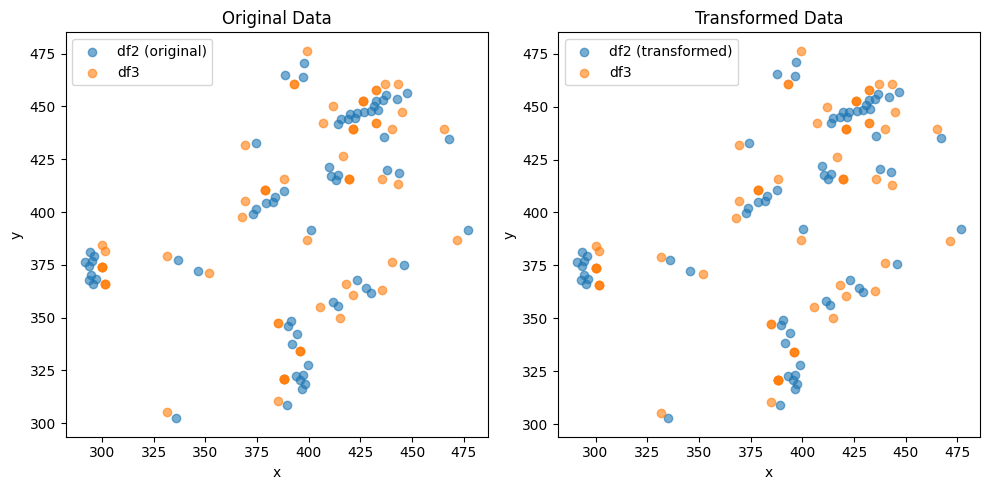

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.90959791287435e-06 , -4.805351166970315e-07 )
Rotation (radians): -0.0010746994211456348
Transform Matrix:
 [[ 9.99999423e-01  1.07469921e-03  1.90959791e-06]
 [-1.07469921e-03  9.99999423e-01 -4.80535117e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


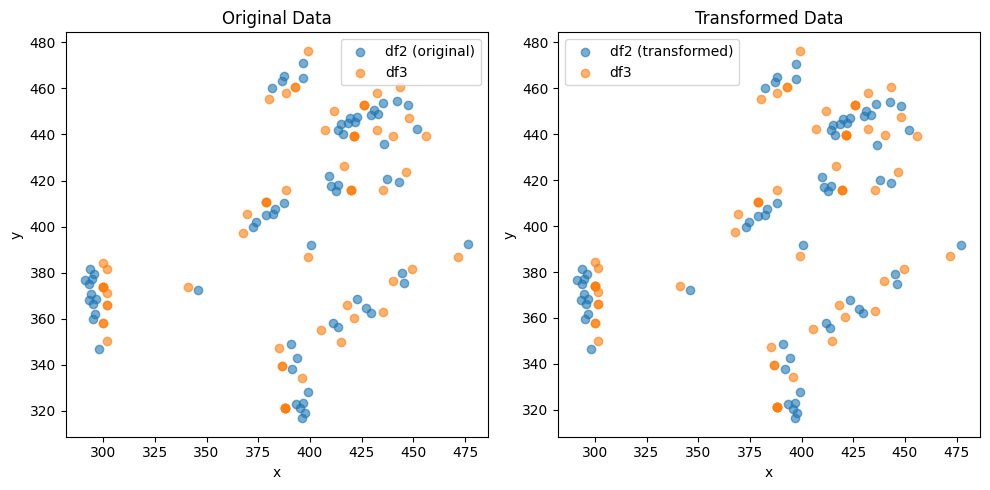

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.409217177437725e-06 , 2.244435421106227e-06 )
Rotation (radians): 0.001881533986160516
Transform Matrix:
 [[ 9.99998230e-01 -1.88153288e-03 -2.40921718e-06]
 [ 1.88153288e-03  9.99998230e-01  2.24443542e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


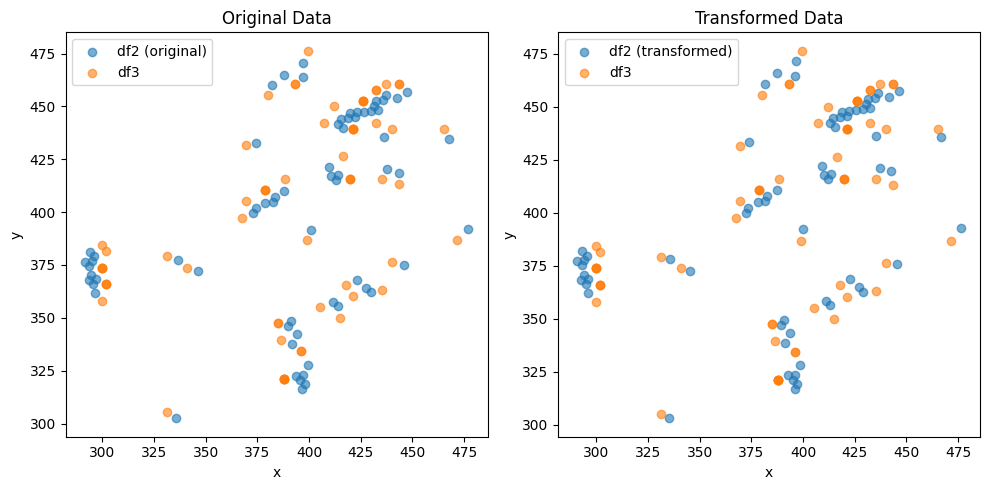

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999070765830083e-06 , 9.12442849240505e-07 )
Rotation (radians): -0.0022455707543995993
Transform Matrix:
 [[ 9.99997479e-01  2.24556887e-03  5.99907077e-06]
 [-2.24556887e-03  9.99997479e-01  9.12442849e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


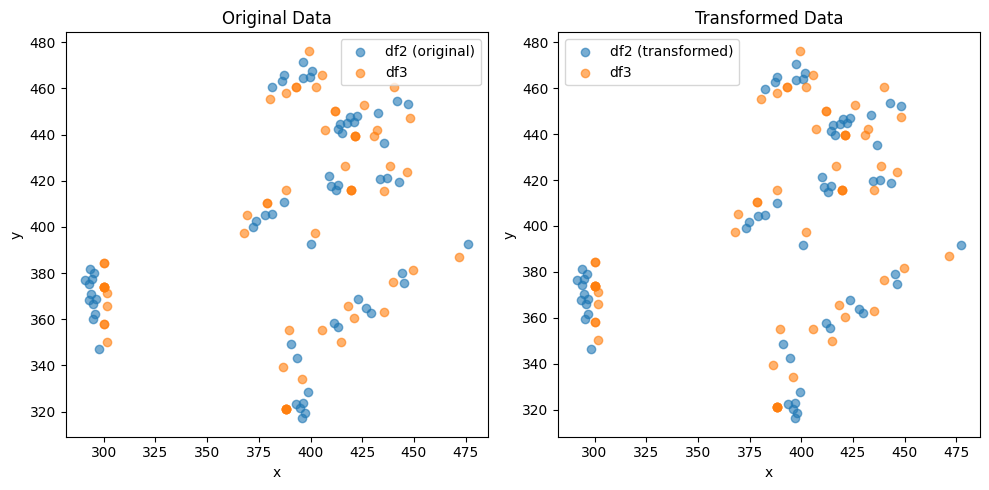

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9603104485986893e-06 , 9.542723058609899e-07 )
Rotation (radians): 0.0014387344542927843
Transform Matrix:
 [[ 9.99998965e-01 -1.43873396e-03 -2.96031045e-06]
 [ 1.43873396e-03  9.99998965e-01  9.54272306e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


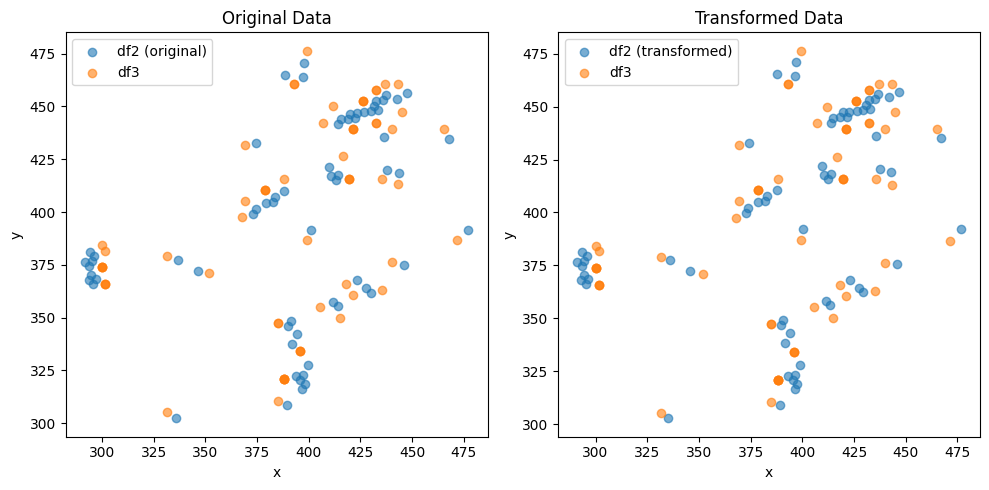

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.912698891675315e-06 , -4.805365046951211e-07 )
Rotation (radians): -0.001074697220507187
Transform Matrix:
 [[ 9.99999423e-01  1.07469701e-03  1.91269889e-06]
 [-1.07469701e-03  9.99999423e-01 -4.80536505e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


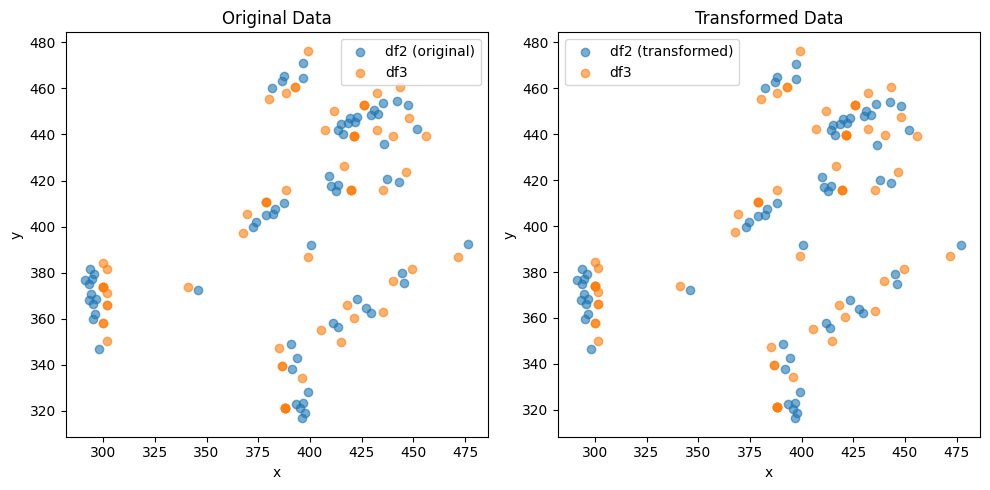

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4098130421487986e-06 , 2.244134153842486e-06 )
Rotation (radians): 0.0018815324996298605
Transform Matrix:
 [[ 9.99998230e-01 -1.88153139e-03 -2.40981304e-06]
 [ 1.88153139e-03  9.99998230e-01  2.24413415e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


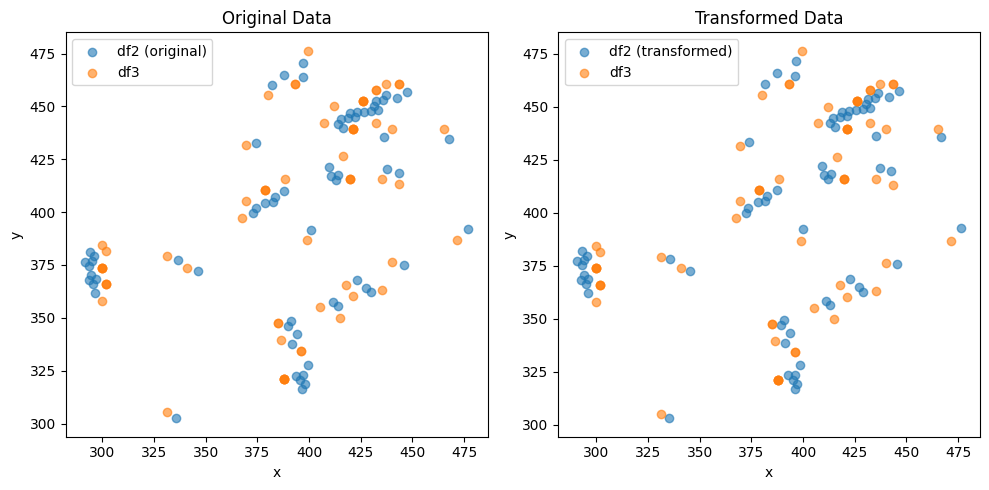

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.998249488799704e-06 , 9.112159674693464e-07 )
Rotation (radians): -0.002245571331978614
Transform Matrix:
 [[ 9.99997479e-01  2.24556944e-03  5.99824949e-06]
 [-2.24556944e-03  9.99997479e-01  9.11215967e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


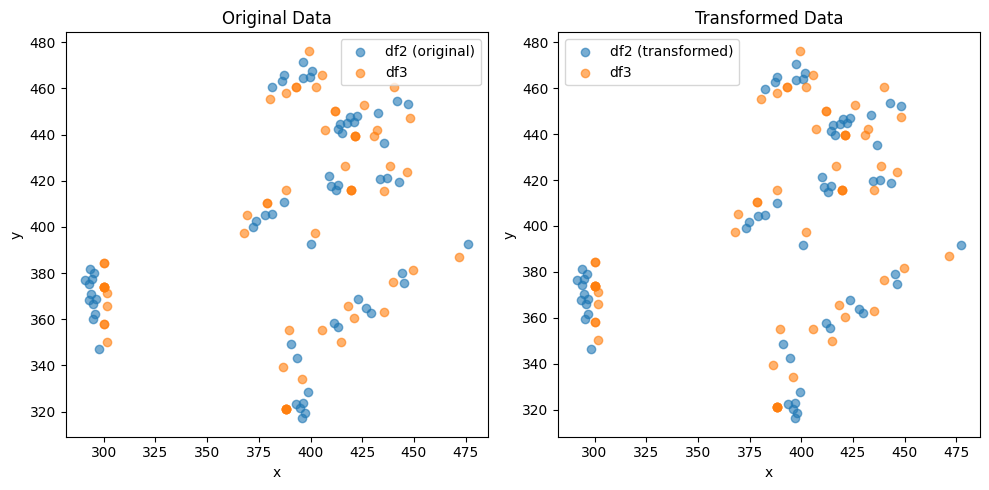

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.960966558878166e-06 , 9.542757489734793e-07 )
Rotation (radians): 0.0014387344737011203
Transform Matrix:
 [[ 9.99998965e-01 -1.43873398e-03 -2.96096656e-06]
 [ 1.43873398e-03  9.99998965e-01  9.54275749e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


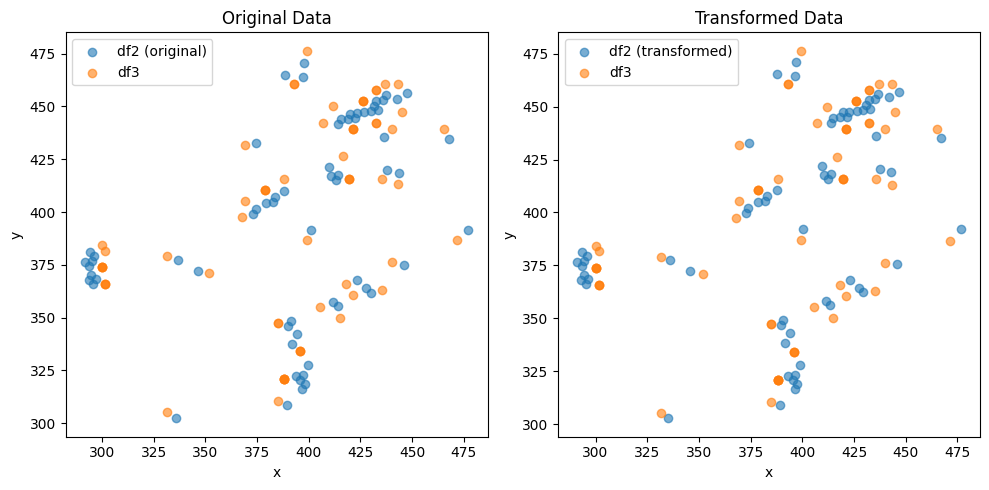

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9116655532573563e-06 , -4.80880451963564e-07 )
Rotation (radians): -0.0010746988598978168
Transform Matrix:
 [[ 9.99999423e-01  1.07469865e-03  1.91166555e-06]
 [-1.07469865e-03  9.99999423e-01 -4.80880452e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


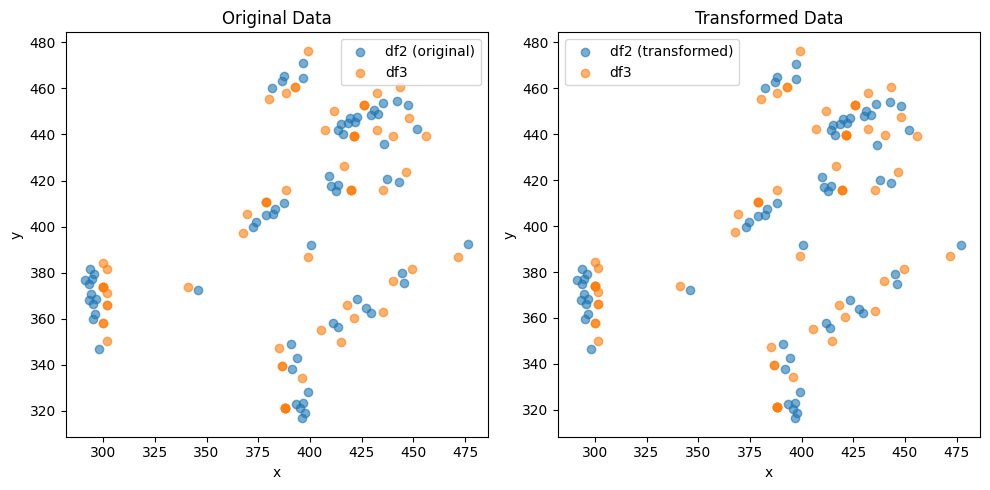

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.410106746530699e-06 , 2.2432420600091904e-06 )
Rotation (radians): 0.0018815350929497021
Transform Matrix:
 [[ 9.99998230e-01 -1.88153398e-03 -2.41010675e-06]
 [ 1.88153398e-03  9.99998230e-01  2.24324206e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


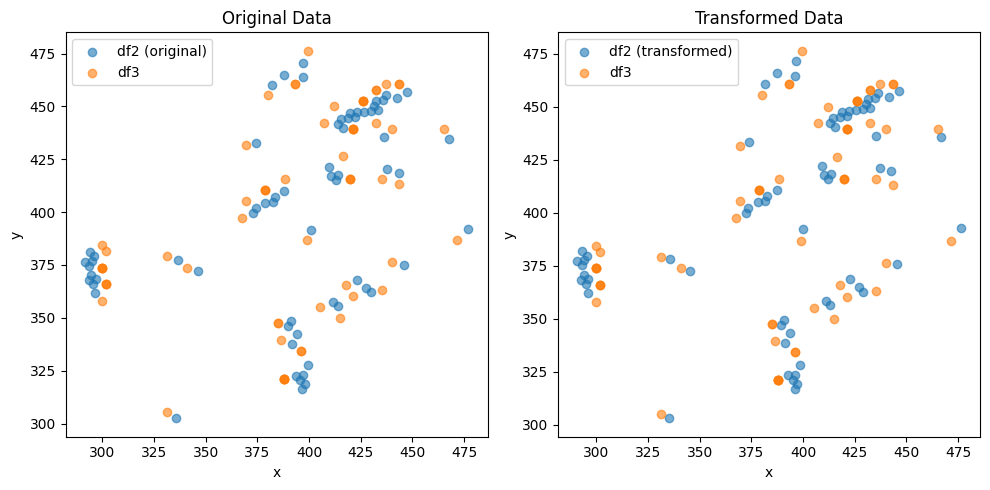

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999478964114837e-06 , 9.128538692785522e-07 )
Rotation (radians): -0.002245570173606825
Transform Matrix:
 [[ 9.99997479e-01  2.24556829e-03  5.99947896e-06]
 [-2.24556829e-03  9.99997479e-01  9.12853869e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


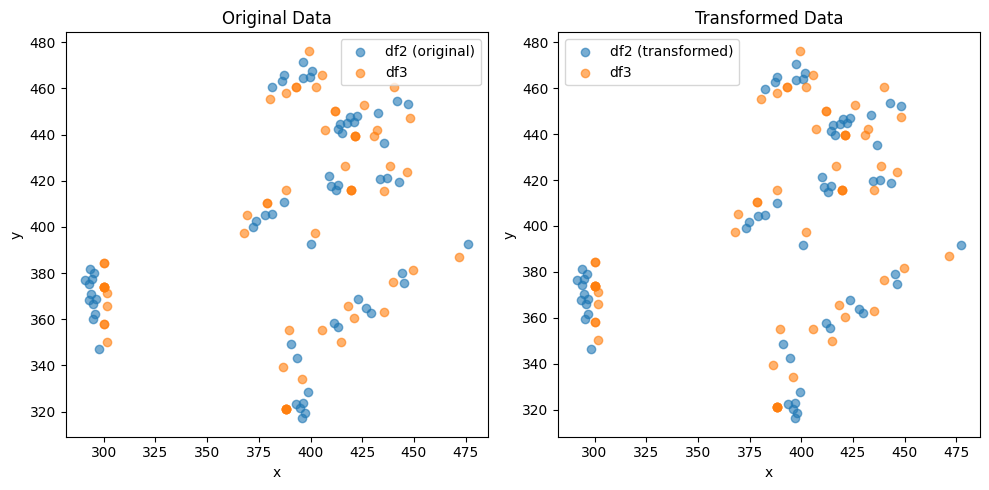

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9612885180556314e-06 , 9.532985778619673e-07 )
Rotation (radians): 0.0014387339108910607
Transform Matrix:
 [[ 9.99998965e-01 -1.43873341e-03 -2.96128852e-06]
 [ 1.43873341e-03  9.99998965e-01  9.53298578e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


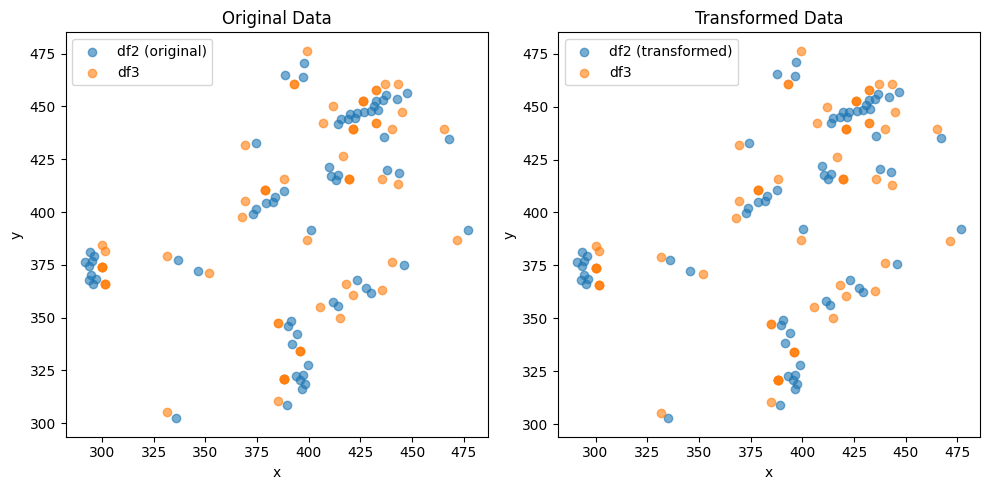

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9109780013301566e-06 , -4.805363377749099e-07 )
Rotation (radians): -0.0010746991562228146
Transform Matrix:
 [[ 9.99999423e-01  1.07469895e-03  1.91097800e-06]
 [-1.07469895e-03  9.99999423e-01 -4.80536338e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


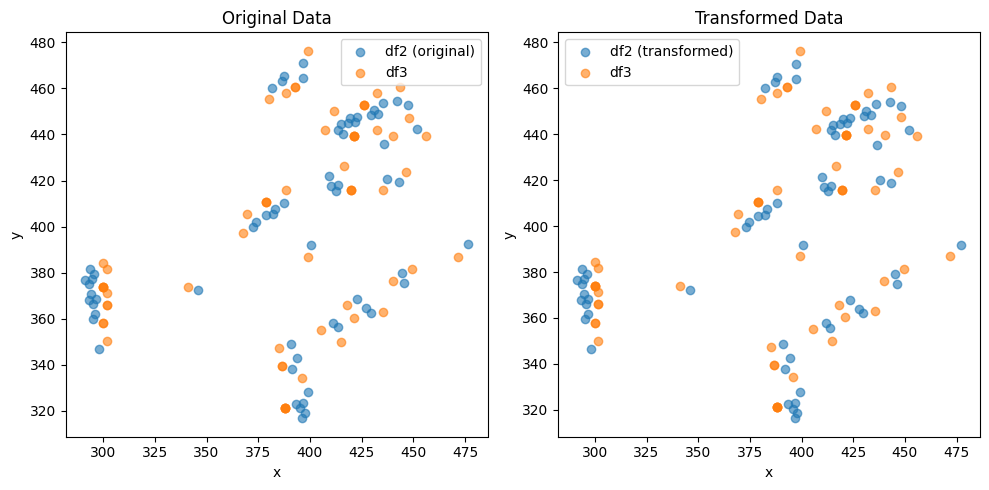

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.4086255817811097e-06 , 2.2435371760489364e-06 )
Rotation (radians): 0.0018815337565866591
Transform Matrix:
 [[ 9.99998230e-01 -1.88153265e-03 -2.40862558e-06]
 [ 1.88153265e-03  9.99998230e-01  2.24353718e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


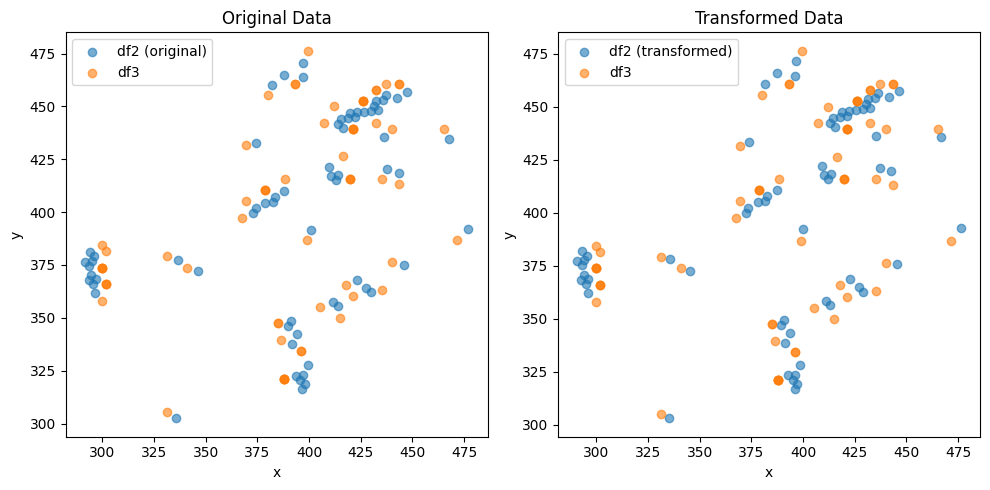

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999477592911077e-06 , 9.12856262603857e-07 )
Rotation (radians): -0.002245570177834196
Transform Matrix:
 [[ 9.99997479e-01  2.24556829e-03  5.99947759e-06]
 [-2.24556829e-03  9.99997479e-01  9.12856263e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


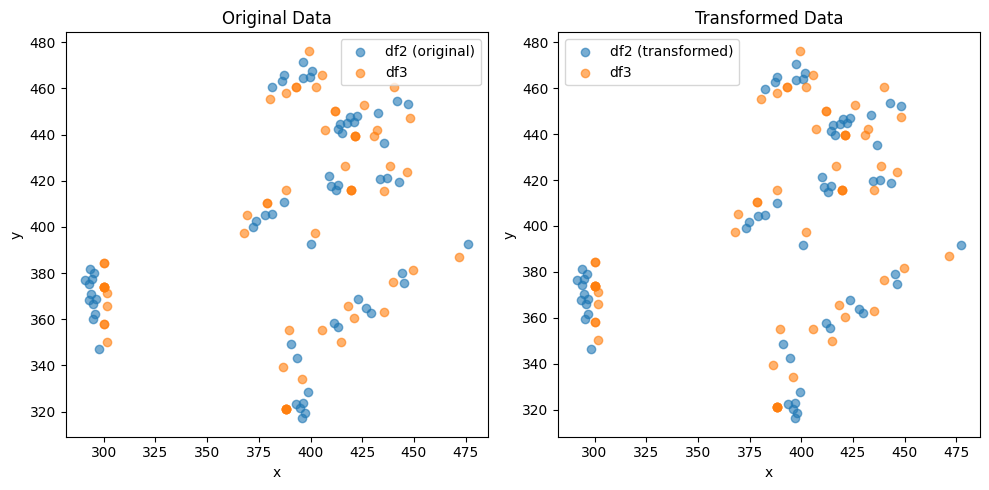

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.9586798515521795e-06 , 9.562274863863705e-07 )
Rotation (radians): 0.0014387339365856944
Transform Matrix:
 [[ 9.99998965e-01 -1.43873344e-03 -2.95867985e-06]
 [ 1.43873344e-03  9.99998965e-01  9.56227486e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


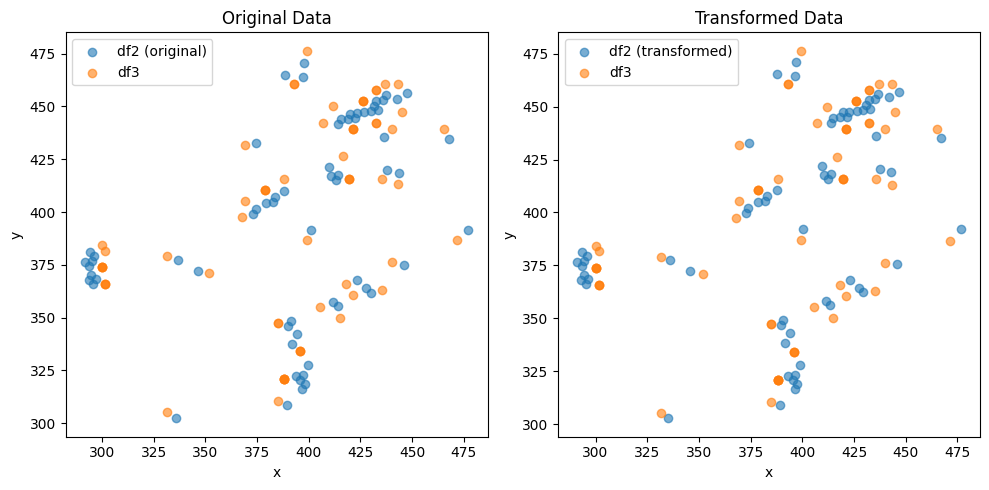

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.910286510500094e-06 , -4.801914255837207e-07 )
Rotation (radians): -0.0010746992417924976
Transform Matrix:
 [[ 9.99999423e-01  1.07469903e-03  1.91028651e-06]
 [-1.07469903e-03  9.99999423e-01 -4.80191426e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


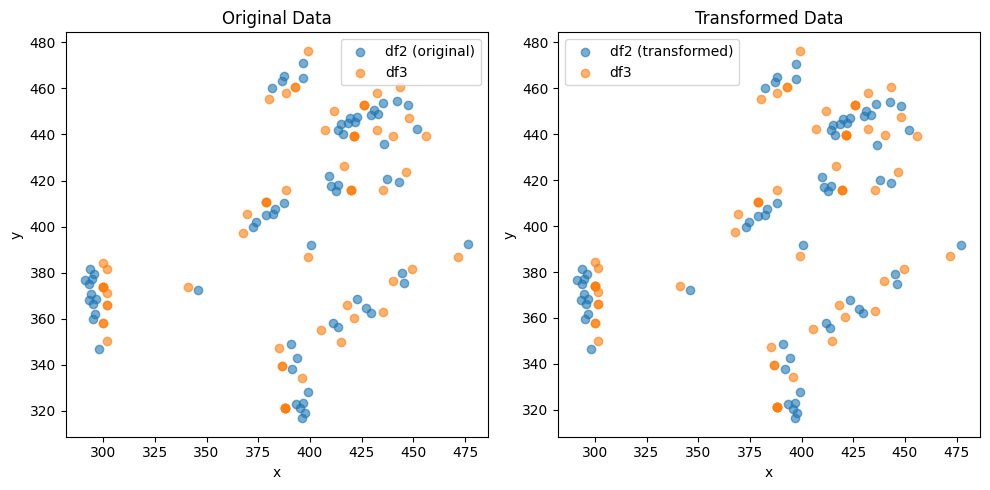

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.410409035161797e-06 , 2.2423565113272e-06 )
Rotation (radians): 0.0018815329042348777
Transform Matrix:
 [[ 9.99998230e-01 -1.88153179e-03 -2.41040904e-06]
 [ 1.88153179e-03  9.99998230e-01  2.24235651e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


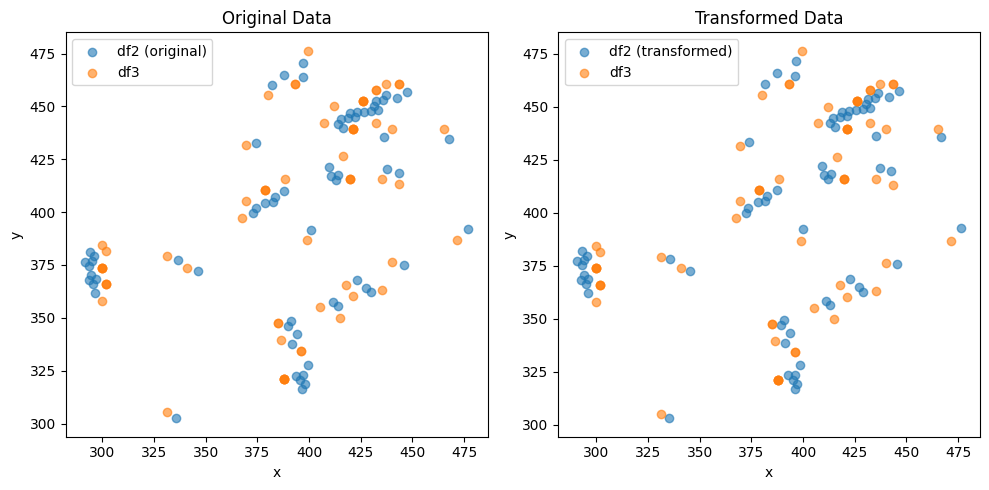

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.999890045455304e-06 , 9.132642088286317e-07 )
Rotation (radians): -0.002245568914673512
Transform Matrix:
 [[ 9.99997479e-01  2.24556703e-03  5.99989005e-06]
 [-2.24556703e-03  9.99997479e-01  9.13264209e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


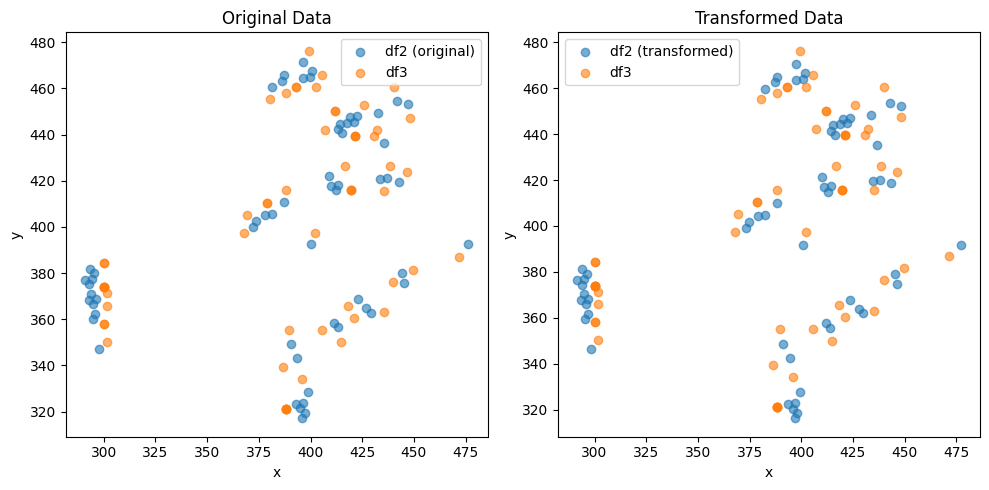

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.960313479107574e-06 , 9.552544881589695e-07 )
Rotation (radians): 0.0014387342069992462
Transform Matrix:
 [[ 9.99998965e-01 -1.43873371e-03 -2.96031348e-06]
 [ 1.43873371e-03  9.99998965e-01  9.55254488e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


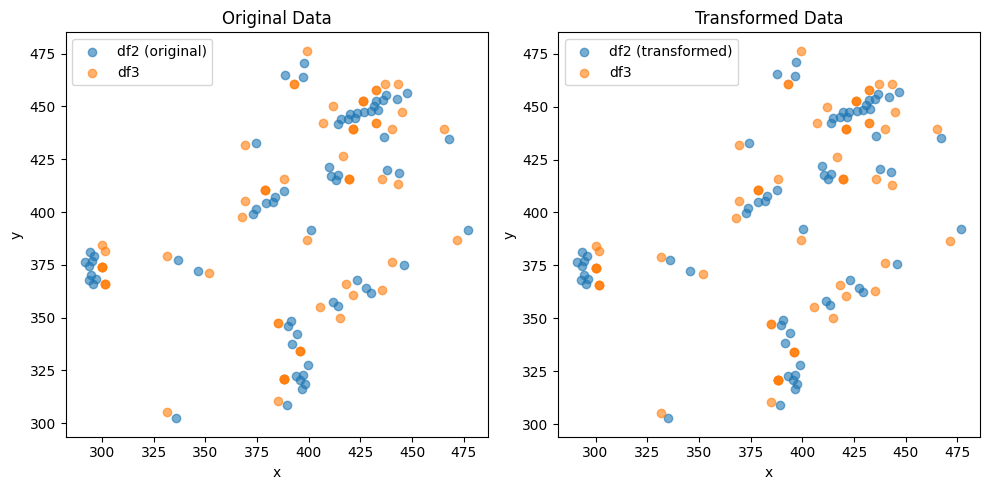

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9106335240334e-06 , -4.805358026894148e-07 )
Rotation (radians): -0.0010747007113025443
Transform Matrix:
 [[ 9.99999423e-01  1.07470050e-03  1.91063352e-06]
 [-1.07470050e-03  9.99999423e-01 -4.80535803e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


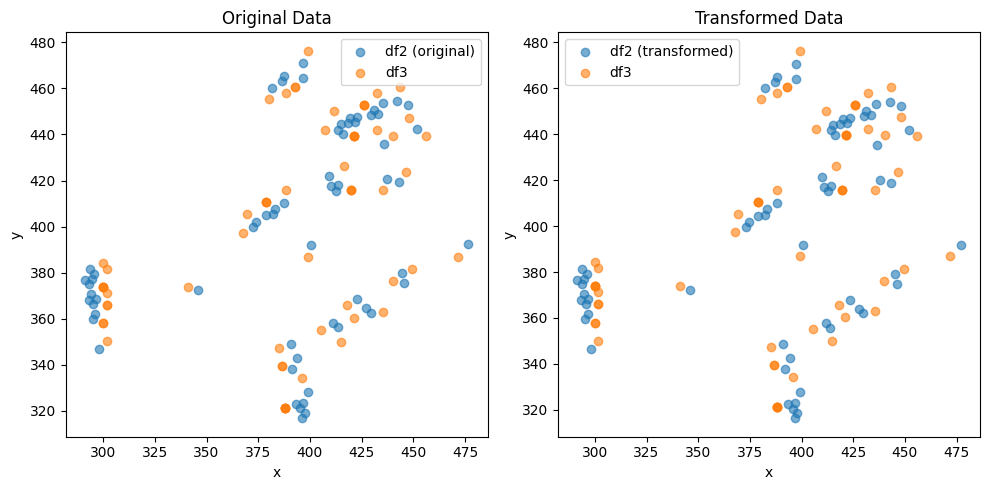

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.40892324377319e-06 , 2.2444254460410864e-06 )
Rotation (radians): 0.0018815347361884958
Transform Matrix:
 [[ 9.99998230e-01 -1.88153363e-03 -2.40892324e-06]
 [ 1.88153363e-03  9.99998230e-01  2.24442545e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


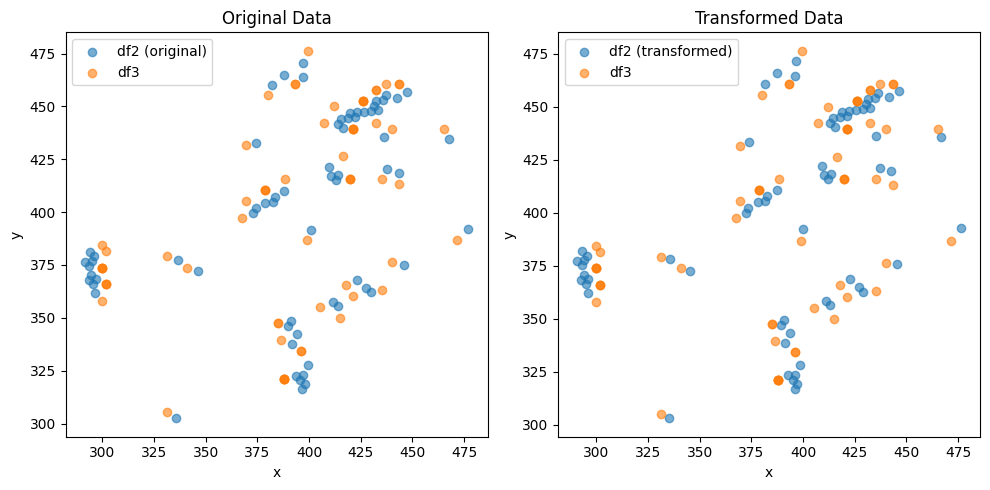

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (59,)
Optimal Translation and Rotation Parameters:
Translation: ( 5.997426386261131e-06 , 9.11623885725962e-07 )
Rotation (radians): -0.0022455708278326394
Transform Matrix:
 [[ 9.99997479e-01  2.24556894e-03  5.99742639e-06]
 [-2.24556894e-03  9.99997479e-01  9.11623886e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


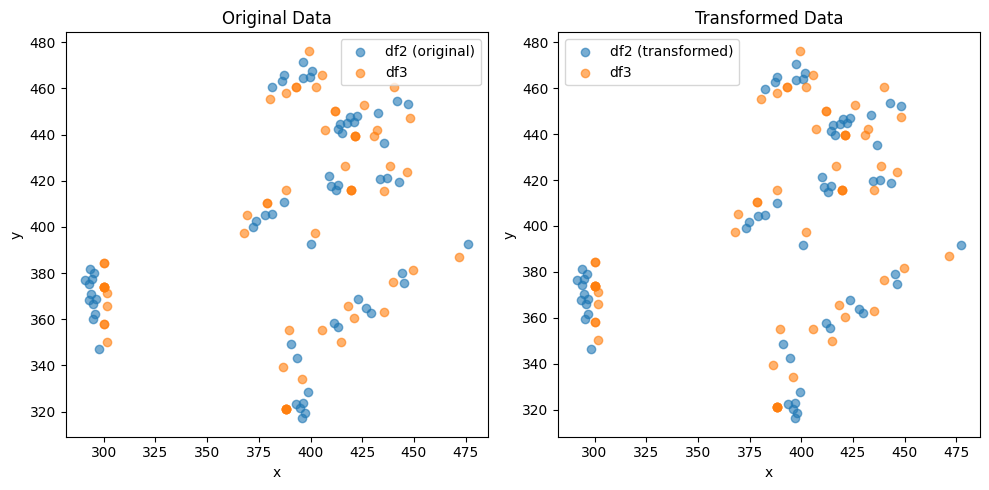

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (64,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.959001070946839e-06 , 9.555804504718793e-07 )
Rotation (radians): 0.0014387357449645668
Transform Matrix:
 [[ 9.99998965e-01 -1.43873525e-03 -2.95900107e-06]
 [ 1.43873525e-03  9.99998965e-01  9.55580450e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


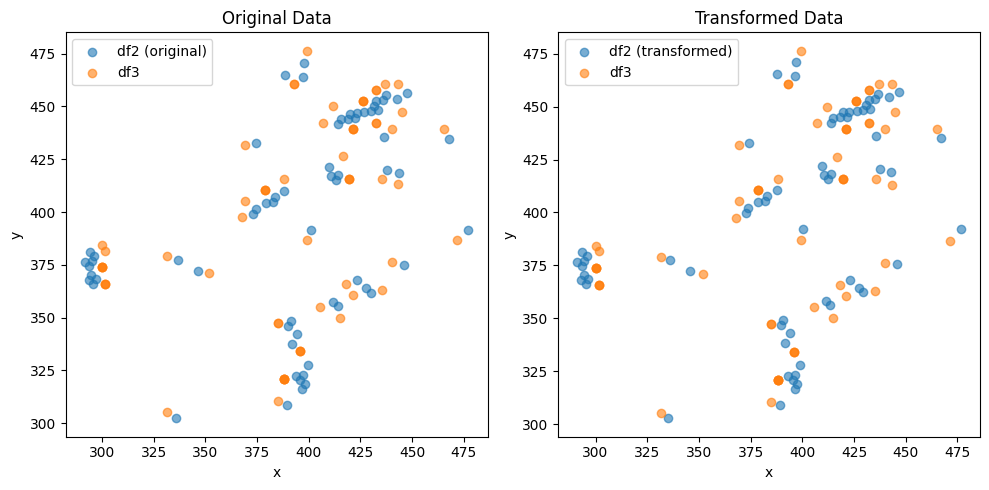

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (63,)
Optimal Translation and Rotation Parameters:
Translation: ( 1.9113199091055783e-06 , -4.812244281921175e-07 )
Rotation (radians): -0.001074700368013708
Transform Matrix:
 [[ 9.99999423e-01  1.07470016e-03  1.91131991e-06]
 [-1.07470016e-03  9.99999423e-01 -4.81224428e-07]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


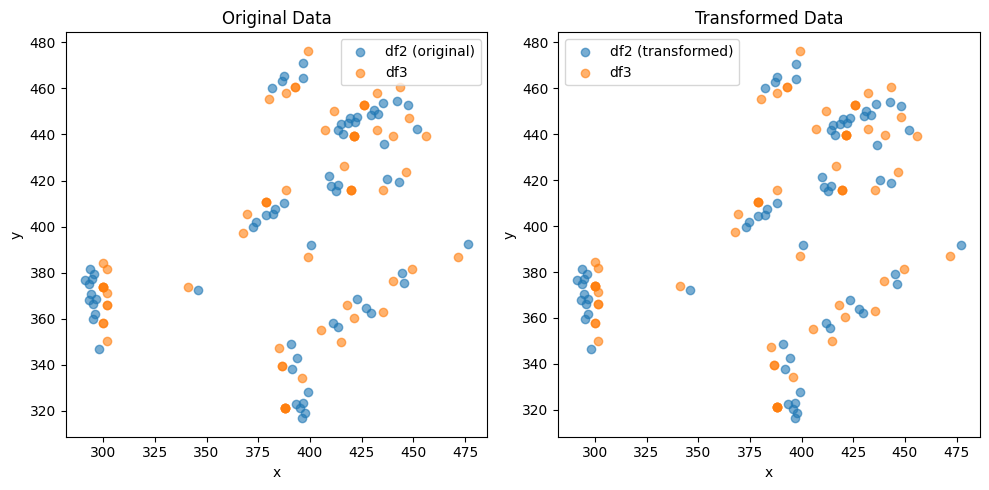

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\1740125892.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


min_row_indices (66,)
Optimal Translation and Rotation Parameters:
Translation: ( -2.410102146224114e-06 , 2.243841691027022e-06 )
Rotation (radians): 0.00188153476038725
Transform Matrix:
 [[ 9.99998230e-01 -1.88153365e-03 -2.41010215e-06]
 [ 1.88153365e-03  9.99998230e-01  2.24384169e-06]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]


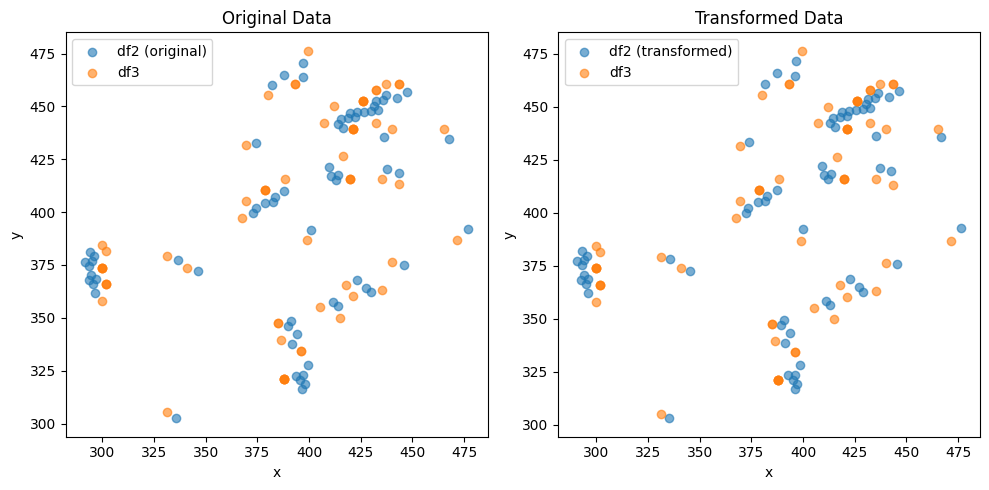

In [ ]:
dist_min = 5  # min euclidean distance
data2_spatial_results = perform_transformations(data2_spatial_results, data3_spatial_results, Y_c, Z_c, data2_leiden_str, data1_leiden_str)
print(data2_spatial_results)

In [ ]:
plt.figure(figsize=(5, 5))

plt.scatter(data2_spatial_results[0], data2_spatial_results[1], label='df2 (original)', alpha=0.6)
plt.scatter(data3_spatial_results[0], data3_spatial_results[1], label='df3', alpha=0.6)
plt.title('Original Data')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()



In [ ]:
Y_c = data2_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()


In [ ]:
same_values_mask = pairs['spatial_cluster'] == pairs['matabolic_cluster']

# 计算相同值的个数
same_values_count = same_values_mask.sum()
same_values_mask.sum()

In [110]:
pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\no_anchorpair_run2.csv", index=False)

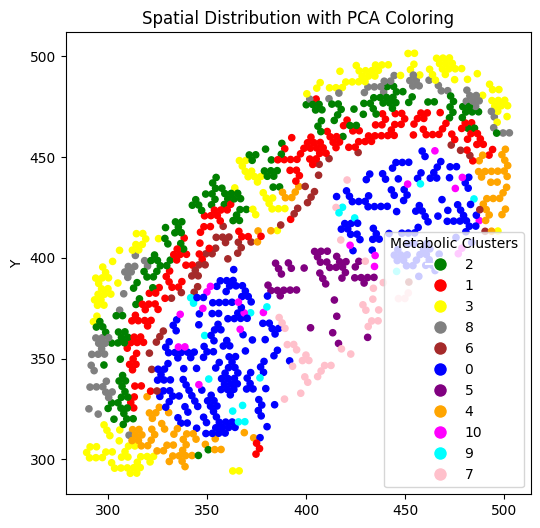

In [113]:
plt.figure(figsize=(6, 6))
plt.scatter(data2_spatial_results.iloc[:, 0],data2_spatial_results.iloc[:, 1], 
            c=[color_mapping[category] for category in pairs["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('Spatial Distribution with PCA Coloring')
unique_categories = pairs["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\no_anchor_merge_nearst_pair.pdf")
plt.show()


In [114]:
dist_min = 2 ## min euclidean distance
from scipy.spatial.distance import cdist
distances = cdist(data3_spatial_results, data2_spatial_results, metric='euclidean')
dist_df = pd.DataFrame(distances)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
row_indices, col_indices = np.where(distances <dist_min)
unique_row_indices = np.unique(row_indices)
unique_col_indices = np.unique(col_indices)
#############plot
####Z_C is metablic and is at 1
Y_C_=Y_c.iloc[col_indices,]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_=Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str[col_indices].astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_=Y_C_.drop(columns=['index'])
Y_C_=Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})

Z_C_=Z_c.iloc[row_indices,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[row_indices].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})

pairs = pd.concat([Y_C_,Z_C_],axis=1)
pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  
print(pairs.head())


def calculate_simpson_index(values):
    total_count = len(values)
    unique_values = set(values)
    simpson_index = 1 - sum((values.count(value) / total_count) ** 2 for value in unique_values)
    return simpson_index

def main(df):
    # 保存每个 X1 中值对应的 X2 中值的列表
    x1_x2_lists = df.groupby('spatial_ID')['matabolic_cluster'].apply(list).reset_index()

    # 计算每个 X1 中值的辛普森指数
    simpson_indices = x1_x2_lists['matabolic_cluster'].apply(calculate_simpson_index)

    # 保存每个 X1 中值对应的 X2 中出现频率最高的值
    max_x2_values = x1_x2_lists['matabolic_cluster'].apply(lambda x: max(set(x), key=x.count))

    # 生成新的 DataFrame
    new_df = pd.DataFrame({'spatial_ID': x1_x2_lists['spatial_ID'], 'Most_freq_metabolic_cluster': max_x2_values, 'Simpson_Index': simpson_indices})

    # 合并 X3 列
    new_df = pd.merge(new_df, df[['spatial_ID',"spatial_cluster"]].drop_duplicates(), on='spatial_ID', how='left')

    return new_df

# 示例输入数据
data = pairs
df = pd.DataFrame(data)

# 调用主函数
result_df = main(df)
result_df

   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0     460.550791     461.086122           1                1             -1   
1     314.841039     387.691349          66                2             -1   
2     362.303777     431.942343         411                3             -1   
3     428.877190     471.214024           5                2             -1   
4     418.611006     460.158303           7                2             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0       459.089801       460.498072             1                  1   
1       314.254368       386.943837             3                  2   
2       363.080049       431.645306             4                  2   
3       427.633753       471.063874             5                  2   
4       418.185020       460.544962             7                  2   

   matabolic.CCA.Z  distance  
0                1  1.574895  
1                1  0.950241  

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\237650377.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Y_C_['spatial_ID'] = Y_C_.index
C:\Users\28123\AppData\Local\Temp\ipykernel_14316\237650377.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index


,spatial_ID,Most_freq_metabolic_cluster,Simpson_Index,spatial_cluster
0,0,2,0.0,3
1,1,1,0.0,1
2,4,2,0.0,2
3,5,2,0.0,2
4,6,1,0.0,1
...,...,...,...,...
563,992,0,0.0,0
564,994,2,0.0,2
565,995,1,0.0,1
566,996,0,0.0,0


<bound method NDFrame.head of      spatial_ID  Most_freq_metabolic_cluster  Simpson_Index  spatial_cluster
0             0                            2            0.0                3
1             1                            1            0.0                1
2             4                            2            0.0                2
3             5                            2            0.0                2
4             6                            1            0.0                1
..          ...                          ...            ...              ...
563         992                            0            0.0                0
564         994                            2            0.0                2
565         995                            1            0.0                1
566         996                            0            0.0                0
567         999                            0            0.0                0

[568 rows x 4 columns]>
     spatial_ID  Most

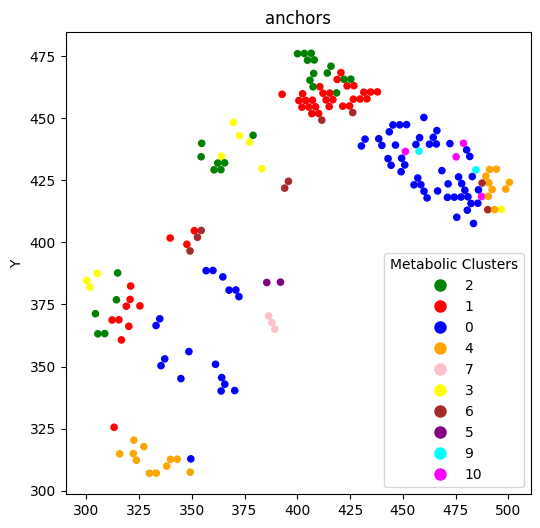

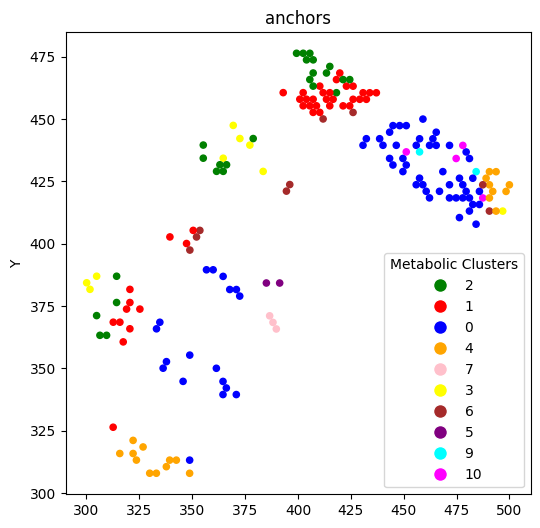

In [115]:
###### find transcript-metaboic pairs anchors by filtering: 
######1/simpson index less than 0.2 2/Most_freq_metabolic_cluster==matabolic_cluster
print(result_df.head)
#print(pairs.head)
merged_df = pd.merge(result_df, pairs, on='spatial_ID', how='inner')
merged_df = pd.DataFrame(merged_df)
print(merged_df)
merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) &(merged_df['distance'] < 1) ]
#merged_df = merged_df[(merged_df['Simpson_Index'] < 0.5) & (merged_df['Most_freq_metabolic_cluster'] == merged_df['matabolic_cluster'])&(merged_df['distance'] < 0.5) ]
merged_df = merged_df.drop_duplicates(subset="matabolic_ID")
print(merged_df["spatial_ID"])

plt.figure(figsize=(6, 6))
plt.scatter(data2_spatial_results.iloc[merged_df["spatial_ID"], 0],data2_spatial_results.iloc[merged_df["spatial_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_spatial.pdf")
plt.show()

plt.figure(figsize=(6, 6))
plt.scatter(data3_spatial_results.iloc[merged_df["matabolic_ID"], 0],data3_spatial_results.iloc[merged_df["matabolic_ID"], 1], 
            c=[color_mapping[category] for category in merged_df["matabolic_cluster"].tolist()], s=20, alpha=1)
plt.ylabel('Y')
plt.title('anchors')
unique_categories = merged_df["matabolic_cluster"].unique()
handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color_mapping[cat], markersize=10) for cat in unique_categories]
plt.legend(handles, unique_categories, title="Metabolic Clusters")
#plt.savefig("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\m3\\anchor_metabolic.pdf")
plt.show()


In [116]:
def convert_to_array(x):
    if isinstance(x, csr_matrix):
        return x.toarray()
    elif isinstance(x, np.ndarray):
        return x
    else:
        raise ValueError("Unsupported input type. Must be csr_matrix or ndarray.")
def tpm_normalize(counts_matrix):
    # 计算每个细胞的总表达量
    total_counts_per_cell = counts_matrix.sum(axis=1)
    # 计算每个基因的 TPM
    tpm_matrix = (counts_matrix.div(total_counts_per_cell, axis=0)) * 1e4
    return tpm_matrix
scaler = MinMaxScaler(feature_range=(-1, 1))
DF1 = convert_to_array(adata2.X)
DF1 = pd.DataFrame(DF1)
DF1 = tpm_normalize(DF1)
DF1 = np.log2(DF1 + 1)
#DF1 = scaler.fit_transform(DF1)
DF1 = pd.DataFrame(DF1)

DF2 = convert_to_array(adata1.X)
DF2 = pd.DataFrame(DF2)
DF2 = tpm_normalize(DF2)
#DF2 = scaler.fit_transform(DF2)
DF2 = np.log2(DF2+1)
DF2 = pd.DataFrame(DF2)

print(DF1.shape,DF2.shape)
spatial_ID_list = merged_df['spatial_ID'].tolist()
metabolic_ID_list = merged_df['matabolic_ID'].tolist()

# 从 DF1 和 DF2 中提取对应的样本
spatial_samples = DF1.loc[spatial_ID_list,:]
index_strings = adata2.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(spatial_samples.columns, index_strings)}
spatial_samples.rename(columns=column_mapping, inplace=True)
rowindex = spatial_samples.shape[0]
spatial_samples.index = range(rowindex)

metabolic_samples = DF2.loc[metabolic_ID_list,:]
rowindex = metabolic_samples.shape[0]
index_strings = adata1.var.index.astype(str)
column_mapping = {old_name: new_name for old_name, new_name in zip(metabolic_samples.columns, index_strings)}
metabolic_samples.rename(columns=column_mapping, inplace=True)
metabolic_samples.index = range(rowindex)

print(spatial_samples.shape,metabolic_samples.shape,pd.concat([spatial_samples, metabolic_samples], axis=0).shape)
# 计算特征之间的相关性

(1000, 2500) (1000, 2499)
(178, 2500) (178, 2499) (356, 4999)


(178, 4999)


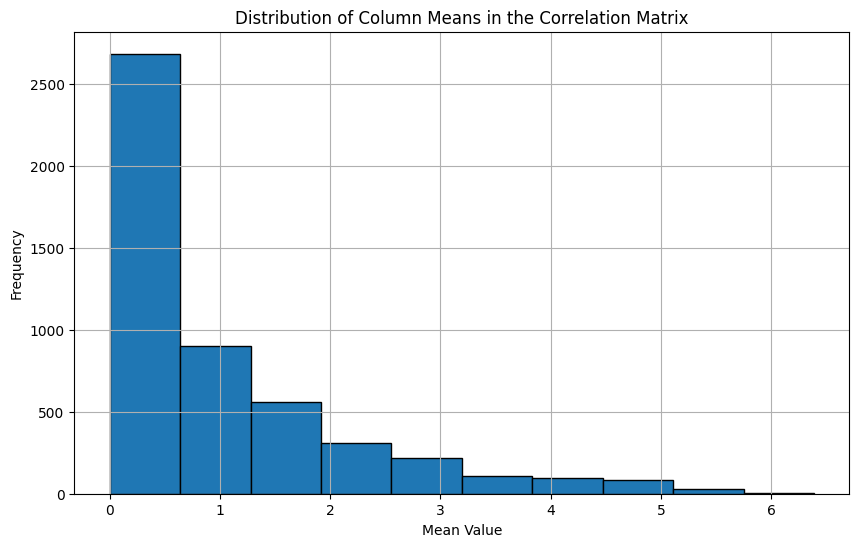

DF1 列变量与 DF2 列变量之间的相关性矩阵：


In [117]:
correlation_matrix = pd.concat([spatial_samples, metabolic_samples], axis=1)
print(correlation_matrix.shape)
column_means = correlation_matrix.mean(axis=0)
plt.figure(figsize=(10, 6))
plt.hist(column_means, bins=10, edgecolor='black')
plt.title('Distribution of Column Means in the Correlation Matrix')
plt.xlabel('Mean Value')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()
correlation_matrix = correlation_matrix.corr()
# 显示相关性矩阵
print("DF1 列变量与 DF2 列变量之间的相关性矩阵：")

# 显示 DF3
#print(DF3)

(2500, 2499)


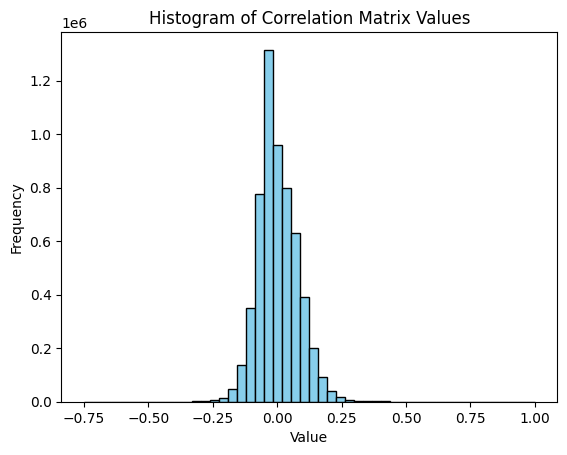

In [118]:
correlation_matrix2 = correlation_matrix.iloc[:2500, -2499:]
print(correlation_matrix2.shape)

values = correlation_matrix2.values.flatten()
plt.hist(values, bins=50, color='skyblue', edgecolor='black')
plt.title('Histogram of Correlation Matrix Values')
plt.xlabel('Value')
plt.ylabel('Frequency')

# 显示图形
plt.show()
high_correlation_spatial = []
high_correlation_metabolic = []



In [132]:
import pandas as pd
import numpy as np

# Example correlation matrix with NaN values
correlation_matrix2[correlation_matrix2 > 0.95] = np.nan
# Flatten the correlation matrix and keep track of the row and column indices, excluding NaNs
flattened = correlation_matrix2.values.flatten()
non_nan_indices = ~np.isnan(flattened)
flattened_non_nan = flattened[non_nan_indices]
original_indices = np.dstack(np.unravel_index(np.where(non_nan_indices)[0], correlation_matrix2.shape))[0]

# Sort the non-NaN flattened array to find the top 20 highest values
sorted_indices = np.argsort(flattened_non_nan)[::-1]
top_n = 100
top_indices = original_indices[sorted_indices[:top_n]]

# Retrieve the corresponding row and column indices
top_rows = top_indices[:, 0]
top_cols = top_indices[:, 1]

# Get the top 20 highest values
top_values = flattened_non_nan[sorted_indices[:top_n]]

# Convert to lists if needed
top_rows = list(top_rows)
top_cols = list(top_cols)
top_values = list(top_values)

# Display results
print("Top 20 highest correlation values (excluding NaNs):")
for i in range(len(top_values)):
    print(f"Value: {top_values[i]}, Row: {top_rows[i]}, Column: {top_cols[i]}")

# Optionally, convert to a DataFrame for easier viewing
top_correlations_df = pd.DataFrame({
    'Value': top_values,
    'Row': top_rows,
    'Column': top_cols
})

print("\nTop 20 highest correlation values in DataFrame format:")
print(top_correlations_df)

unique_top_correlations_df = top_correlations_df.drop_duplicates(subset=['Column'])
unique_top_correlations_df = unique_top_correlations_df.drop_duplicates(subset=['Row'])
# 转换为列表（如果需要）
unique_top_rows = list(unique_top_correlations_df['Row'])
unique_top_cols = list(unique_top_correlations_df['Column'])
unique_top_values = list(unique_top_correlations_df['Value'])

print("\nTop correlation values in DataFrame format (unique pairs):")
print(unique_top_correlations_df)


Top 20 highest correlation values (excluding NaNs):
Value: 0.8638961198862326, Row: 1691, Column: 247
Value: 0.8547424833843468, Row: 453, Column: 1559
Value: 0.8539942073475418, Row: 1948, Column: 1794
Value: 0.8479155891656626, Row: 1048, Column: 2198
Value: 0.835427168380426, Row: 65, Column: 1702
Value: 0.8309702246478426, Row: 65, Column: 2389
Value: 0.8237639409604819, Row: 2473, Column: 1370
Value: 0.8237639409604819, Row: 2341, Column: 1370
Value: 0.8190586606040523, Row: 65, Column: 846
Value: 0.798826768229536, Row: 316, Column: 1515
Value: 0.798530128687615, Row: 65, Column: 2381
Value: 0.797006047733622, Row: 2151, Column: 1978
Value: 0.796735034782135, Row: 1463, Column: 2279
Value: 0.794120860642848, Row: 1925, Column: 2385
Value: 0.7928781636325356, Row: 636, Column: 597
Value: 0.7928781636325356, Row: 1636, Column: 597
Value: 0.7918803544876966, Row: 65, Column: 1023
Value: 0.7848619087668655, Row: 2151, Column: 2285
Value: 0.78167853146514, Row: 1168, Column: 1910
Valu

(2, 178) (2, 178) (102, 178) (102, 178)
[4, 6, 7, 12, 13, 16, 27, 34, 38, 41, 42, 46, 52, 56, 58, 59, 65, 66, 78, 85, 90, 96, 98, 100, 102, 109, 110, 122, 127, 132, 135, 136, 143, 148, 152, 156, 158, 164, 173, 180, 181, 186, 191, 198, 205, 210, 230, 233, 256, 262, 267, 270, 273, 285, 288, 302, 307, 309, 314, 321, 326, 327, 328, 329, 339, 353, 360, 370, 376, 377, 379, 381, 382, 387, 390, 392, 402, 405, 411, 415, 418, 421, 427, 430, 431, 432, 437, 444, 448, 452, 453, 459, 460, 470, 473, 476, 480, 489, 494, 500, 511, 513, 514, 520, 524, 525, 543, 555, 565, 573, 581, 589, 590, 591, 604, 606, 614, 615, 621, 626, 630, 657, 658, 670, 677, 679, 680, 681, 686, 688, 690, 700, 714, 731, 732, 736, 738, 741, 745, 752, 765, 767, 773, 776, 782, 789, 792, 793, 794, 800, 807, 822, 834, 857, 863, 866, 872, 874, 885, 891, 897, 906, 907, 920, 925, 934, 936, 940, 947, 950, 964, 969, 971, 978, 979, 983, 992, 994]
[187, 573, 7, 12, 13, 16, 27, 22, 38, 385, 42, 46, 76, 295, 86, 39, 105, 3, 78, 85, 97, 96, 98,

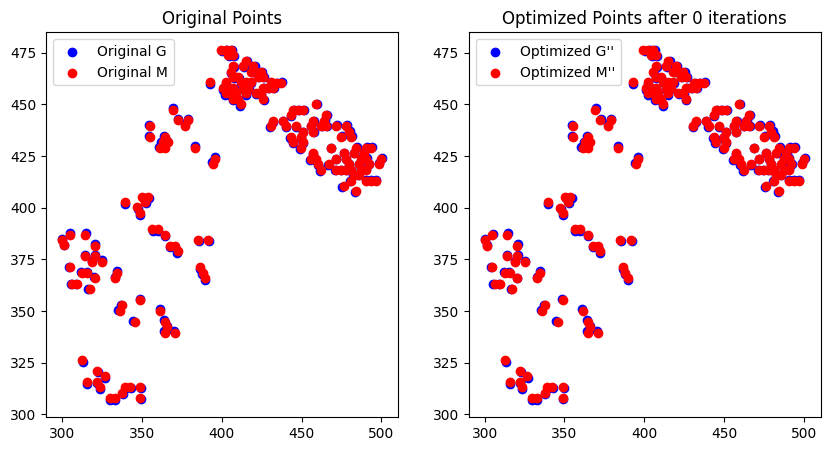

Iteration 0: Euclidean distance between G and M: 9.277600692262782


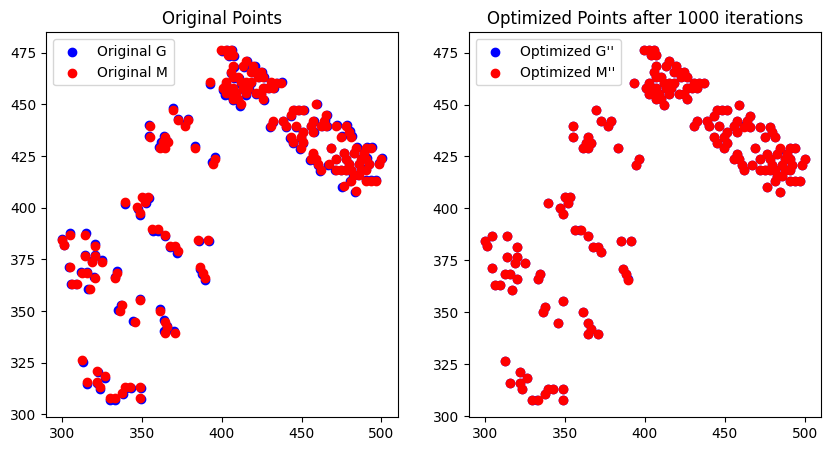

Iteration 1000: Euclidean distance between G and M: 0.18778644868067118


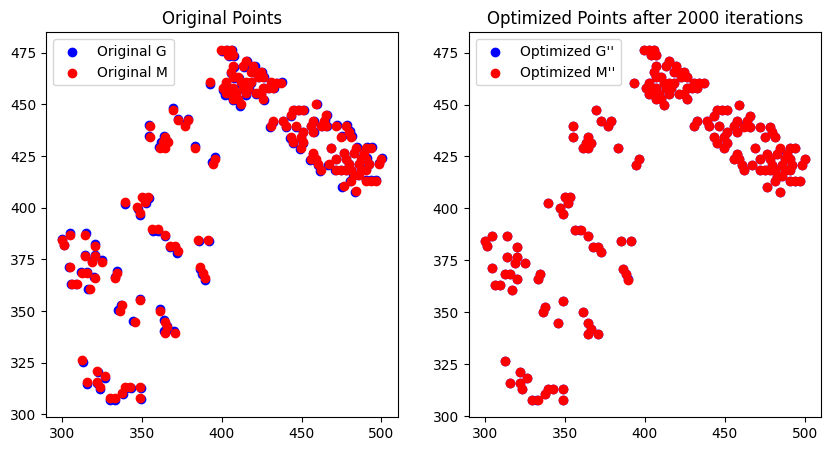

Iteration 2000: Euclidean distance between G and M: 0.18836620379150487


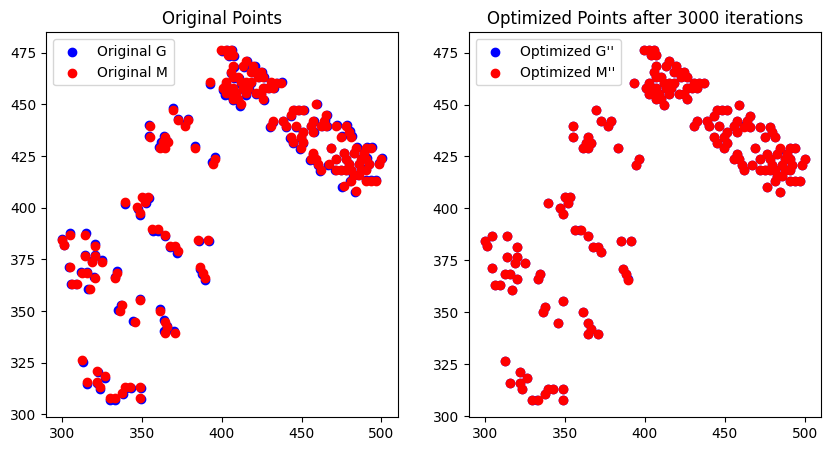

Iteration 3000: Euclidean distance between G and M: 0.18909915417164372


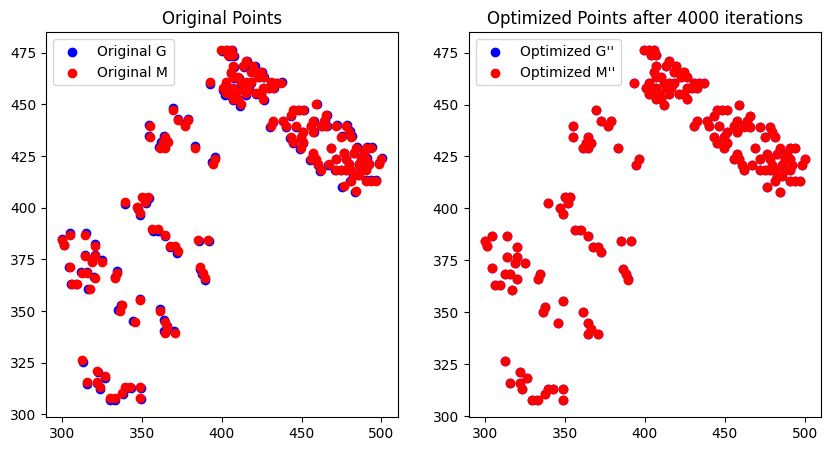

Iteration 4000: Euclidean distance between G and M: 0.18971375587013425


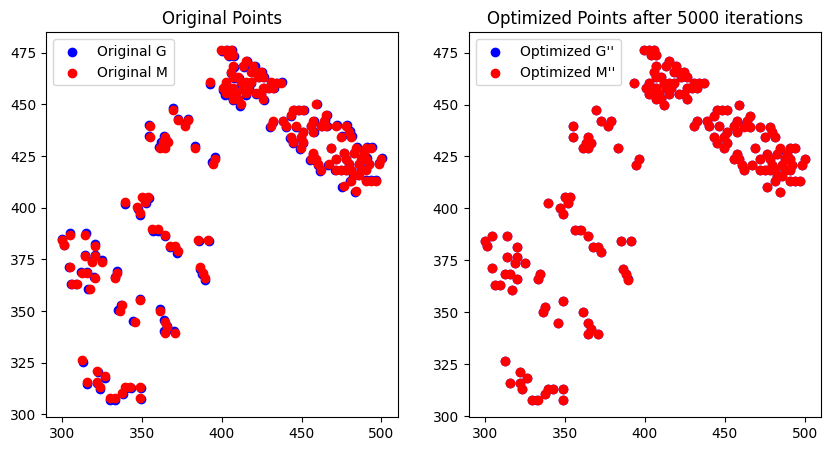

Iteration 5000: Euclidean distance between G and M: 0.19017908299752384


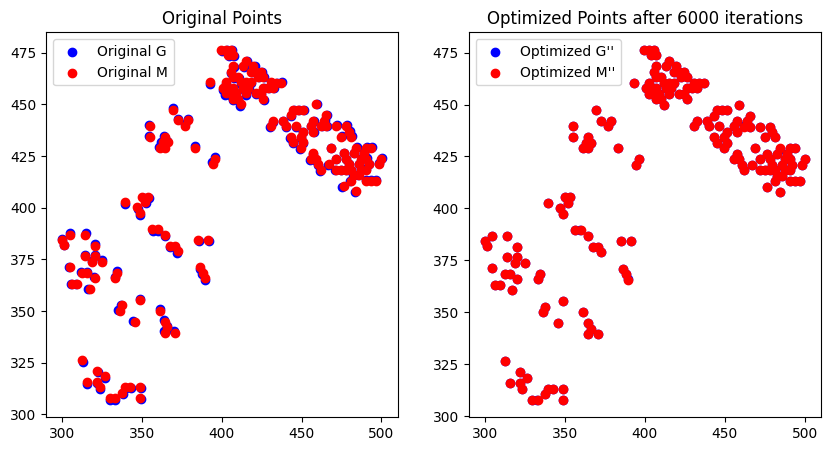

Iteration 6000: Euclidean distance between G and M: 0.19052022254233864


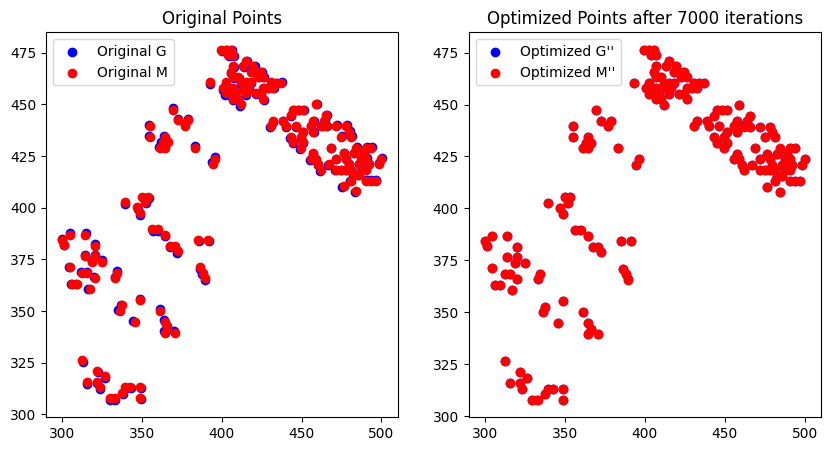

Iteration 7000: Euclidean distance between G and M: 0.19076669366596147


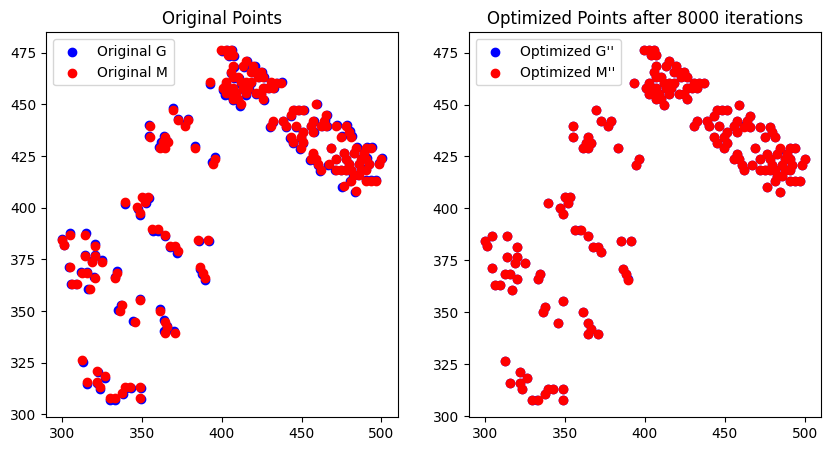

Iteration 8000: Euclidean distance between G and M: 0.19094316367980257


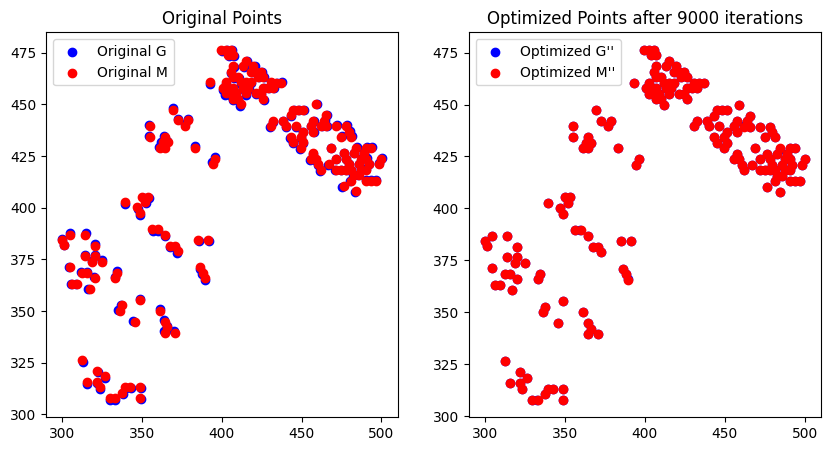

Iteration 9000: Euclidean distance between G and M: 0.19106809785188436
: Euclidean distance between G' and M': 0.19106809785188436
优化后的 f_G:
[[-9.83984867e-01  7.20603051e-03  2.09672845e-03  1.78901654e-03
   5.25474606e-03  2.28255772e-03 -3.34488709e-02  2.00972117e-03
   1.75725708e-01  1.08235039e-01  3.23583927e-02  2.15425479e-02
   5.21145352e-03 -3.60933176e-01  3.02726886e-03 -1.25013285e-01
   2.07067283e-02 -2.65390284e-03  3.49833082e-02  1.09956626e-02
  -6.79259770e-02 -8.31721220e-02 -2.45880361e-03  4.88625130e-03
   1.88490270e-02  2.04500619e-02 -6.75745856e-02  9.07589141e-03
  -1.80518171e-01 -4.81323595e-02 -2.55911331e-03 -1.85792457e-02
   4.13552822e-03  2.24490427e-02  7.86467768e-03 -2.37302142e-02
   2.13901303e-03  2.48505431e-02 -3.10388066e-02 -4.47125653e-02
   4.63430588e-02 -1.62836988e-02 -1.84167156e-02  7.94520232e-04
  -6.01949547e-02  6.62271544e-02  4.75888079e-02 -9.81456395e-02
   5.37961504e-02 -9.31421222e-02 -9.36378259e-02  1.04441888e-01


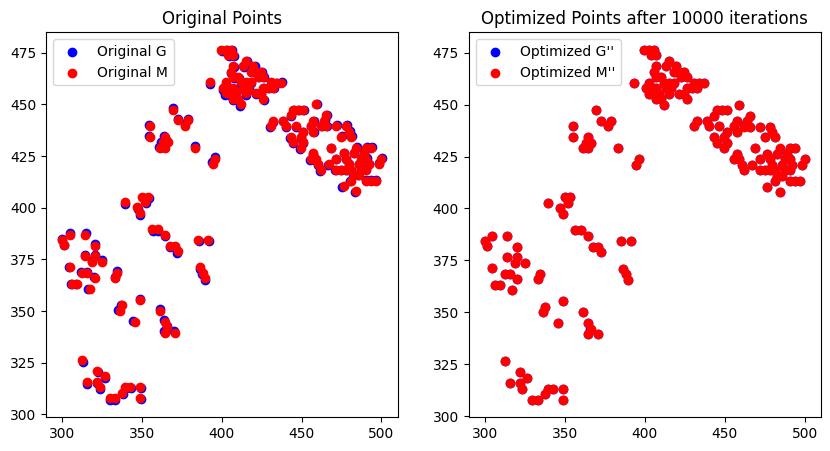

In [133]:
import numpy as np
import matplotlib.pyplot as plt
scaler = MinMaxScaler(feature_range=(-1, 1))
metabolic_select_high_corr_variant = convert_to_array(adata1.X)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = scaler.fit_transform(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = pd.DataFrame(metabolic_select_high_corr_variant)
metabolic_select_high_corr_variant = metabolic_select_high_corr_variant.iloc[:,top_cols]
metabolic_select_high_corr_variant = pd.concat([data3_spatial_results, metabolic_select_high_corr_variant], axis=1)

spatial_select_high_corr_variant = convert_to_array(adata2.X)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = scaler.fit_transform(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = pd.DataFrame(spatial_select_high_corr_variant)
spatial_select_high_corr_variant = spatial_select_high_corr_variant.iloc[:,top_rows]
spatial_select_high_corr_variant = pd.concat([data2_spatial_results, spatial_select_high_corr_variant], axis=1)


# 假设G和M是已知的2xM矩阵
G = data2_spatial_results.T.iloc[:,spatial_ID_list].to_numpy()  # 示例数据
M = data3_spatial_results.T.iloc[:,metabolic_ID_list].to_numpy() # 示例数据

# 假设G'和M'是已知的nxM矩阵
G_prime = spatial_select_high_corr_variant.T.iloc[:,spatial_ID_list].to_numpy()  # 示例数据
M_prime = metabolic_select_high_corr_variant.T.iloc[:,metabolic_ID_list].to_numpy()  # 示例数据
print(G.shape, M.shape, G_prime.shape,M_prime.shape)
print(spatial_ID_list)
print(metabolic_ID_list)
# 初始化f_G和f_M为零矩阵
# 初始化f_G和f_M为零矩阵
f_G = np.zeros((G.shape[0], G_prime.shape[0]))
f_M = np.zeros((M.shape[0], M_prime.shape[0]))

# 定义学习率和迭代次数
alpha = 0.1
iterations = 10000
clip_value = 0.1  # 梯度裁剪阈值

# 目标函数的梯度计算
def compute_gradients(G, M, G_prime, M_prime, f_G):
    G_double_prime = G + f_G.dot(G_prime-M_prime)
    M_double_prime = M
    diff = G_double_prime - M_double_prime
    d_G = 2 * diff.dot(G_prime.T-M_prime.T)
    return d_G

def euclidean_distance(G, M):
    squared_diff = np.square(G - M)
    sum_squared_diff = np.sum(squared_diff)
    distance = np.sqrt(sum_squared_diff)
    return distance

# 可视化函数
def plot_matrices(G, M, G_double_prime, M_double_prime, iteration):
    plt.figure(figsize=(10, 5))

    # 原始点和优化后的点
    plt.subplot(1, 2, 1)
    plt.scatter(G[0, :], G[1, :], color='blue', label='Original G')
    plt.scatter(M[0, :], M[1, :], color='red', label='Original M')
    plt.title('Original Points')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.scatter(G_double_prime[0, :], G_double_prime[1, :], color='blue', label='Optimized G\'\'')
    plt.scatter(M_double_prime[0, :], M_double_prime[1, :], color='red', label='Optimized M\'\'')
    plt.title(f'Optimized Points after {iteration} iterations')
    plt.legend()

    plt.show()


# 迭代优化
for i in range(iterations):
    d_G = compute_gradients(G, M, G_prime, M_prime, f_G)
    
    # 梯度裁剪
    d_G = np.clip(d_G, -clip_value, clip_value)
    
    f_G -= alpha * d_G

    # 每100次迭代进行一次可视化
    if i % 1000 == 0:
        G_double_prime = G + f_G.dot(G_prime-M_prime)
        M_double_prime = M 
        plot_matrices(G, M, G_double_prime, M_double_prime, i)
        distance = euclidean_distance(G_double_prime, M_double_prime)
        print(f"Iteration {i}: Euclidean distance between G and M:", distance)

print(f": Euclidean distance between G' and M':", euclidean_distance(G_double_prime, M_double_prime))
# 优化后的f_G和f_M
print("优化后的 f_G:")
print(f_G)
print("优化后的 f_M:")
print(M)

# 计算最终的 G'' 和 M''
G_double_prime = G + f_G.dot(G_prime-M_prime)
M_double_prime = M 

print("最终的 G'':")
print(G_double_prime)
print("最终的 M'':")
print(G)

# 最终结果可视化
plot_matrices(G, M, G_double_prime, M_double_prime, iterations)




In [135]:
#using SVD to solve
#f_G.dot(G_prime-M_prime)=F_G.dot(G_prime). 

left_hand_side = np.dot(f_G, G_prime - M_prime)

# Perform SVD on G_prime
U, s, Vt = np.linalg.svd(G_prime, full_matrices=False)

# Calculate the pseudoinverse of G_prime using SVD components
S_inv = np.diag(1 / s)
G_prime_pinv = np.dot(Vt.T, np.dot(S_inv, U.T))

# Calculate F_G using the pseudoinverse of G_prime
F_G = np.dot(left_hand_side, G_prime_pinv)
F_G

array([[ 4.18149907e-04, -2.86978215e-03, -2.37897339e-01,
         4.16462527e-01,  2.33048760e-01, -2.58698364e-01,
        -1.69603227e+11,  2.18922970e+11,  1.99264359e+11,
        -1.16136412e+11,  1.89847907e+11, -2.96421483e-01,
        -9.99086947e+11, -2.66869271e+11, -3.85981797e+10,
        -3.07273112e+11, -5.76326925e+11,  6.68491083e+11,
         4.77070004e+11, -2.63284270e+11,  4.23731821e+11,
        -1.02376262e+11,  9.04140691e-02, -1.84116431e-01,
        -6.88449015e+11,  1.30620600e+11,  9.65407931e+10,
        -5.66026610e+08, -1.29716771e-01,  4.95599471e-01,
         2.82849292e+11,  5.30153541e+11, -3.71086893e-02,
        -4.40233976e-01, -1.66615832e+11,  5.32923362e-01,
         5.66026610e+08, -3.10508908e+11,  3.70204529e+11,
        -2.75792463e+11,  2.40292116e+11, -2.03376043e+11,
         2.03376043e+11, -5.63695734e+11, -7.10568674e+11,
         6.69661794e+11, -2.66698255e+11, -2.90346570e+11,
         4.51960887e+11, -3.49208028e-01, -8.09283698e+1

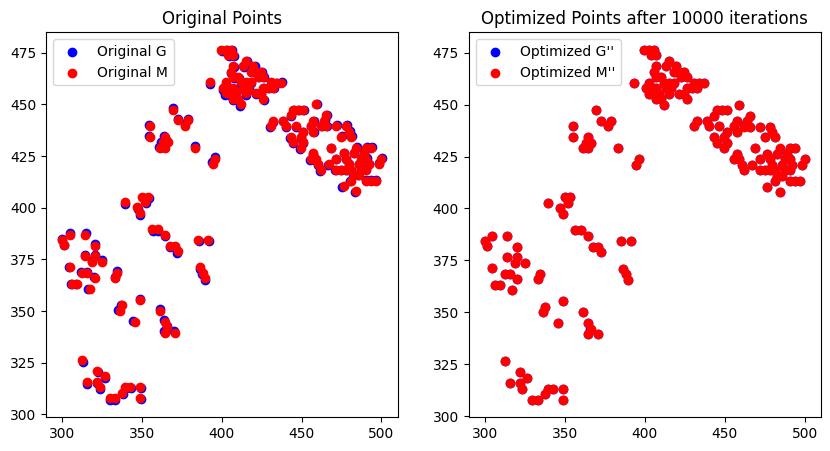

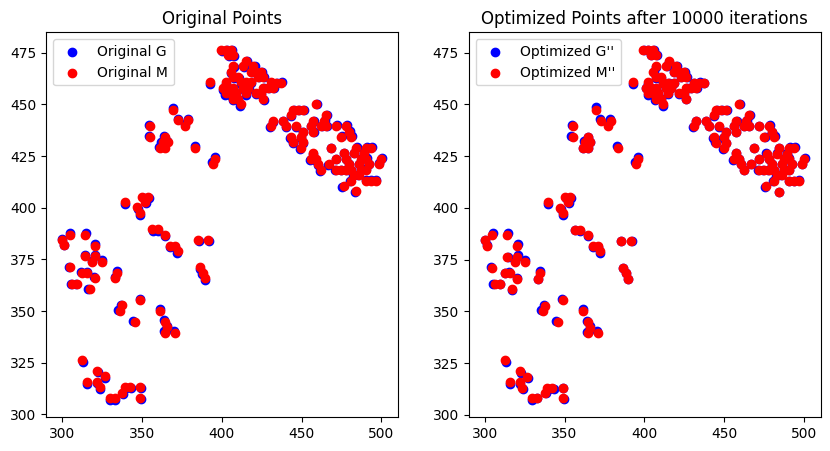

In [136]:
G_double_prime = G + f_G.dot(G_prime-M_prime)
M_double_prime = M 

# 最终结果可视化
plot_matrices(G, M, G_double_prime, M_double_prime, iterations)


G_double_prime = G + F_G.dot(G_prime)
M_double_prime = M 
plot_matrices(G, M, G_double_prime, M_double_prime, iterations)


In [137]:
X_c=pd.DataFrame(data1_spatial_results)
Y_c=pd.DataFrame(data2_spatial_results)
Z_c=pd.DataFrame(data3_spatial_results)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
print(min_row_indices[1:10])

(1000, 1000)
(1000, 2) (1000, 2)
1      1
2    973
3    935
4    187
5      5
6    573
7      7
8    790
9      9
dtype: int64


In [140]:
G_prime = spatial_select_high_corr_variant.T.to_numpy()  # 示例数据
M_prime = metabolic_select_high_corr_variant.T.to_numpy()  # 示例数据
G = data2_spatial_results + f_G.dot(G_prime-M_prime[:,min_row_indices]).T
#G = data2_spatial_results + F_G.dot(G_prime).T

ValueError: operands could not be broadcast together with shapes (2,) (2,1000) 

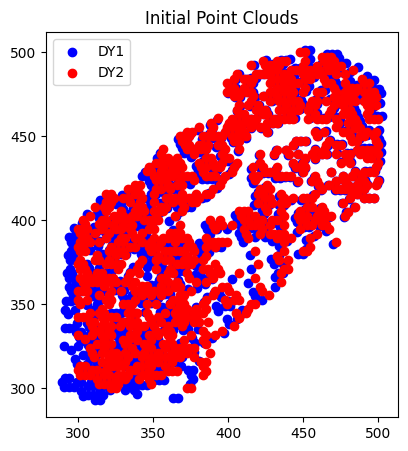

In [150]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler

# Example data (replace with your actual data)
DY1 = data2_spatial_results.T.values  # 2D point cloud DY1
DY2 = data3_spatial_results.T.values  # 2D point cloud DY2
DYGW1 = spatial_select_high_corr_variant.T.to_numpy()  # High-dimensional features for DY1
DYGW2 = metabolic_select_high_corr_variant.T.to_numpy()  # High-dimensional features for DY2

# Standardize the features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DYGW1 = scaler1.fit_transform(DYGW1.T).T
DYGW2 = scaler2.fit_transform(DYGW2.T).T

# Perform CCA
cca = CCA(n_components=2)
DYGW1_c, DYGW2_c = cca.fit_transform(DYGW1.T, DYGW2.T)
DYGW1_c = DYGW1_c.T
DYGW2_c = DYGW2_c.T

# Initial transformation estimate
transformation = np.eye(2)  # Initial transformation matrix is a 2x2 identity matrix

# Set iteration parameters
max_iterations = 500
tolerance = 1e-5

# Plot initial point clouds
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]
    corresponding_target_features = DYGW2_c[:, indices]
    
    # Step 2: Optimize transformation using spatial and feature distances
    # Combine spatial and feature distances
    spatial_distances = distances
    feature_distances = np.linalg.norm(DYGW1_c - corresponding_target_features, axis=0)
    combined_distances = spatial_distances + feature_distances  # Can be weighted if needed
    
    # Select matches based on combined distances for each point
    best_matches = np.argmin(combined_distances, axis=0)
    best_target_points = DY2[:, best_matches]

    # Compute transformation (simple averaging for illustration, replace with actual method)
    transformation = np.mean(best_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# Plot final point clouds
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)


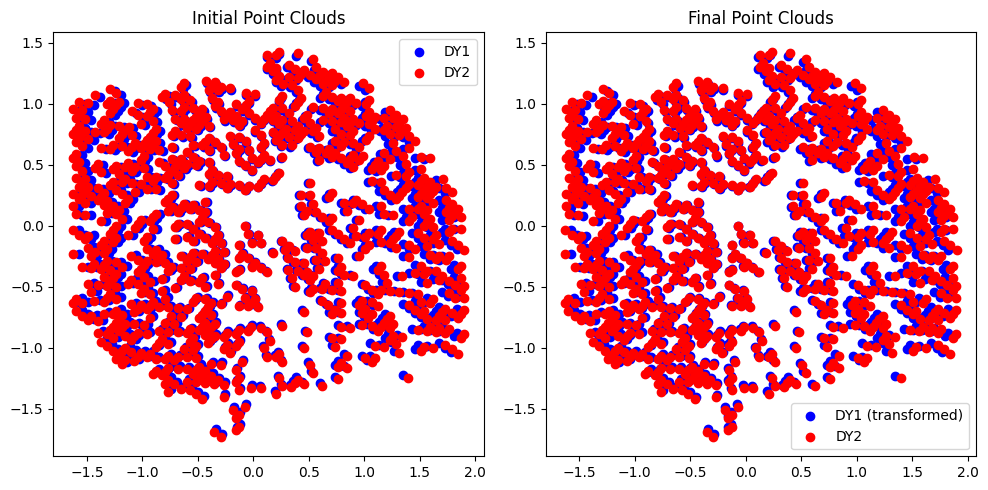

Final transformation matrix:
[[-1.44328993e-17]
 [ 4.57966998e-19]]


In [170]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

#DY1 = data2_spatial_results.T.values  # Example DY1 point cloud (2D points
#DY1 = data2_spatial_results.T.values
#DY2 = data3_spatial_results.T.values # Example DY2 point cloud (2D points)
DY1 = spatial_select_high_corr_variant.T.to_numpy()  # Example DYGW1 features
DY2 = metabolic_select_high_corr_variant.T.to_numpy()  # Example DYGW2 features
scaler1 = StandardScaler()
scaler2 = StandardScaler()
DY1 = scaler1.fit_transform(DY1.T).T
DY2 = scaler2.fit_transform(DY2.T).T

# Perform CCA
cca = CCA(n_components=2)
DY1_c, DY2_c = cca.fit_transform(DY1.T, DY2.T)
DY1 = DY1_c.T
DY2 = DY2_c.T
# 初始变换估计
transformation = np.eye(2)  # 初始变换矩阵为2x2的单位矩阵

# 设定迭代次数和收敛阈值
max_iterations = 500
tolerance = 1e-5

# 创建一个新的图形窗口
plt.figure(figsize=(10, 5))

# 绘制初始的DY1和DY2点云
plt.subplot(1, 2, 1)
plt.title('Initial Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

iteration = 0
converged = False

while not converged and iteration < max_iterations:
    # Step 1: Find correspondences based on spatial proximity
    tree = cKDTree(DY2.T)
    distances, indices = tree.query(DY1.T)
    
    corresponding_target_points = DY2[:, indices]

    # Step 2: Optimize transformation using spatial and feature distances
    # Example: simple averaging transformation for illustration
    transformation = np.mean(corresponding_target_points - DY1, axis=1, keepdims=True)

    # Step 3: Apply transformation to DY1
    DY1_transformed = DY1 + transformation

    # Step 4: Update DY1 for the next iteration
    DY1 = DY1_transformed

    # Step 5: Check convergence
    if np.linalg.norm(transformation) < tolerance:
        converged = True

    iteration += 1

# 绘制最终的DY1和DY2点云
plt.subplot(1, 2, 2)
plt.title('Final Point Clouds')
plt.scatter(DY1[0], DY1[1], color='blue', label='DY1 (transformed)')
plt.scatter(DY2[0], DY2[1], color='red', label='DY2')
plt.legend()

plt.tight_layout()
plt.show()

print("Final transformation matrix:")
print(transformation)

In [174]:
DY2

array([[-0.95771197,  1.17953264, -1.56870325, ..., -1.32100151,
        -1.3475578 ,  0.70723938],
       [ 0.99808601,  0.29323649,  0.91693146, ..., -0.98366122,
         0.17337948,  0.06778362]])

C:\Users\28123\AppData\Local\Temp\ipykernel_14316\3576074931.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Z_C_['matabolic_ID'] = Z_C_.index
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(1000, 2) (1000, 2)
(1000, 1000)
(1000, 2) (1000, 2)
(1000, 2) (1000, 2)
   spatial.CCA.X  spatial.CCA.Y  spatial_ID  spatial_cluster  spatial.CCA.Z  \
0      -0.930258       0.981662           0                3             -1   
1       1.132012       0.287579           1                1             -1   
2      -1.520171       0.901650           2                3             -1   
3      -1.332936       0.627158           3                2             -1   
4      -0.502065       0.880500           4                2             -1   

   metabolic.CCA.X  metabolic.CCA.Y  matabolic_ID  matabolic_cluster  \
0        -0.957712         0.998086             0                  3   
1         1.179533         0.293236             1                  1   
2        -1.513305         0.879507           375                  3   
3        -1.291508         0.629999           447                  2   
4        -0.513610         0.895680             4                  2   

   matabolic.CCA.Z 

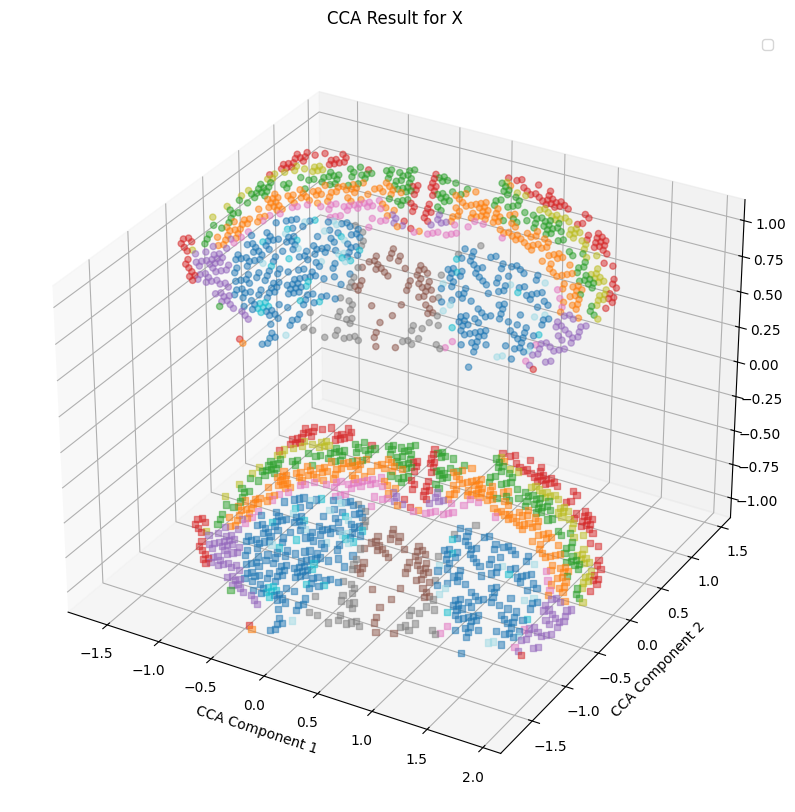

In [176]:
#Y_c = pd.DataFrame(B_prime)
Y_c = pd.DataFrame(DY1).T
Z_c = pd.DataFrame(DY2).T
#Y_c = pd.DataFrame(G)
#Z_c = data3_spatial_results
print(Z_c.shape, Y_c.shape)
from scipy.spatial.distance import cdist
distances = cdist(Z_c, Y_c, metric='euclidean')
dist_df = pd.DataFrame(distances)
print(dist_df.shape)
min_row_indices_ = dist_df.idxmin()
print(Z_c.shape, Y_c.shape)
###############找出Y_C(spatial)周围dist_min以内的Z_C(metabolic)点
Y_C_ = Y_c.iloc[:,:]
Y_C_['spatial_ID'] = Y_C_.index
Y_C_ = Y_C_.reset_index()
Y_C_["spatial_cluster"] = data2_leiden_str.astype(int)
Y_C_["spatial.CCA.Z"] = -1
Y_C_ = Y_C_.drop(columns=['index'])
Y_C_ = Y_C_.rename(columns={0: "spatial.CCA.X", 1:"spatial.CCA.Y"})
print(Z_c.shape, Y_c.shape)
Z_C_=Z_c.iloc[min_row_indices_,]
Z_C_['matabolic_ID'] = Z_C_.index
Z_C_=Z_C_.reset_index()
Z_C_["matabolic_cluster"] = data1_leiden_str[min_row_indices_].astype(int)
Z_C_=Z_C_.drop(columns=['index'])
Z_C_["matabolic.CCA.Z"] = 1
Z_C_=Z_C_.rename(columns={0: "metabolic.CCA.X", 1:"metabolic.CCA.Y"})
pairs = pd.concat([Y_C_,Z_C_],axis=1)
#pairs["distance"] = dist_df.iloc[row_indices,col_indices].values.diagonal()  //diagonal要求内存过大
print(pairs.head())

fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
plt.scatter(Z_c.iloc[:, 0], Z_c.iloc[:, 1],zs=1, c=data1_leiden_str[:].astype(int), cmap='tab20', s=20, alpha=0.5)
plt.scatter(Y_c.iloc[:, 0], Y_c.iloc[:, 1],zs=-1, c=data2_leiden_str.astype(int), cmap='tab20', s=20, alpha=0.5,marker='s')
#for i in range(0,pairs.shape[0]):
#    plt.plot(pairs.iloc[i,[0,5]], pairs.iloc[i,[1,6]], pairs.iloc[i,[4,9]], 'gray', linewidth=0.2)
plt.xlabel('CCA Component 1')
plt.ylabel('CCA Component 2')
plt.title('CCA Result for X')
plt.legend()
plt.show()

In [177]:

same_values_mask = pairs['spatial_cluster'] == pairs['matabolic_cluster']
# 计算相同值的个数
same_values_count = same_values_mask.sum()
same_values_mask.sum()

910

In [1574]:
pairs.to_csv("I:\\mutiomics\\Spatial Multimodal Analysis of Transcriptomes and Metabolomes in Tissues\\benchmark\\run2.csv", index=False)

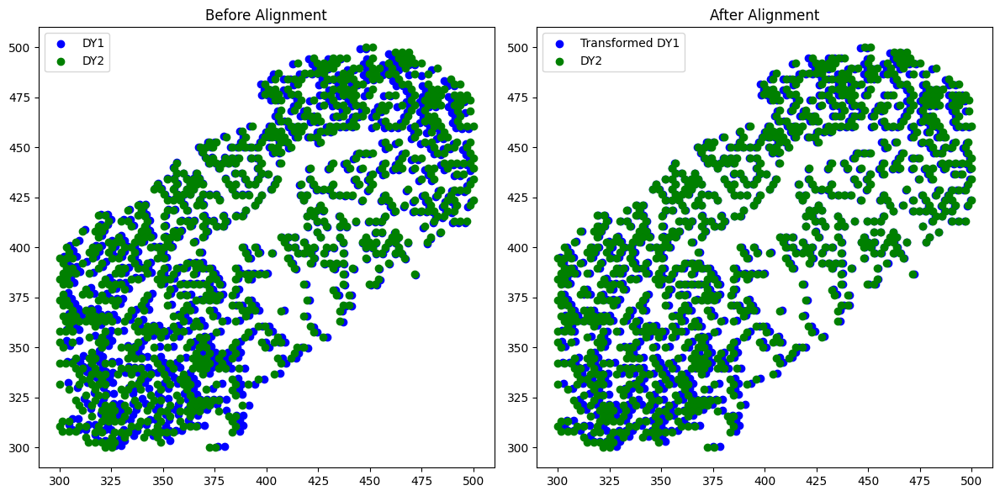

Final optimized transformation matrix:
[[ 1.0062282   0.00997056 -6.65274325]
 [ 0.00748698  0.99884421 -2.46916845]
 [ 0.          0.          1.        ]]


In [182]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
from scipy.optimize import minimize

# 示例数据集
DY1_points = data2_spatial_results.values  # Example DY1 point cloud (2D points)
DY1_features = spatial_select_high_corr_variant.to_numpy()  # Example DY2 point cloud (2D points)
DY2_points = data3_spatial_results.values  # Example DYGW1 features
DY2_features = metabolic_select_high_corr_variant.to_numpy()  # Example DYGW2 features


# 初始化变量
transformation = np.eye(3)  # 初始变换矩阵为3x3的单位矩阵

# 可视化函数
def visualize_alignment(DY1_points, DY2_points, transformation):
    fig = plt.figure(figsize=(12, 6))
    
    # 绘制未对齐前的点云
    ax1 = fig.add_subplot(121)
    ax1.scatter(DY1_points[:, 0], DY1_points[:, 1], c='b', label='DY1')
    ax1.scatter(DY2_points[:, 0], DY2_points[:, 1], c='g', label='DY2')
    ax1.set_title('Before Alignment')
    ax1.legend()

    # 对DY1进行变换
    transformed_DY1 = np.dot(transformation[:2, :2], DY1_points.T).T + transformation[:2, 2]
    
    # 绘制对齐后的点云
    ax2 = fig.add_subplot(122)
    ax2.scatter(transformed_DY1[:, 0], transformed_DY1[:, 1], c='b', label='Transformed DY1')
    ax2.scatter(DY2_points[:, 0], DY2_points[:, 1], c='g', label='DY2')
    ax2.set_title('After Alignment')
    ax2.legend()

    plt.tight_layout()
    plt.show()

# 局部特征匹配（示例：最近邻匹配）
tree_DY2 = cKDTree(DY2_points)
distances, indices = tree_DY2.query(DY1_points)

# 局部优化（示例：平移向量优化）
translation_vector = np.mean(DY2_points[indices] - DY1_points, axis=0)
transformation[:2, 2] = translation_vector  # 仅应用平移变换，忽略旋转

# 全局优化（示例：最小化点云之间的距离）
def global_optimization_function(transformation):
    transformation_matrix = transformation.reshape(2, 3)
    transformed_DY1 = np.dot(transformation_matrix[:, :2], DY1_points.T).T + transformation_matrix[:, 2]
    matched_DY2_points = DY2_points[indices]
    matched_DY2_features = DY2_features[indices]
    
    # 计算空间距离
    spatial_distance = np.sum(np.linalg.norm(transformed_DY1 - matched_DY2_points, axis=1))
    
    # 计算高维特征距离
    feature_distance = np.sum(np.linalg.norm(DY1_features - matched_DY2_features, axis=1))
    
    # 总距离（可以调整权重）
    total_distance = spatial_distance + feature_distance
    return total_distance

# 执行全局优化
result = minimize(global_optimization_function, transformation[:2, :].flatten())  # 只优化前两行，忽略最后一行

# 重新构建优化后的变换矩阵
optimized_transformation = np.eye(3)
optimized_transformation[:2, :] = result.x.reshape(2, 3)

# 可视化对齐结果
visualize_alignment(DY1_points, DY2_points, optimized_transformation)

# 输出最终的优化变换矩阵
print("Final optimized transformation matrix:")
print(optimized_transformation)


In [184]:
transformed_DY1 = np.dot(transformation[:2, :2], DY1_points.T).T + transformation[:2, 2]

In [185]:
transformed_DY1

array([[338.4497239 , 421.69956293],
       [456.99487318, 459.93964206],
       [305.03205617, 395.76990375],
       ...,
       [321.90542241, 303.72387757],
       [318.47130842, 364.13318158],
       [431.46145755, 431.30800612]])